# Classification

# Loading in Data and imports

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/MyDrive/Queens/Module2/2022QUB.xlsx'
df = pd.read_excel(file_path, sheet_name='Data')

In [ ]:
from scipy import stats
import numpy as np
import seaborn as sns
import sys
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from scipy.signal import savgol_filter
from sklearn.model_selection import StratifiedKFold, cross_validate,  KFold, cross_val_predict, train_test_split, cross_val_score
from sklearn.metrics import make_scorer, balanced_accuracy_score, f1_score, precision_score, recall_score, accuracy_score, roc_curve, auc, classification_report, confusion_matrix, roc_auc_score
from sklearn.svm import SVC, LinearSVC
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA, KernelPCA
from sklearn.tree import DecisionTreeClassifier
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier



In [ ]:
df

,SID,Type,Matrix,Load,I001,I002,I003,I004,I005,I006,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,S1,X,dmem,1,97.78,97.73,97.68,97.70,97.73,97.73,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,S1,X,dmem,1,97.75,97.70,97.70,97.71,97.71,97.72,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,S1,X,dmem,1,97.76,97.72,97.70,97.74,97.71,97.71,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,S1,X,dmem,1,97.72,97.71,97.71,97.73,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,S1,X,dmem,1,97.74,97.66,97.65,97.68,97.67,97.65,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,S4,Y,pbs,8,93.44,93.46,93.47,93.40,93.37,93.39,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3797,S4,Y,pbs,8,93.68,93.58,93.55,93.47,93.40,93.41,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3798,S4,Y,pbs,8,93.66,93.65,93.64,93.57,93.51,93.48,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3799,S4,Y,pbs,8,93.20,93.19,93.27,93.25,93.23,93.20,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


In [ ]:
df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x) #Here I am stripping leading and training whitespaces
print("\nCleaned DataFrame:")


Cleaned DataFrame:


<ipython-input-10-e7642870f330>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x) #Here I am stripping leading and training whitespaces


In [ ]:
df = df.drop(['SID',"Load"], axis=1)  # I am dropping irrelevant columns as they dont contribute to my model

print("\nDataFrame after dropping 'SID':")
print(df)


DataFrame after dropping 'SID':
     Type Matrix   I001   I002   I003   I004   I005   I006   I007   I008  ...  \
0       X   dmem  97.78  97.73  97.68  97.70  97.73  97.73  97.72  97.71  ...   
1       X   dmem  97.75  97.70  97.70  97.71  97.71  97.72  97.74  97.77  ...   
2       X   dmem  97.76  97.72  97.70  97.74  97.71  97.71  97.74  97.72  ...   
3       X   dmem  97.72  97.71  97.71  97.73  97.70  97.71  97.70  97.71  ...   
4       X   dmem  97.74  97.66  97.65  97.68  97.67  97.65  97.69  97.72  ...   
...   ...    ...    ...    ...    ...    ...    ...    ...    ...    ...  ...   
3796    Y    pbs  93.44  93.46  93.47  93.40  93.37  93.39  93.41  93.47  ...   
3797    Y    pbs  93.68  93.58  93.55  93.47  93.40  93.41  93.37  93.29  ...   
3798    Y    pbs  93.66  93.65  93.64  93.57  93.51  93.48  93.45  93.43  ...   
3799    Y    pbs  93.20  93.19  93.27  93.25  93.23  93.20  93.20  93.23  ...   
3800    Y    pbs  93.44  93.34  93.30  93.28  93.26  93.26  93.22  93.21  ..

# Exploration and Removal of outliers

In [ ]:
df.describe()

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
count,3801.00000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,...,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000
mean,94.65562,94.645662,94.640797,94.629976,94.617727,94.609816,94.577929,94.550316,94.531181,94.510652,...,85.624488,86.004936,86.365491,86.747143,87.125264,87.331589,87.534875,87.741886,87.914770,88.071718
std,2.57733,2.584697,2.584932,2.591785,2.593300,2.588944,2.585280,2.575187,2.572254,2.577260,...,2.130029,2.181635,2.215189,2.232610,2.246044,2.286217,2.299715,2.304504,2.331248,2.379595
min,80.95000,80.890000,80.830000,80.800000,80.760000,80.840000,80.910000,80.890000,80.830000,80.840000,...,71.640000,71.950000,72.190000,72.550000,73.030000,73.210000,73.290000,73.240000,73.110000,72.940000
25%,92.87000,92.870000,92.860000,92.820000,92.800000,92.760000,92.740000,92.750000,92.740000,92.700000,...,84.500000,84.830000,85.180000,85.590000,85.940000,86.120000,86.290000,86.450000,86.570000,86.700000
50%,94.53000,94.510000,94.520000,94.510000,94.480000,94.490000,94.440000,94.430000,94.410000,94.380000,...,86.000000,86.430000,86.760000,87.110000,87.490000,87.670000,87.840000,88.020000,88.180000,88.300000
75%,96.07000,96.040000,96.030000,96.030000,96.020000,96.030000,96.010000,95.970000,95.940000,95.910000,...,87.070000,87.530000,87.900000,88.260000,88.640000,88.900000,89.170000,89.380000,89.570000,89.730000
max,100.71000,100.620000,100.550000,100.540000,100.540000,100.440000,100.310000,100.230000,100.220000,100.250000,...,90.100000,90.810000,91.300000,91.650000,91.900000,92.090000,92.410000,92.600000,92.960000,93.580000


In [ ]:
df.count().sort_values()

,0
I503,3801
I504,3801
I505,3801
I506,3801
I507,3801
...,...
I036,3801
I037,3801
I038,3801
I512,3801


In [ ]:
z = np.abs(stats.zscore(df._get_numeric_data())) #Converting data to its z-score so that it can be used to detect outliers
print(z)

          I001      I002      I003      I004      I005      I006      I007  \
0     1.212414  1.193464  1.175893  1.184677  1.200278  1.205354  1.215529   
1     1.200773  1.181856  1.183631  1.188536  1.192565  1.201491  1.223266   
2     1.204653  1.189595  1.183631  1.200112  1.192565  1.197628  1.223266   
3     1.189131  1.185726  1.187500  1.196253  1.188709  1.197628  1.207792   
4     1.196892  1.166378  1.164285  1.176959  1.177139  1.174450  1.203924   
...        ...       ...       ...       ...       ...       ...       ...   
3796  0.471721  0.458784  0.452991  0.474630  0.481198  0.471225  0.451821   
3797  0.378589  0.412351  0.422038  0.447618  0.469628  0.463499  0.467295   
3798  0.386350  0.385265  0.387217  0.409029  0.427206  0.436458  0.436346   
3799  0.564852  0.563259  0.530373  0.532512  0.535190  0.544624  0.533060   
3800  0.471721  0.505217  0.518765  0.520936  0.523621  0.521446  0.525323   

          I008      I009      I010  ...      I503      I504    

In [ ]:
df= df[(z < 3).all(axis=1)] #Here I am removing any rows outside the threshold of 3 std of the mean
print(df.shape)
df.reset_index(drop=True, inplace=True)

(3735, 514)


In [ ]:
df

,Type,Matrix,I001,I002,I003,I004,I005,I006,I007,I008,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,X,dmem,97.78,97.73,97.68,97.70,97.73,97.73,97.72,97.71,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,X,dmem,97.75,97.70,97.70,97.71,97.71,97.72,97.74,97.77,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,X,dmem,97.76,97.72,97.70,97.74,97.71,97.71,97.74,97.72,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,X,dmem,97.72,97.71,97.71,97.73,97.70,97.71,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,X,dmem,97.74,97.66,97.65,97.68,97.67,97.65,97.69,97.72,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3730,Y,pbs,93.44,93.46,93.47,93.40,93.37,93.39,93.41,93.47,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3731,Y,pbs,93.68,93.58,93.55,93.47,93.40,93.41,93.37,93.29,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3732,Y,pbs,93.66,93.65,93.64,93.57,93.51,93.48,93.45,93.43,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3733,Y,pbs,93.20,93.19,93.27,93.25,93.23,93.20,93.20,93.23,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


## Correlation

In [ ]:

subset_columns = [f'I{str(i).zfill(3)}' for i in range(100, 111)]
subset_df = df[subset_columns]


sns.pairplot(subset_df,
             kind="scatter",
             diag_kind="kde",
             plot_kws={'alpha':0.5, 's':20},
             diag_kws={'shade':True})

plt.suptitle("Distribution and Correlation of I100 to I110", y=1.02, fontsize=16)
plt.show()


# Data Preprocessing

In [ ]:
df

,Type,Matrix,I001,I002,I003,I004,I005,I006,I007,I008,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,X,dmem,97.78,97.73,97.68,97.70,97.73,97.73,97.72,97.71,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,X,dmem,97.75,97.70,97.70,97.71,97.71,97.72,97.74,97.77,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,X,dmem,97.76,97.72,97.70,97.74,97.71,97.71,97.74,97.72,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,X,dmem,97.72,97.71,97.71,97.73,97.70,97.71,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,X,dmem,97.74,97.66,97.65,97.68,97.67,97.65,97.69,97.72,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3730,Y,pbs,93.44,93.46,93.47,93.40,93.37,93.39,93.41,93.47,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3731,Y,pbs,93.68,93.58,93.55,93.47,93.40,93.41,93.37,93.29,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3732,Y,pbs,93.66,93.65,93.64,93.57,93.51,93.48,93.45,93.43,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3733,Y,pbs,93.20,93.19,93.27,93.25,93.23,93.20,93.20,93.23,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


       I001      I002      I003      I004      I005      I006      I007  \
0  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307  1.385305   
1  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885  1.262517   
2  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782  1.177441   
3  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997  1.130078   
4  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531  1.120427   

       I008      I009      I010  ...      I503      I504      I505      I506  \
0  1.398189  1.397284  1.392237  ... -0.778276 -0.419804 -0.341288 -0.382181   
1  1.280494  1.281227  1.277316  ... -1.012109 -0.676742 -0.582163 -0.648616   
2  1.198953  1.201050  1.197989  ... -1.175917 -0.866121 -0.758706 -0.842211   
3  1.153566  1.156754  1.154255  ... -1.269700 -0.987940 -0.870917 -0.962967   
4  1.144335  1.148338  1.146114  ... -1.293456 -1.042199 -0.918796 -1.010885   

       I507      I508      I509      I510      I511      I512  
0 -0

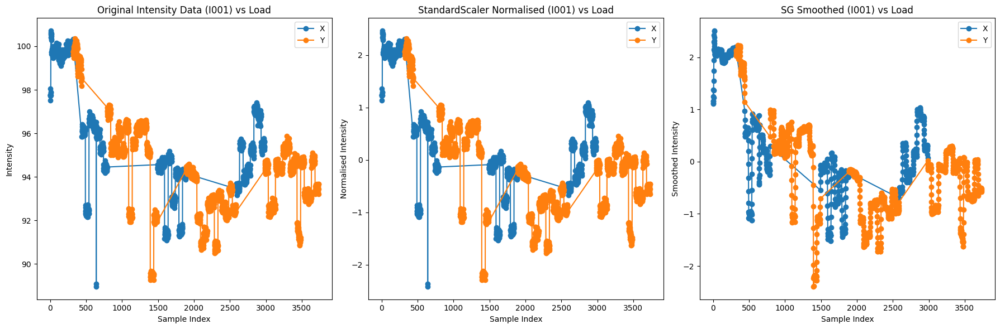

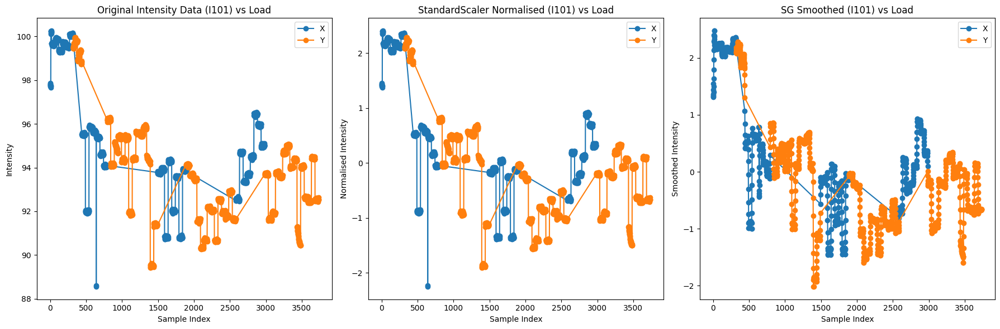

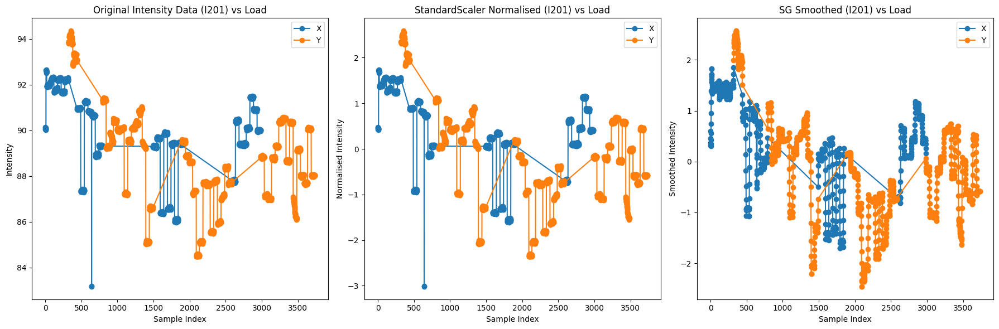

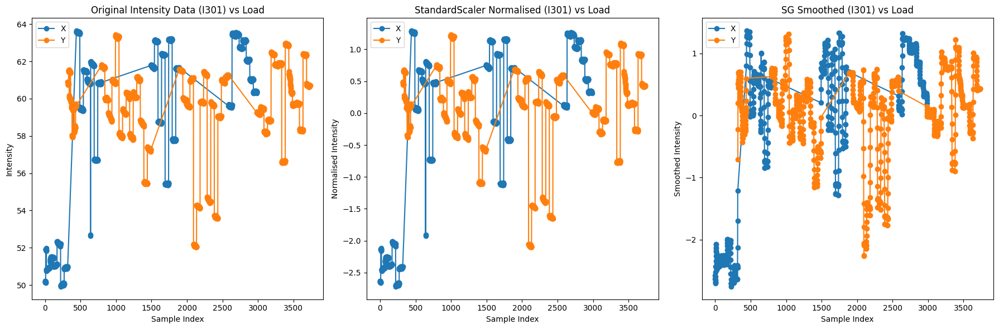

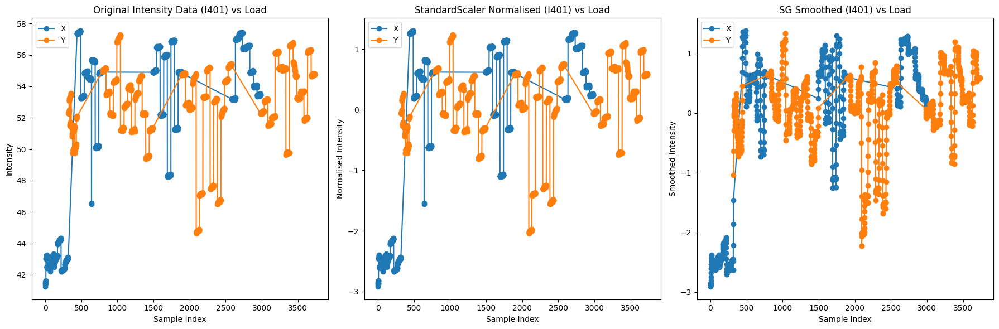

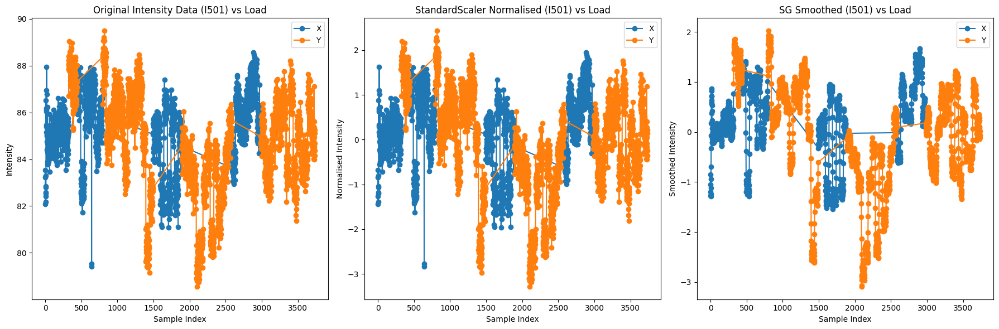

In [ ]:
intensity_columns = df.columns[2:] # I am extracting the wavelength columsn

scaler = StandardScaler()  # I am normalising the data
normalised_data = scaler.fit_transform(df[intensity_columns])

normalised_df = pd.DataFrame(normalised_data, columns=intensity_columns)
window_length = 13 # Here I define a window length and polynomial order for Savitzky-Golay smoothing which must be odd and greater than the polynomial order
poly_order = 2

smoothed_data = {
    col: savgol_filter(normalised_df[col], window_length, poly_order)
    for col in normalised_df.columns
}

# I apply Savitzky-Golay filter to each column - I chose window length 13 and poly order 2 after a trial and error process
smoothed_df = pd.DataFrame(smoothed_data, columns=intensity_columns)
print(smoothed_df.head())


# Here I am defining a function to plot original, normalised, and smoothed data and compare their distributions to see the effect of the preprocessing on the data
def plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_column):
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title(f'Original Intensity Data ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(df[df['Type'] == sample_type].index, df[df['Type'] == sample_type][intensity_column],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Intensity')

    plt.subplot(1, 3, 2)
    plt.title(f'StandardScaler Normalised ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(normalised_df.index[df['Type'] == sample_type],
                 normalised_df[intensity_column][df['Type'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Normalised Intensity')

    plt.subplot(1, 3, 3)
    plt.title(f'SG Smoothed ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(smoothed_df.index[df['Type'] == sample_type],
                 smoothed_df[intensity_column][df['Type'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Smoothed Intensity')

    plt.tight_layout()
    plt.show()

for intensity_col in ['I001', 'I101', 'I201', 'I301', 'I401', 'I501']:
    plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_col)


In [ ]:
other_columns = df.drop(df.columns[df.columns.str.startswith('I')], axis=1) # Get out the other columsn to add back

In [ ]:
final_df = pd.concat([other_columns,smoothed_df], axis=1) #I combine with standarised data
print(final_df.head())

  Type Matrix      I001      I002      I003      I004      I005      I006  \
0    X   dmem  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1    X   dmem  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2    X   dmem  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3    X   dmem  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4    X   dmem  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   

       I007      I008  ...      I503      I504      I505      I506      I507  \
0  1.385305  1.398189  ... -0.778276 -0.419804 -0.341288 -0.382181 -0.285831   
1  1.262517  1.280494  ... -1.012109 -0.676742 -0.582163 -0.648616 -0.571306   
2  1.177441  1.198953  ... -1.175917 -0.866121 -0.758706 -0.842211 -0.777739   
3  1.130078  1.153566  ... -1.269700 -0.987940 -0.870917 -0.962967 -0.905131   
4  1.120427  1.144335  ... -1.293456 -1.042199 -0.918796 -1.010885 -0.953481   

       I508      I509      I510      I511      I512  
0 

In [ ]:
final_df.replace({'Type': {'X': 0, 'Y': 1}}, inplace=True) #Here I am replacing teh target variables so taht they are compatable with the different models
print("Unique values in 'Type' after encoding:", df['Type'].unique())


Unique values in 'Type' after encoding: ['X' 'Y']


<ipython-input-22-2491a5f44f77>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df.replace({'Type': {'X': 0, 'Y': 1}}, inplace=True) #Here I am replacing teh target variables so taht they are compatable with the different models


In [ ]:
print(final_df)

      Type Matrix      I001      I002      I003      I004      I005      I006  \
0        0   dmem  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1        0   dmem  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2        0   dmem  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3        0   dmem  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4        0   dmem  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   
...    ...    ...       ...       ...       ...       ...       ...       ...   
3730     1    pbs -0.503679 -0.521761 -0.529565 -0.545238 -0.553095 -0.556178   
3731     1    pbs -0.513993 -0.531942 -0.536937 -0.551677 -0.559837 -0.562346   
3732     1    pbs -0.530150 -0.547252 -0.548068 -0.561382 -0.570010 -0.571888   
3733     1    pbs -0.552148 -0.567689 -0.562958 -0.574350 -0.583614 -0.584805   
3734     1    pbs -0.579988 -0.593255 -0.581606 -0.590584 -0.600648 -0.601096   

          I007      I008  .

In [ ]:
df["Type"].value_counts() # can see here that there is a class imbalance that I must account for

,count
Type,
Y,2263
X,1472


In [ ]:
dmem_train = final_df[final_df['Matrix'] == 'dmem'].reset_index(drop=True)  # Split my data based on matrix as otherwise the clustering would make no sense
pbs_train= final_df[final_df['Matrix'] == 'pbs'].reset_index(drop=True)

print("DataFrame for dmem:")
print(dmem_train)
print("\nDataFrame for pbs:")
print(pbs_train)

DataFrame for dmem:
      Type Matrix      I001      I002      I003      I004      I005      I006  \
0        0   dmem  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1        0   dmem  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2        0   dmem  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3        0   dmem  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4        0   dmem  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   
...    ...    ...       ...       ...       ...       ...       ...       ...   
1819     1   dmem  0.260271  0.273770  0.302425  0.318230  0.332868  0.333092   
1820     1   dmem  0.230182  0.241550  0.269747  0.287555  0.301760  0.305773   
1821     1   dmem  0.191874  0.204236  0.229689  0.244848  0.253845  0.261560   
1822     1   dmem  0.128269  0.142373  0.165289  0.180613  0.187104  0.198056   
1823     1   dmem  0.051334  0.070205  0.093016  0.108212  0.112290  0.125052   

       

In [ ]:
#In order to get some X and Y target instead of just Y I had to go with a 70/30 splity which isnt ideal as I lose training data but otherise I wouldve had only 1 class
X_dmem = dmem_train.drop(['Type', 'Matrix'], axis=1)
y_dmem = dmem_train['Type']
split_index_dmem = int(0.70 * len(X_dmem))

X_dmem_train, X_dmem_test = X_dmem[:split_index_dmem], X_dmem[split_index_dmem:]
y_dmem_train, y_dmem_test = y_dmem[:split_index_dmem], y_dmem[split_index_dmem:]

X_pbs = pbs_train.drop(['Type', 'Matrix'], axis=1)
y_pbs = pbs_train['Type']

split_index_pbs = int(0.70 * len(X_pbs))

X_pbs_train, X_pbs_test = X_pbs[:split_index_pbs], X_pbs[split_index_pbs:]
y_pbs_train, y_pbs_test = y_pbs[:split_index_pbs], y_pbs[split_index_pbs:]


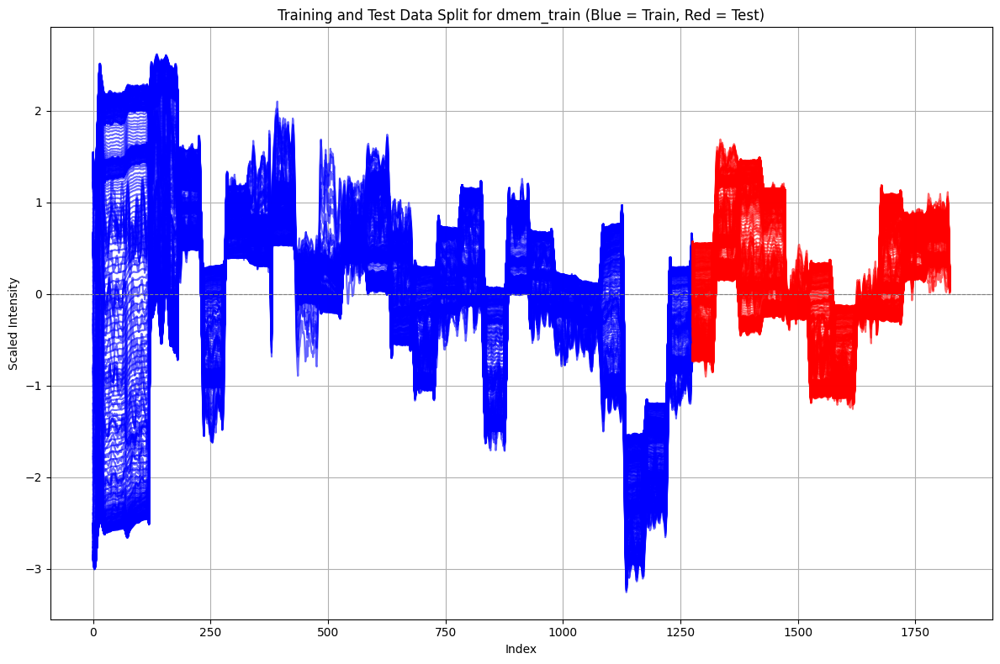

In [ ]:
plt.figure(figsize=(12, 8)) # Essentially I am taking SID 4 as my test set

X_dmem_train_df = pd.DataFrame(X_dmem_train, columns=X_dmem.columns)
X_dmem_test_df = pd.DataFrame(X_dmem_test, columns=X_dmem.columns)
for col in X_dmem_train_df.columns:
    plt.plot(X_dmem_train_df.index, X_dmem_train_df[col], label=f"Train - {col}", color='blue', alpha=0.6)
for col in X_dmem_test_df.columns:
    plt.plot(X_dmem_test_df.index, X_dmem_test_df[col], label=f"Test - {col}", color='red', alpha=0.6)

plt.xlabel("Index")
plt.ylabel("Scaled Intensity")
plt.title("Training and Test Data Split for dmem_train (Blue = Train, Red = Test)")
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8)
plt.grid(True)

plt.tight_layout()
plt.show()

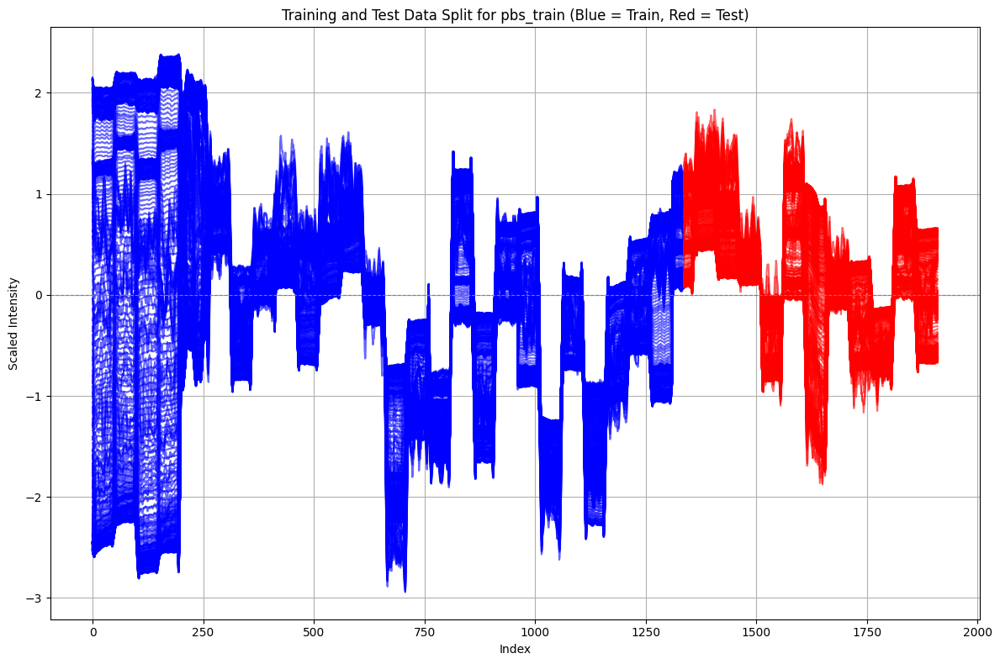

In [ ]:
X_pbs_train_df = pd.DataFrame(X_pbs_train, columns=X_pbs.columns)
X_pbs_test_df = pd.DataFrame(X_pbs_test, columns=X_pbs.columns)

plt.figure(figsize=(12, 8))

for col in X_pbs_train_df.columns:
    plt.plot(X_pbs_train_df.index, X_pbs_train_df[col], color='blue', alpha=0.6)

for col in X_pbs_test_df.columns:
    plt.plot(X_pbs_test_df.index, X_pbs_test_df[col], color='red', alpha=0.6)

plt.xlabel("Index")
plt.ylabel("Scaled Intensity")
plt.title("Training and Test Data Split for pbs_train (Blue = Train, Red = Test)")
plt.axhline(0, color='grey', linestyle='--', linewidth=0.8)
plt.grid(True)

plt.tight_layout()
plt.show()

# Dmem

## Basic models with no feature selection or hyperparameter tuning for DMEM

In [ ]:
def evaluate_model(model, X, y, model_name, n_splits=10): #This is a function I iwll use to implement CV and asses training vs validation metrics

    ls_metrics = {
        "balanced_accuracy": "balanced_accuracy", # This gives equal weight to the performance of my model in all classes
        "f1_weighted": "f1_weighted",  # To asses fit
        "precision_weighted": "precision_weighted",
        "recall_weighted": "recall_weighted"
    }

    cv = StratifiedKFold(n_splits=n_splits,shuffle=False) # I used Stratified K-fold cv here to try account for ths class imablance - set shuffle = False to avoid data leakage

    results = cross_validate(model, X, y, cv=cv, return_train_score=True, scoring=ls_metrics) #Here I implement the CV

#Have to create lists for my metrics
    all_results = {
        model_name: {
            'train_balanced_accuracy': results['train_balanced_accuracy'],
            'test_balanced_accuracy': results['test_balanced_accuracy'],
            'train_f1_score_weighted': results['train_f1_weighted'],
            'test_f1_score_weighted': results['test_f1_weighted'],
            'train_precision_weighted': results['train_precision_weighted'],
            'test_precision_weighted': results['test_precision_weighted'],
            'train_recall_weighted': results['train_recall_weighted'],
            'test_recall_weighted': results['test_recall_weighted'],
        }
    }

    # I need to get the average of each metric over the 10 folds. Then I print
    average_results = {
        model_name: {
            metric: np.mean(scores) for metric, scores in all_results[model_name].items()
        }
    }
    for model_name, scores in average_results.items():
        print(f"{model_name} - Training Balanced Accuracy: {scores['train_balanced_accuracy']:.3f}, "
              f"Validation Balanced Accuracy: {scores['test_balanced_accuracy']:.3f}, "
              f"Training F1 Score: {scores['train_f1_score_weighted']:.3f}, "
              f"Validation F1 Score: {scores['test_f1_score_weighted']:.3f}, "
              f"Training Precision: {scores['train_precision_weighted']:.3f}, "
              f"Validation Precision: {scores['test_precision_weighted']:.3f}, "
              f"Training Recall: {scores['train_recall_weighted']:.3f}, "
              f"Validation Recall: {scores['test_recall_weighted']:.3f}")

#This is then me preparing the data for plotting by getting the scpre at each split
    metrics_labels = ['balanced_accuracy', 'f1_weighted', 'precision_weighted', 'recall_weighted']
    x = np.arange(n_splits)

    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
    for i, metric in enumerate(metrics_labels):
        train_metric_key = f'train_{metric}'
        test_metric_key = f'test_{metric}'

        # This plotting teachnique was one I found online to help me visualise the way I want
        ax[i // 2, i % 2].plot(x, results[train_metric_key], label='Training', marker='o')
        ax[i // 2, i % 2].plot(x, results[test_metric_key], label='Validation', marker='o')

        ax[i // 2, i % 2].set_xticks(x)
        ax[i // 2, i % 2].set_xticklabels([f'Fold {j + 1}' for j in x])
        ax[i // 2, i % 2].set_title(f'Training vs Validation {metric.replace("_", " ").title()}')
        ax[i // 2, i % 2].set_ylim(0, 1)
        ax[i // 2, i % 2].legend()
        ax[i // 2, i % 2].grid()

    plt.tight_layout()
    plt.show()


Logistic Regression - Training Balanced Accuracy: 0.999, Validation Balanced Accuracy: 0.874, Training F1 Score: 0.999, Validation F1 Score: 0.856, Training Precision: 0.999, Validation Precision: 0.921, Training Recall: 0.999, Validation Recall: 0.875


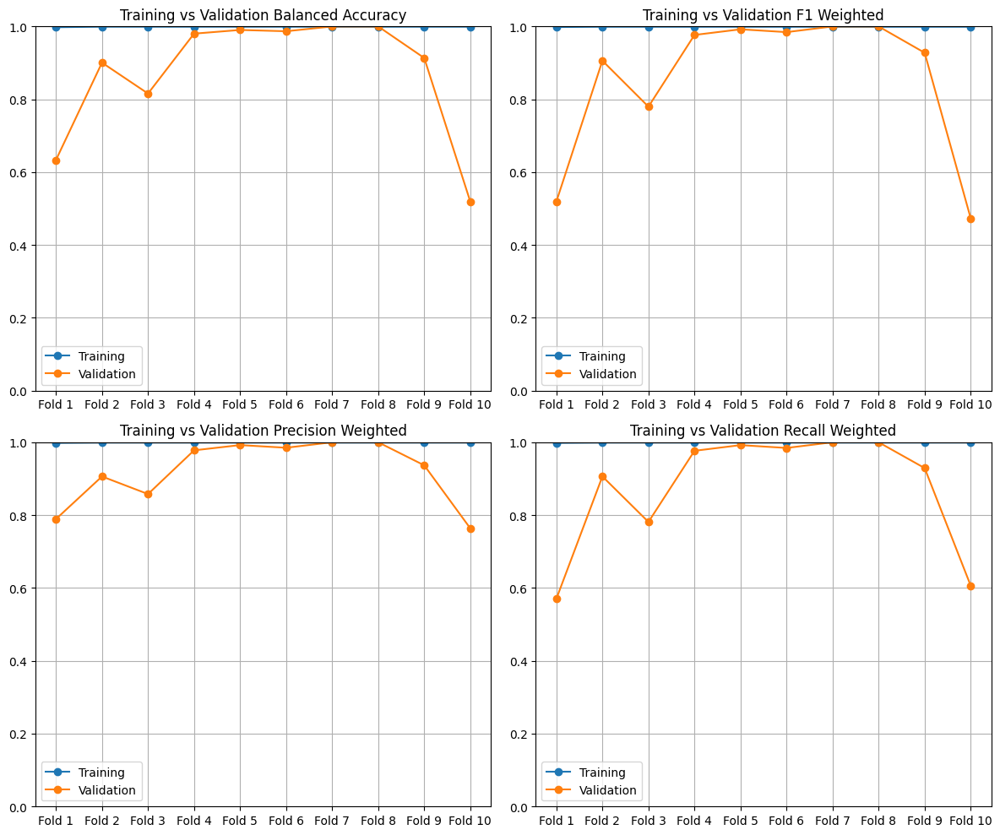

In [ ]:
lr_model = LogisticRegression(max_iter = 10000) #Here I am calling a base Logistic function and tetsing use CV above
evaluate_model(lr_model, X_dmem_train, y_dmem_train, "Logistic Regression", n_splits=10)

SVC - Training Balanced Accuracy: 0.875, Validation Balanced Accuracy: 0.552, Training F1 Score: 0.879, Validation F1 Score: 0.524, Training Precision: 0.882, Validation Precision: 0.586, Training Recall: 0.879, Validation Recall: 0.590


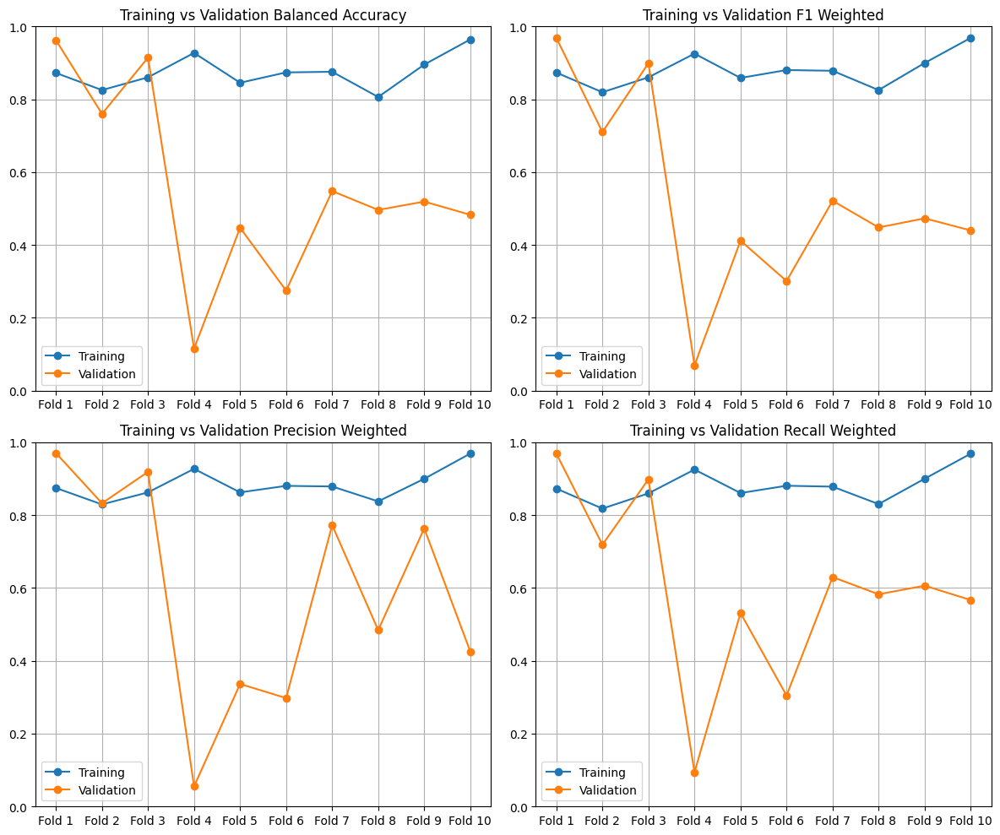

In [ ]:
#Then I applied the same analysis to a support vector classifier
svc_model = SVC(probability=True, max_iter=10000)
evaluate_model(svc_model, X_dmem_train, y_dmem_train, "SVC", n_splits=10)


In [ ]:
#Here I wanted to analuse if there was roiughly the same class imbalnce between tarining and test
unique, counts = np.unique(y_dmem_train, return_counts=True)
print("Training data:",dict(zip(unique, counts)))

unique, counts = np.unique(y_dmem_test, return_counts=True)
print("Test data:",dict(zip(unique, counts)))

Training data: {0: 522, 1: 754}
Test data: {0: 198, 1: 350}


## PCA



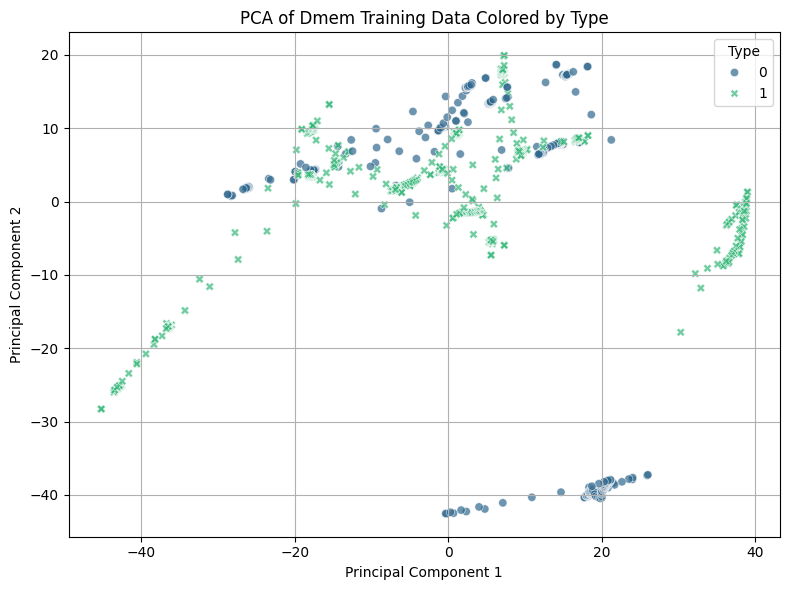

Explained variance by each principal component: [0.57101764 0.42262151 0.00302848 0.00119669 0.00070688]
Total explained variance: 0.9985711932307856


In [ ]:
pca = PCA(n_components=5)
X_dmem_train_pca = pca.fit_transform(X_dmem_train) #This is me just perfomring PCA on my data with 5 components
pca_df = pd.DataFrame(data=X_dmem_train_pca, columns=['PC1', 'PC2','PC3', 'PC4','PC5'])
pca_df['Type'] = y_dmem_train #to visiualise by colour

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Type', style='Type', palette='viridis', alpha=0.7)

plt.title('PCA of Dmem Training Data Colored by Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.tight_layout()
plt.legend(title='Type')
plt.show()

explained_variance = pca.explained_variance_ratio_
print(f'Explained variance by each principal component: {explained_variance}')
print(f'Total explained variance: {sum(explained_variance)}')


In [ ]:
X_dmem_test_pca = pca.transform(X_dmem_test) # As I transformed the Training data I need to tranform the Test too

In [ ]:
#This cell was simply just experimental, as I wanted to examine if the PCA data was performing okay
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_dmem_train_pca, y_dmem_train)
y_pred = clf.predict(X_dmem_test_pca)
score = accuracy_score(y_dmem_test, y_pred)
f1 = f1_score(y_dmem_test, y_pred, average='weighted')
print('Logistic Regression - Accuracy:', score)
print('Logistic Regression - F1 score:', f1)

clf_svc = LinearSVC(class_weight='balanced')
clf_svc.fit(X_dmem_train_pca, y_dmem_train)
y_pred = clf_svc.predict(X_dmem_test_pca)
score = accuracy_score(y_dmem_test, y_pred)
f1 = f1_score(y_dmem_test, y_pred, average='weighted')
print('Linear SVC - Accuracy:', score)
print('Linear SVC - F1 score:', f1)

clf_dt = DecisionTreeClassifier(random_state=0, class_weight='balanced')
clf_dt.fit(X_dmem_train_pca, y_dmem_train)
y_pred = clf_dt.predict(X_dmem_test_pca)
score = accuracy_score(y_dmem_test, y_pred)
f1 = f1_score(y_dmem_test, y_pred, average='weighted')
print('Decision Tree - Accuracy:', score)
print('Decision Tree - F1 score:', f1)

clf_sgd = SGDClassifier(random_state=42, max_iter=1000, tol=1e-3, class_weight='balanced')
clf_sgd.fit(X_dmem_train_pca, y_dmem_train)
y_pred = clf_sgd.predict(X_dmem_test_pca)
score = accuracy_score(y_dmem_test, y_pred)
f1 = f1_score(y_dmem_test, y_pred, average='weighted')
print('SGD Classifier - Accuracy:', score)
print('SGD Classifier - F1 score:', f1)


Logistic Regression - Accuracy: 0.8357664233576643
Logistic Regression - F1 score: 0.8388576442902157
Linear SVC - Accuracy: 0.8357664233576643
Linear SVC - F1 score: 0.8388576442902157
Decision Tree - Accuracy: 0.5967153284671532
Decision Tree - F1 score: 0.5998003019557051
SGD Classifier - Accuracy: 0.7244525547445255
SGD Classifier - F1 score: 0.7245911070208384


## PLS

Due to the nature of PLS and the fact it interacts with the target ariable too, I felt it could be an effective way too classify the data using PLS-DA

In [ ]:
# I use `[0]` to extract only the transformed predictor variables (X_scores) because `fit_transform`
# returns a tuple where the first element is X_scores and the second is Y_scores.
pls_binary =PLSRegression(n_components=10)
X_pls = pls_binary.fit_transform(X_dmem_train, y_dmem_train)[0]

In [ ]:
X_dmem_test.shape

(548, 512)

In [ ]:
pls_binary = PLSRegression(n_components=10)
# Fit on my the training set
pls_binary.fit(X_dmem_train, y_dmem_train)

y_pred = pls_binary.predict(X_dmem_test)
# Here I "Force" binary prediction by thresholding
binary_prediction = (y_pred > 0.5).astype('uint8')
print(binary_prediction)
print(y_dmem_test)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0
 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

Basic PLSDA

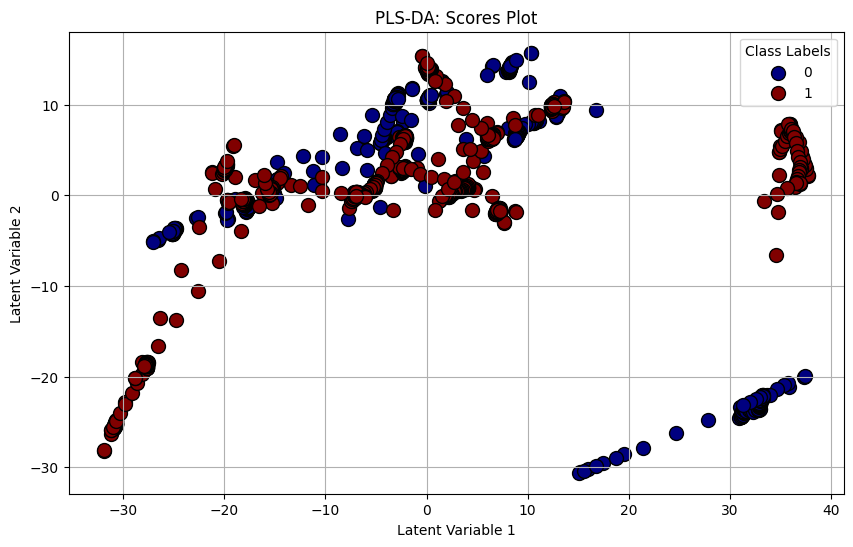

In [ ]:
#I initialise a PLS regression model with 4 components and fit it to my training data.
plsr = PLSRegression(n_components=4, scale=False)
plsr.fit(X_dmem_train, y_dmem_train)

#I extract the PLS scores (X_scores) for visualisation.
X_scores = plsr.x_scores_

#I create a scatter plot of the first two PLS scores, using different colors for each unique class in `y_dmem_train`.
plt.figure(figsize=(10, 6))
colors = plt.cm.jet(np.linspace(0, 1, len(np.unique(y_dmem_train))))

for idx, label in enumerate(np.unique(y_dmem_train)):
    plt.scatter(X_scores[y_dmem_train == label, 0], X_scores[y_dmem_train == label, 1],
                color=colors[idx], label=str(label), edgecolors='k', s=100)

plt.title('PLS-DA: Scores Plot')
plt.xlabel('Latent Variable 1')
plt.ylabel('Latent Variable 2')
plt.legend(title='Class Labels')
plt.grid(True)
plt.show()


In [ ]:
def pls_da(X_train, y_train, X_test): # To make my code neater just made a function

    plsda = PLSRegression(n_components=4)
    plsda.fit(X_train, y_train)
    binary_prediction = (plsda.predict(X_test) > 0.5).astype('uint8')

    return binary_prediction


Average accuracy on 10 splits:  0.8887118602362205


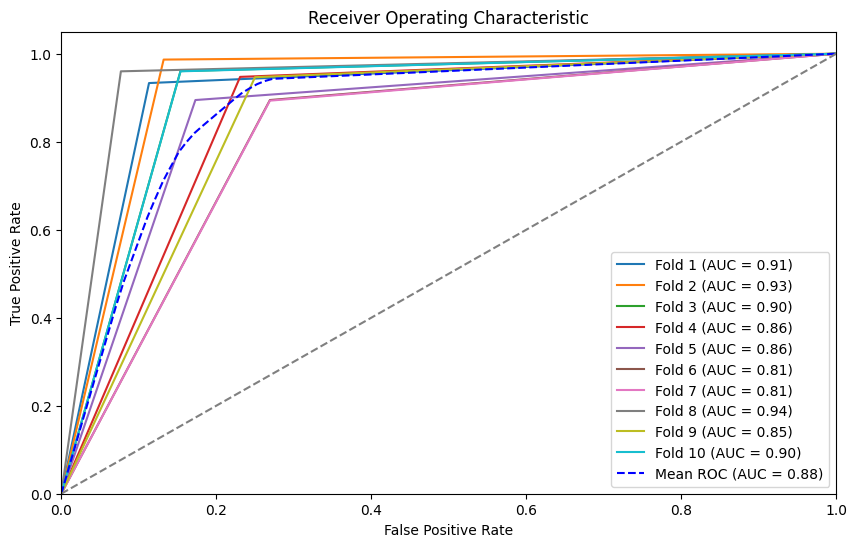

In [ ]:
#Lists for my metrics
accuracy = []
fpr_list = []
tpr_list = []
roc_auc_list = []

cval = StratifiedKFold(n_splits=10, shuffle=True, random_state=19)
X_train_np = X_dmem_train.to_numpy() # Needed this so that I could use indexing for nested cross validation
y_train_np = y_dmem_train.to_numpy()

# Implement my CV
for train_idx, test_idx in cval.split(X_train_np, y_train_np):
  #Train and test for each fold
    X_train_fold, X_test_fold = X_train_np[train_idx, :], X_train_np[test_idx, :]
    y_train_fold, y_test_fold = y_train_np[train_idx], y_train_np[test_idx]

    # Uisng my PLS_DA function defined above
    y_pred_proba = pls_da(X_train_fold, y_train_fold, X_test_fold)  # This should give probabilities

    # Calculate accuracy for the current fold
    accuracy.append(accuracy_score(y_test_fold, y_pred_proba))
    fpr, tpr, _ = roc_curve(y_test_fold, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr)
    tpr_list.append(tpr)
    roc_auc_list.append(roc_auc)

# I print the average accuracy across all folds
print("Average accuracy on 10 splits: ", np.array(accuracy).mean())

# Plot my ROC curve
plt.figure(figsize=(10, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], label=f'Fold {i + 1} (AUC = {roc_auc_list[i]:.2f})')

# Plotting my average ROC curve to show overall performance
mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
#Need to calulate mean for True Positive rate
for i in range(len(fpr_list)):
    mean_tpr += np.interp(mean_fpr, fpr_list[i], tpr_list[i])

mean_tpr /= len(fpr_list)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', linestyle='--',
         label=f'Mean ROC (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()




Test set accuracy:  0.8248175182481752

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.99      0.80       198
           1       1.00      0.73      0.84       350

    accuracy                           0.82       548
   macro avg       0.84      0.86      0.82       548
weighted avg       0.88      0.82      0.83       548



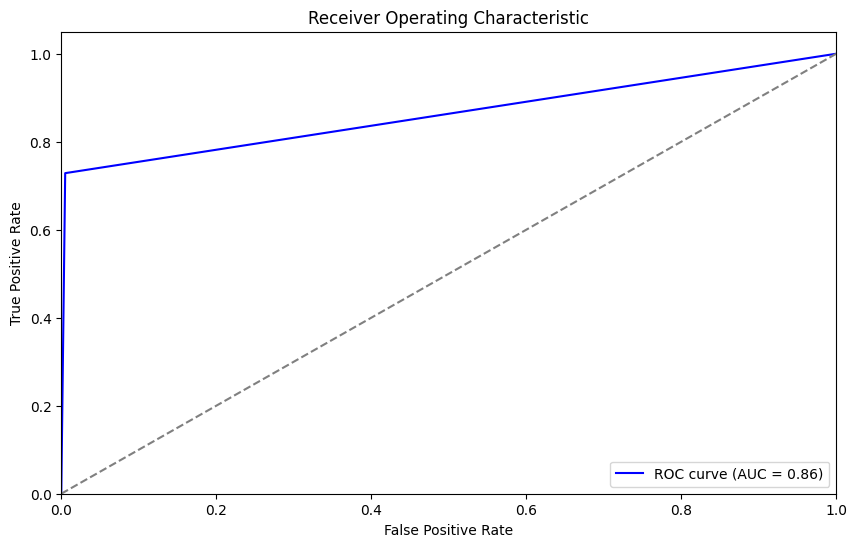

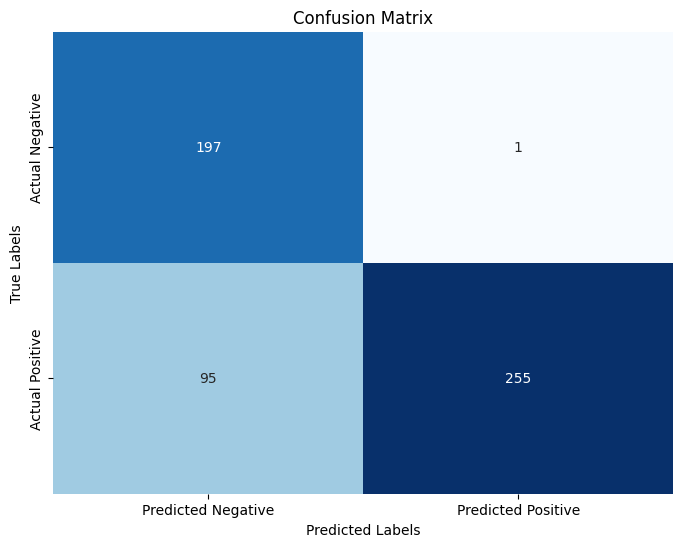

In [ ]:
#This is applying the same thing as above but testing on my test set
y_pred_test_proba = pls_da(X_train_np, y_train_np, X_dmem_test.to_numpy())
test_accuracy = accuracy_score(y_dmem_test.to_numpy(), (y_pred_test_proba > 0.5).astype('uint8'))
print("Test set accuracy: ", test_accuracy)

print("\nClassification Report:")
print(classification_report(y_dmem_test.to_numpy(), (y_pred_test_proba > 0.5).astype('uint8')))
fpr, tpr, thresholds = roc_curve(y_dmem_test.to_numpy(), y_pred_test_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

y_pred_test = (y_pred_test_proba > 0.5).astype('uint8')
conf_matrix = confusion_matrix(y_dmem_test.to_numpy(), y_pred_test)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=False,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#test set accuracy is solid but there is a clear issue with precision on the 0 (x) class

## Logistic with L1

Next I wanted to examine another feature extraction method by examining regualrisation. Using Lasso, it will put some of the features to zero which makes it usitable for my task over ridge

In [ ]:
#This is the parameter that tunes the intensity of my Lasso regualrisatin.
C_values = [0.1, 0.5, 1, 10]

cv_accuracies = []
cv_aucs = []
cv_f1_scores = []

# wanted to perform CV using stratified CV to examone the performance across a range of C values - I look at Accuracy. F1 and AUC
for C in C_values:
    log_reg = LogisticRegression(C=C, penalty='l1', solver='saga', max_iter=1000, random_state=42)
    cv_accuracy = cross_val_score(log_reg, X_dmem_train, y_dmem_train, cv=StratifiedKFold(n_splits=10), scoring='accuracy')
    cv_accuracies.append(cv_accuracy)
    cv_auc = cross_val_score(log_reg, X_dmem_train, y_dmem_train, cv=StratifiedKFold(n_splits=10), scoring='roc_auc')
    cv_aucs.append(cv_auc)
    cv_f1 = cross_val_score(log_reg, X_dmem_train, y_dmem_train, cv=StratifiedKFold(n_splits=10), scoring='f1')
    cv_f1_scores.append(cv_f1)

# Get mean validation scores
mean_accuracy = [np.mean(cv_acc) for cv_acc in cv_accuracies]
mean_auc = [np.mean(cv_auc) for cv_auc in cv_aucs]
mean_f1 = [np.mean(cv_f1) for cv_f1 in cv_f1_scores]

# Print the cross-validation scores for each C value
for idx, C in enumerate(C_values):
    print(f'C = {C}')
    print(f'  Mean Accuracy (CV): {mean_accuracy[idx]:.4f}')
    print(f'  Mean AUC (CV): {mean_auc[idx]:.4f}')
    print(f'  Mean F1 Score (CV): {mean_f1[idx]:.4f}')
    print()

# It appears that a low C is too harsh and results in no parameters at all so a higher C value is more suitable


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which 

C = 0.1
  Mean Accuracy (CV): 0.7429
  Mean AUC (CV): 0.7199
  Mean F1 Score (CV): 0.7680

C = 0.5
  Mean Accuracy (CV): 0.8394
  Mean AUC (CV): 0.9154
  Mean F1 Score (CV): 0.8375

C = 1
  Mean Accuracy (CV): 0.8457
  Mean AUC (CV): 0.9470
  Mean F1 Score (CV): 0.8392

C = 10
  Mean Accuracy (CV): 0.8590
  Mean AUC (CV): 0.9704
  Mean F1 Score (CV): 0.8550



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [ ]:
best_C = C_values[np.argmax(mean_f1)]  # I chose F1 based C so that it would ensure best fit and avoid overfitting
print(f'Best C based on F1 score: {best_C}')

# # Traun on the best C value from CV
final_log_reg = LogisticRegression(C=best_C, penalty='l1', solver='saga', max_iter=5000,random_state=42)
final_log_reg.fit(X_dmem_train, y_dmem_train)

# Evaluate final model
train_accuracy = final_log_reg.score(X_dmem_train, y_dmem_train)
train_auc = roc_auc_score(y_dmem_train, final_log_reg.predict_proba(X_dmem_train)[:, 1])
train_f1 = f1_score(y_dmem_train, final_log_reg.predict(X_dmem_train))

print(f'Final Model Training Accuracy: {train_accuracy:.4f}')
print(f'Final Model Training AUC: {train_auc:.4f}')
print(f'Final Model Training F1 Score: {train_f1:.4f}')


Best C based on F1 score: 10
Final Model Training Accuracy: 0.9992
Final Model Training AUC: 1.0000
Final Model Training F1 Score: 0.9993


In [ ]:
#Evaluate on test set
y_pred_prob = final_log_reg.predict_proba(X_dmem_test)[:, 1]
y_pred = final_log_reg.predict(X_dmem_test)

accuracy = accuracy_score(y_dmem_test, y_pred)
roc_auc = roc_auc_score(y_dmem_test, y_pred_prob)
conf_matrix = confusion_matrix(y_dmem_test, y_pred)

print(f'Accuracy on Test Set: {accuracy:.2f}')
print(f'AUC-ROC on Test Set: {roc_auc:.2f}')
print(f'Confusion Matrix:\n{conf_matrix}')


Accuracy on Test Set: 0.81
AUC-ROC on Test Set: 0.92
Confusion Matrix:
[[131  67]
 [ 37 313]]


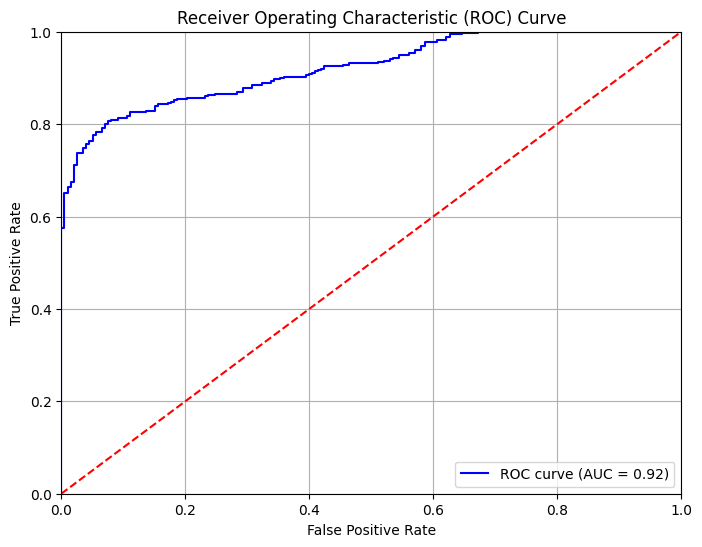

In [ ]:
#Plot my ROC curve
fpr, tpr, thresholds = roc_curve(y_dmem_test, y_pred_prob)

roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


## Introduce Support Vector Classifiers and a Kernal
Next I wanted to see if SVM and the kernal feature could perform better

In [ ]:
mean_auc_svm = []
#Same as above but for SVM
C_values = [0.1]#,0.01, 0.01, 0.001, ]

# Cross-validation to select the best C value based on AUC
for C in C_values:
    svm_classifier = SVC(C=C, kernel='linear', probability=True, random_state=42)
    scores = cross_val_score(svm_classifier, X_dmem_train, y_dmem_train, cv=StratifiedKFold(n_splits=10), scoring='roc_auc')
    mean_auc_svm.append(scores.mean())


In [ ]:
best_C_svm = C_values[np.argmax(mean_auc_svm)]
print(f'Best C based on AUC for SVM: {best_C_svm}')

final_svm_classifier = SVC(C=best_C_svm, kernel='linear', probability=True, random_state=42)
final_svm_classifier.fit(X_dmem_train, y_dmem_train)

support_vectors = final_svm_classifier.support_vectors_
print(f'Support Vectors: {support_vectors}')


Best C based on AUC for SVM: 0.1
Support Vectors: [[ 2.50929251  2.46999624  2.46364166 ...  1.78997208  1.81371171
   1.98179438]
 [ 2.50522646  2.46342495  2.45669511 ...  1.86526767  1.90249699
   2.06407029]
 [ 2.26390613  2.23186688  2.23819716 ...  1.50005334  1.53486887
   1.72282008]
 ...
 [-0.84697403 -0.83923758 -0.83044147 ... -1.2641754  -1.2699739
  -1.32024255]
 [-0.85731342 -0.85148274 -0.85460967 ... -0.96961468 -0.91956577
  -0.87347096]
 [-0.83770923 -0.8335058  -0.83877733 ... -0.81663425 -0.78314861
  -0.7079042 ]]


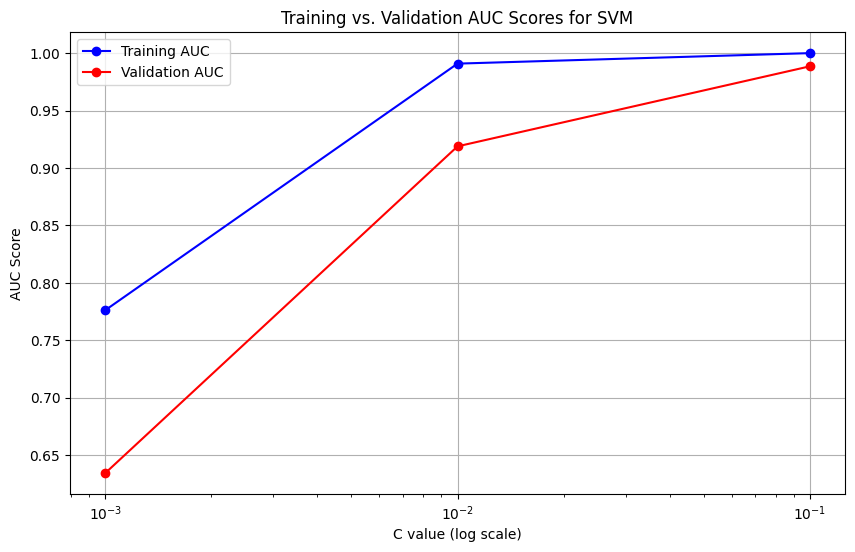

In [ ]:
# same CV process
mean_auc_train = []
mean_auc_val = []

C_values = [0.001,0.01,0.1]

X_dmem_train_np = X_dmem_train.to_numpy()
y_dmem_train_np = y_dmem_train.to_numpy()

# StratifiedKFold for consistent splitting
cv = StratifiedKFold(n_splits=10)

for C in C_values:
    train_scores = []
    val_scores = []

    for train_idx, val_idx in cv.split(X_dmem_train_np, y_dmem_train_np):
        svm_classifier = SVC(C=C, kernel='linear', probability=True,random_state=42)
        svm_classifier.fit(X_dmem_train_np[train_idx], y_dmem_train_np[train_idx])
        train_auc = roc_auc_score(y_dmem_train_np[train_idx], svm_classifier.predict_proba(X_dmem_train_np[train_idx])[:, 1])
        val_auc = roc_auc_score(y_dmem_train_np[val_idx], svm_classifier.predict_proba(X_dmem_train_np[val_idx])[:, 1])

        train_scores.append(train_auc)
        val_scores.append(val_auc)

    mean_auc_train.append(np.mean(train_scores))
    mean_auc_val.append(np.mean(val_scores))

plt.figure(figsize=(10, 6))
plt.plot(C_values, mean_auc_train, label="Training AUC", marker='o', color='blue')
plt.plot(C_values, mean_auc_val, label="Validation AUC", marker='o', color='red')
plt.xscale('log')
plt.xlabel('C value (log scale)')
plt.ylabel('AUC Score')
plt.title('Training vs. Validation AUC Scores for SVM')
plt.legend()
plt.grid()
plt.show()


Accuracy on Test Set for SVM: 0.89
AUC-ROC on Test Set for SVM: 0.95
Confusion Matrix for SVM:
[[164  34]
 [ 29 321]]

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       198
           1       0.90      0.92      0.91       350

    accuracy                           0.89       548
   macro avg       0.88      0.87      0.87       548
weighted avg       0.88      0.89      0.88       548



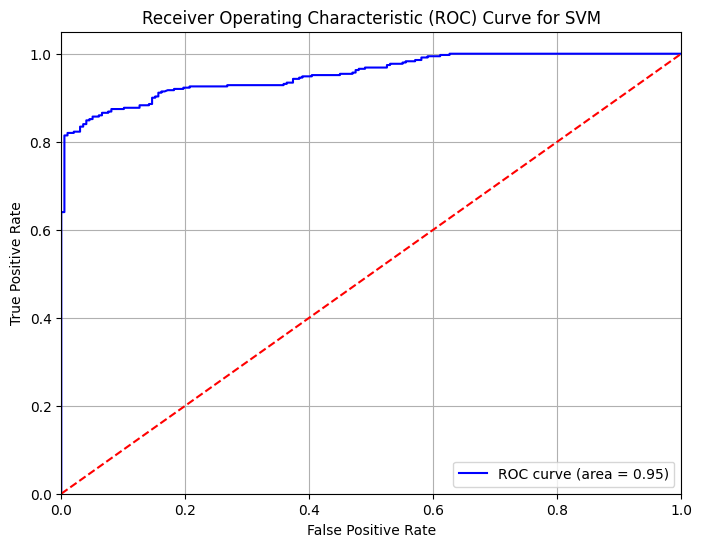

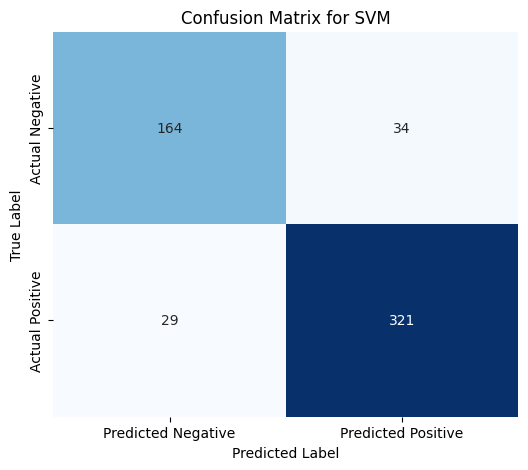

In [ ]:
# Test set evaluation
y_pred_prob_svm = final_svm_classifier.predict_proba(X_dmem_test)[:, 1]
y_pred_svm = final_svm_classifier.predict(X_dmem_test)

accuracy_svm = accuracy_score(y_dmem_test, y_pred_svm)
roc_auc_svm = roc_auc_score(y_dmem_test, y_pred_prob_svm)
conf_matrix_svm = confusion_matrix(y_dmem_test, y_pred_svm)

# I wanted to print the evaluation metrics
print(f'Accuracy on Test Set for SVM: {accuracy_svm:.2f}')
print(f'AUC-ROC on Test Set for SVM: {roc_auc_svm:.2f}')
print(f'Confusion Matrix for SVM:\n{conf_matrix_svm}')

# Print Classification Report
print("\nClassification Report for SVM:")
print(classification_report(y_dmem_test, y_pred_svm))

fpr, tpr, thresholds = roc_curve(y_dmem_test, y_pred_prob_svm)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_svm:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# I wanted to plot a confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_svm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title("Confusion Matrix for SVM")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


## Decision Tree with RFE

After disappointing results through dimensionality reduction and also regularisation I decided to try a more advanced technique using Recursive feature elimiantion which fits all and then moves backwards one by one. I knew this owuld be computationally expensive but I thought it wwould be inetersing to analyse

In [ ]:

def get_models(): # This is the implementation of RFE
    models = {}
    for i in range(5,300 , 20):  #Want to try speed up the process so go in steps of 20
        rfe = RFE(estimator=DecisionTreeClassifier(random_state=42), n_features_to_select=i)
        model = DecisionTreeClassifier(random_state=42)
        # I create a pipeline with RFE and the classifier
        models[f'{i} features'] = Pipeline(steps=[('feature_selection', rfe), ('classification', model)])
    return models

#To avoid overfitting I use nested cross validation to avoid overfitting
def evaluate_model_with_nested_cv(model, X, y, n_splits=10):
    skf = StratifiedKFold(n_splits=n_splits)
    outer_scores = []
    X = np.array(X)
    y = np.array(y) #For indexing

    for train_idx, val_idx in skf.split(X, y):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]
        model.fit(X_train, y_train)

        val_score = model.score(X_val, y_val)
        outer_scores.append(val_score)

    return outer_scores

models = get_models()
results, names = [], []

# Perform my Nested Cross-Validation and evaluate models
for name, model in models.items():
    cv_scores = evaluate_model_with_nested_cv(model, X_dmem_train, y_dmem_train)
    results.append(cv_scores)
    names.append(name)


    print(f'>{name}: Mean CV Score = {np.mean(cv_scores):.3f} (Std = {np.std(cv_scores):.3f})')

plt.figure(figsize=(12, 6))
plt.boxplot(results, labels=names, showmeans=True)
plt.xticks(rotation=45)
plt.xlabel('Number of Features Selected')
plt.ylabel('Cross-Validated Score (Accuracy)')
plt.title('Model Performance with Different Numbers of Features Selected via RFE (Nested CV)')
plt.grid()
plt.show()


In [ ]:
#I then wanted to experiment with another possible feature extraction method using variance thresholding - my thought process behind this is I could get substancial peaks as features
variance_threshold = 0.05

selector = VarianceThreshold(threshold=variance_threshold)
X_reduced = selector.fit_transform(X_dmem_train)

selected_features = X_dmem_train.columns[selector.get_support()]
print("Original", X_dmem_train.shape)
print("Reduced feature matrix shape:", X_reduced.shape)
print("Selected features:", selected_features)
#This reduces the dimensionality but I have worries as the setups follow different distributions taht this threhold may be resulting in bias in my data

In [ ]:
#Number of features from my RFE
param_grid = {
    'rfe__n_features_to_select': [8]
}

dt_classifier = RandomForestClassifier(
    criterion='gini',
    max_depth=None,
    max_features=None,
    min_samples_leaf=2,
    min_samples_split=10,
    random_state=42
)

# Train my final model with the best parameters
final_dt_classifier = dt_classifier
final_rfe = RFE(estimator=final_dt_classifier, n_features_to_select=8, step=1)
final_rfe.fit(X_dmem_train, y_dmem_train)

selected_features = X_dmem_train.columns[final_rfe.support_]
feature_importances = final_rfe.estimator_.feature_importances_

print(f'Selected Features: {selected_features}')
print(f'Feature Importances of Selected Features: {feature_importances}')



In [ ]:
#check on test set
final_dt_classifier.fit(X_dmem_train, y_dmem_train)

y_pred_prob_dt = final_dt_classifier.predict_proba(X_dmem_test)[:, 1]
y_pred_dt = final_dt_classifier.predict(X_dmem_test)
accuracy_dt = accuracy_score(y_dmem_test, y_pred_dt)
roc_auc_dt = roc_auc_score(y_dmem_test, y_pred_prob_dt)
conf_matrix_dt = confusion_matrix(y_dmem_test, y_pred_dt)

print(f'Accuracy on Test Set for Decision Tree: {accuracy_dt:.2f}')
print(f'AUC-ROC on Test Set for Decision Tree: {roc_auc_dt:.2f}')
print(f'Confusion Matrix for Decision Tree:\n{conf_matrix_dt}')

fpr, tpr, thresholds = roc_curve(y_dmem_test, y_pred_prob_dt)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_dt:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


## Logistic AND RandomForest Using PCA

I wanted to examine the effects of PCA and see if taht was any more sucessful

In [ ]:
X_train = X_dmem_train.to_numpy()
y_train = y_dmem_train.to_numpy()

k_values = range(1, 10)
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier()
}

stratified_kfold = StratifiedKFold(n_splits=10)
mean_fpr = np.linspace(0, 1, 100)
results = {}

for model_name, model in models.items():
    best_k = None
    best_score = 0
    mean_tpr_list = []


    for k in k_values:
        fold_scores = []
        mean_tpr = np.zeros_like(mean_fpr)

        for train_idx, test_idx in stratified_kfold.split(X_train, y_train):

            pipeline = Pipeline([
                ('pca', PCA(n_components=k)),  # PCA step
                ('classifier', model)           # Classifier step
            ])

            pipeline.fit(X_train[train_idx], y_train[train_idx])
            y_pred_proba = pipeline.predict_proba(X_train[test_idx])[:, 1]
            fpr, tpr, _ = roc_curve(y_train[test_idx], y_pred_proba)
            roc_auc = auc(fpr, tpr)
            fold_scores.append(roc_auc)
            mean_tpr += np.interp(mean_fpr, fpr, tpr)

        mean_tpr /= stratified_kfold.get_n_splits()
        mean_tpr[-1] = 1.0

        avg_score = np.mean(fold_scores)
        print(f'Average AUC for {model_name} with k={k}: {avg_score:.4f}')

        if avg_score > best_score:
            best_score = avg_score
            best_k = k
            best_mean_tpr = mean_tpr

    results[model_name] = (best_k, best_score, best_mean_tpr)

plt.figure(figsize=(8, 6))
for model_name, (best_k, best_score, mean_tpr) in results.items():
    plt.plot(mean_fpr, mean_tpr, label=f'{model_name} (Best k={best_k}, AUC={best_score:.2f})')

plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

for model_name, (best_k, best_score, _) in results.items():
    print(f'Best k for {model_name}: {best_k} with average AUC: {best_score:.4f}')


In [ ]:
#My fucntion to plot Roc curve and perform PCA

def plot_roc_curve(X_train, y_train, X_test, y_test, k, model):

    pca = PCA(n_components=k)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    model.fit(X_train_pca, y_train)

    y_pred_proba = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

plot_roc_curve(X_dmem_train, y_dmem_train, X_dmem_test, y_dmem_test, k=10, model=LogisticRegression())




## KNN

In [ ]:
#using my PLS componets to reduce dimensionality as it was the bettwe performer over PCA
pls = PLSRegression(n_components=5)
X_dmem_train_pls = pls.fit_transform(X_dmem_train, y_dmem_train)[0]
X_dmem_test_pls = pls.fit_transform(X_dmem_test,y_dmem_test)[0]

#Using a KNN will iintroduce the non linear aspect whcih I want to inspect
knn_cv = KNeighborsClassifier(n_neighbors=5)

cv_scores = cross_val_score(knn_cv, X_dmem_train_pls, y_dmem_train, cv=StratifiedKFold(n_splits=10), scoring='f1')

# Validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV score (F1 score):", np.mean(cv_scores))


Cross-validation scores: [0.27586207 0.98648649 1.         0.98013245 0.96202532 0.85714286
 0.95541401 0.99328859 0.96732026 0.73684211]
Mean CV score (F1 score): 0.8714514149425631


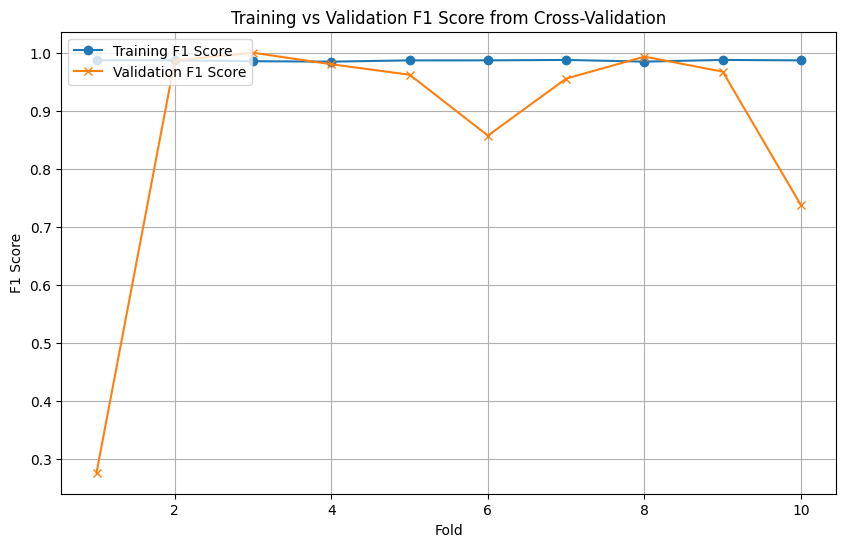

Mean Training F1 Score: 0.9864
Mean Validation F1 Score: 0.8715


In [ ]:
#uisng the same cross validation approach as always but for KNN
knn_cv = KNeighborsClassifier(n_neighbors=5)

train_scores = []
val_scores = []

X_dmem_train_np = np.array(X_dmem_train_pls)
y_dmem_train_np = np.array(y_dmem_train)

cv = StratifiedKFold(n_splits=10)

for train_index, val_index in cv.split(X_dmem_train_np, y_dmem_train_np):
    X_train, X_val = X_dmem_train_np[train_index], X_dmem_train_np[val_index]
    y_train, y_val = y_dmem_train_np[train_index], y_dmem_train_np[val_index]

    knn_cv.fit(X_train, y_train)

    train_pred = knn_cv.predict(X_train)
    val_pred = knn_cv.predict(X_val)

    train_f1 = f1_score(y_train, train_pred)
    val_f1 = f1_score(y_val, val_pred)

    train_scores.append(train_f1)
    val_scores.append(val_f1)

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_scores) + 1), train_scores, label='Training F1 Score', marker='o')
plt.plot(range(1, len(val_scores) + 1), val_scores, label='Validation F1 Score', marker='x')
plt.title('Training vs Validation F1 Score from Cross-Validation')
plt.xlabel('Fold')
plt.ylabel('F1 Score')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

print(f'Mean Training F1 Score: {np.mean(train_scores):.4f}')
print(f'Mean Validation F1 Score: {np.mean(val_scores):.4f}')


Tuning the number of neighbours as a hyperparameter

In [ ]:
knn2 = KNeighborsClassifier()
param_grid = {'n_neighbors': np.arange(1, 25)}
#usING gridsearch to test all values for n_neighbors
knn_gscv = GridSearchCV(knn2, param_grid, cv=StratifiedKFold(n_splits=10),scoring="f1")
#fit model to data
knn_gscv.fit(X_dmem_train, y_dmem_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])},
             scoring='f1')

In [ ]:
print(knn_gscv.best_params_)
print(knn_gscv.best_score_)

{'n_neighbors': 3}
0.8854014761799771


In [ ]:
knn_gscv.fit(X_dmem_train_pls, y_dmem_train)
y_pred = knn_gscv.predict(X_dmem_test_pls)


Accuracy on Test Set for KNN: 0.53
AUC-ROC on Test Set for KNN: 0.52
Confusion Matrix for KNN:
[[ 92 106]
 [150 200]]


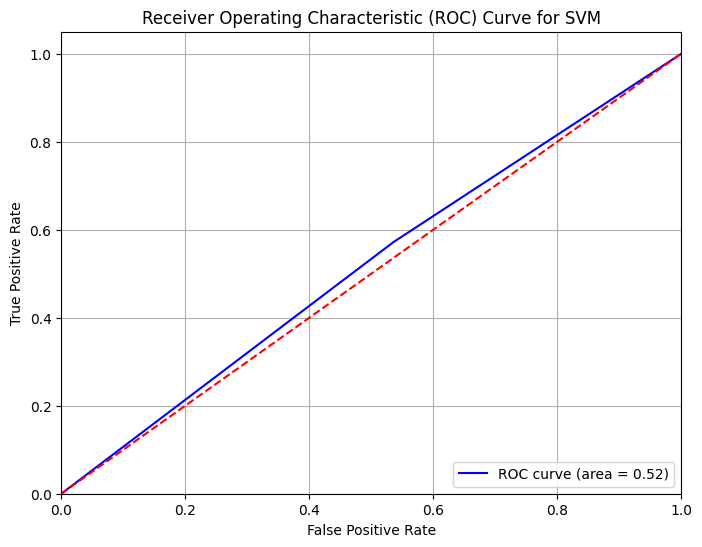

In [ ]:
accuracy_knn= accuracy_score(y_dmem_test, y_pred)
roc_auc_knn= roc_auc_score(y_dmem_test, y_pred)
conf_matrix_knn = confusion_matrix(y_dmem_test, y_pred)

print(f'Accuracy on Test Set for KNN: {accuracy_knn:.2f}')
print(f'AUC-ROC on Test Set for KNN: {roc_auc_knn:.2f}')
print(f'Confusion Matrix for KNN:\n{conf_matrix_knn}')

fpr, tpr, thresholds = roc_curve(y_dmem_test, y_pred)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_knn:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM')
plt.legend(loc='lower right')
plt.grid()
plt.show()

#Disappointng reuslts hwo the test set is not reflective of the trainig data and is overfitting also


## Using Varianace Thresholding, Kernal PCA and SNV

       I001      I002      I003      I004      I005      I006      I007  \
0  0.938704  0.937088  0.936063  0.936827  0.937504  0.937819  0.937244   
1  0.938532  0.936961  0.936117  0.936953  0.937022  0.937166  0.937344   
2  0.938512  0.936949  0.936244  0.937105  0.936654  0.936628  0.937333   
3  0.938644  0.937053  0.936445  0.937285  0.936399  0.936207  0.937210   
4  0.938929  0.937271  0.936719  0.937491  0.936258  0.935902  0.936976   

       I008      I009      I010  ...      I503      I504      I505      I506  \
0  0.936864  0.935907  0.934933  ...  0.438699  0.476553  0.494633  0.505298   
1  0.937443  0.936642  0.935748  ...  0.432064  0.467884  0.486819  0.495576   
2  0.937763  0.937090  0.936258  ...  0.427238  0.460967  0.480603  0.488081   
3  0.937826  0.937252  0.936462  ...  0.424221  0.455803  0.475984  0.482813   
4  0.937630  0.937128  0.936360  ...  0.423013  0.452393  0.472964  0.479771   

       I507      I508      I509      I510      I511      I512  
0  0

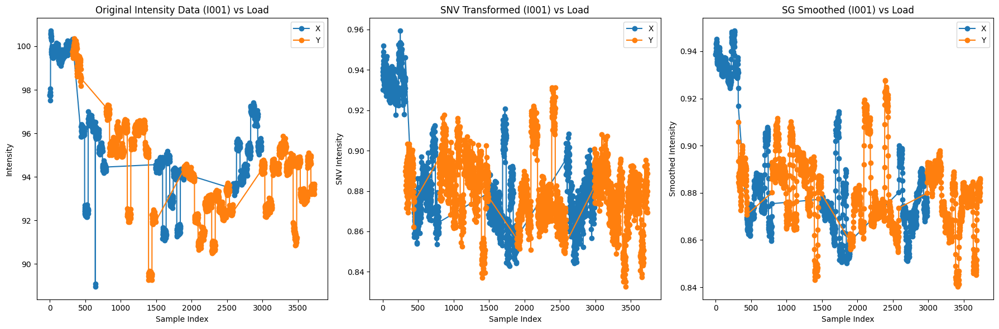

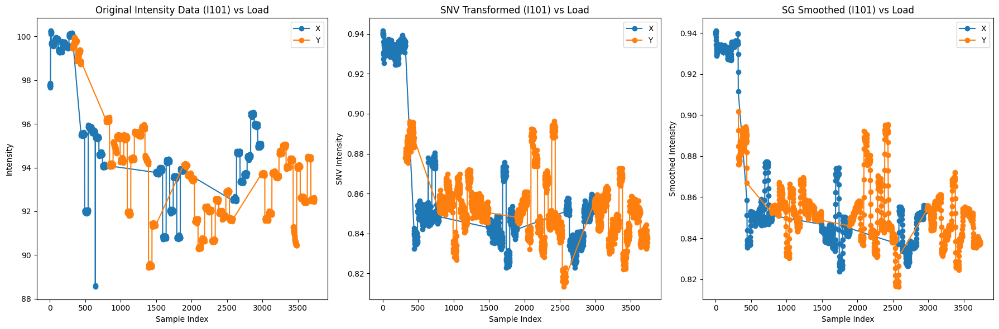

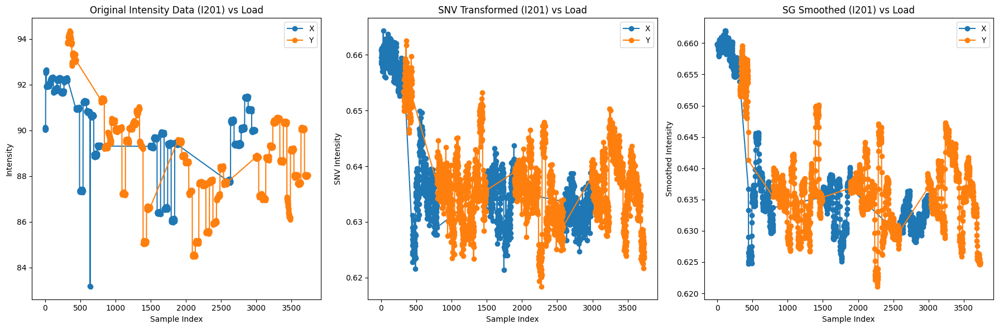

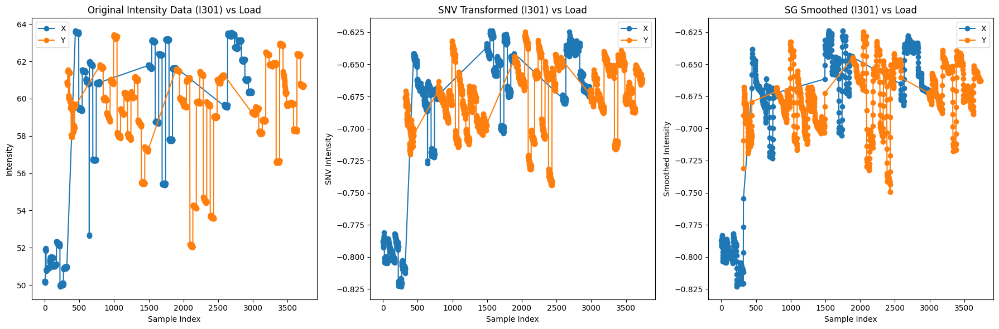

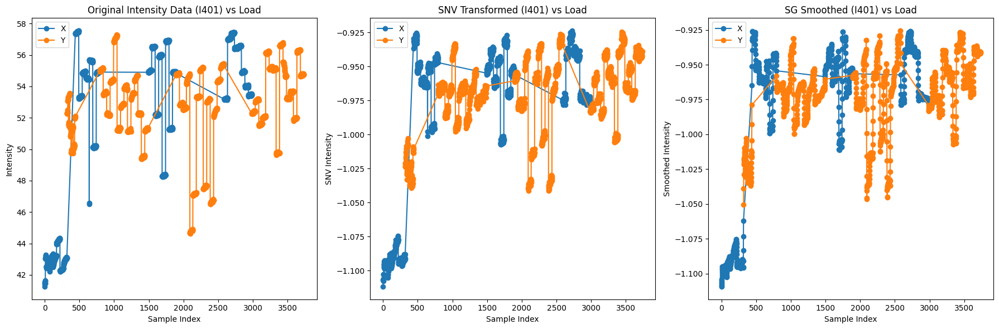

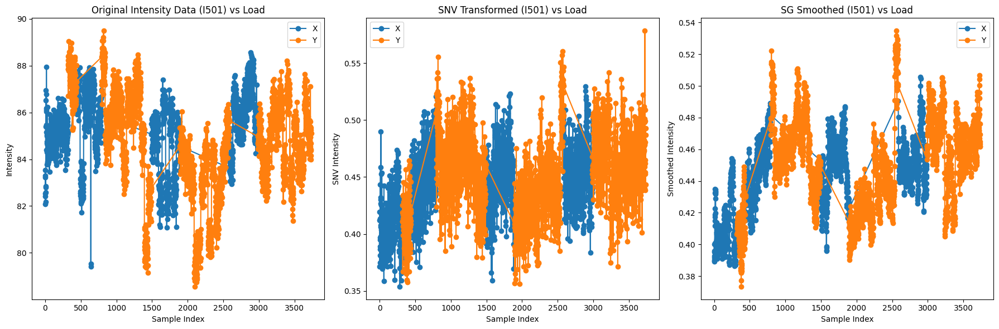

In [ ]:
#Here I wanted to examine some more in depth preporcessing as the previous werent effective
# I came across SNV which removes variabolity due to scatter effects
intensity_columns = df.columns[2:]

def apply_snv(df, intensity_columns):
    snv_data = df[intensity_columns].apply(lambda row: (row - row.mean()) / row.std(), axis=1)
    return snv_data

snv_df = apply_snv(df, intensity_columns)

window_length = 13
poly_order = 2

smoothed_data = {
    col: savgol_filter(snv_df[col], window_length, poly_order)
    for col in snv_df.columns
}

smoothed_df = pd.DataFrame(smoothed_data, columns=intensity_columns)

print(smoothed_df.head())

def plot_intensity_vs_type(df, snv_df, smoothed_df, intensity_column):
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title(f'Original Intensity Data ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(df[df['Type'] == sample_type].index, df[df['Type'] == sample_type][intensity_column],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Intensity')

    plt.subplot(1, 3, 2)
    plt.title(f'SNV Transformed ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(snv_df.index[df['Type'] == sample_type],
                 snv_df[intensity_column][df['Type'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('SNV Intensity')

    plt.subplot(1, 3, 3)
    plt.title(f'SG Smoothed ({intensity_column}) vs Load')
    for sample_type in df['Type'].unique():
        plt.plot(smoothed_df.index[df['Type'] == sample_type],
                 smoothed_df[intensity_column][df['Type'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Smoothed Intensity')

    plt.tight_layout()
    plt.show()

for intensity_col in ['I001', 'I101', 'I201', 'I301', 'I401', 'I501']:
    plot_intensity_vs_type(df, snv_df, smoothed_df, intensity_col)


In [ ]:

variance_threshold = 0.003 # Far smaller varinavce now that baseline is corrected
selector = VarianceThreshold(threshold=variance_threshold)

X_reduced = selector.fit_transform(X_dmem_train)

selected_features = X_dmem_train.columns[selector.get_support()]
print("Original", X_dmem_train.shape)
print("Reduced feature matrix shape:", X_reduced.shape)
print("Selected features:", selected_features)


Original (1276, 512)
Reduced feature matrix shape: (1276, 512)
Selected features: Index(['I001', 'I002', 'I003', 'I004', 'I005', 'I006', 'I007', 'I008', 'I009',
       'I010',
       ...
       'I503', 'I504', 'I505', 'I506', 'I507', 'I508', 'I509', 'I510', 'I511',
       'I512'],
      dtype='object', length=512)


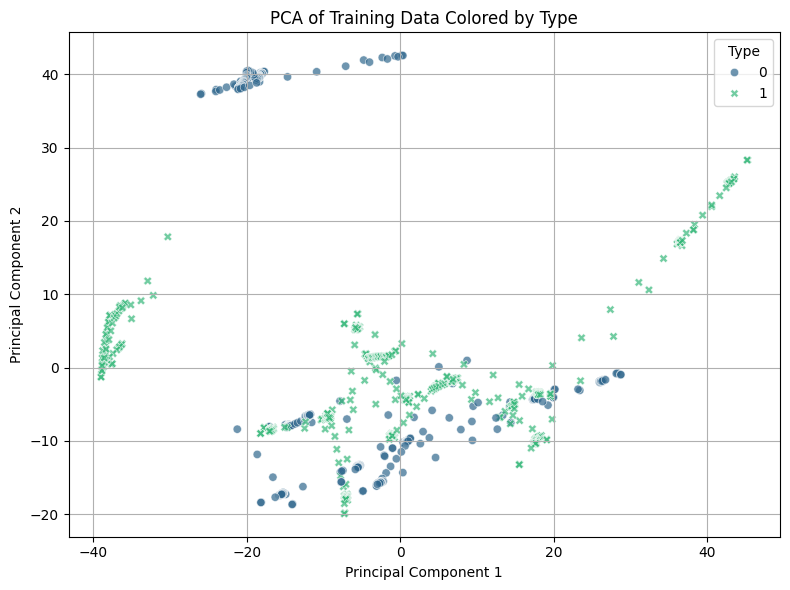

In [ ]:
#I experiment with kernal PCA in an attempt to try capture the non linear relationship between the intenity points
pca = KernelPCA(n_components=5)
X_dmem_train_pca = pca.fit_transform(X_reduced)
X_dmem_test_pca = pca.fit_transform(X_dmem_test)
pca_df = pd.DataFrame(data=X_dmem_train_pca, columns=['PC1', 'PC2','PC3', 'PC4','PC5'])

pca_df['Type'] = y_dmem_train

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Type', style='Type', palette='viridis', alpha=0.7)
plt.title('PCA of Training Data Colored by Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.tight_layout()
plt.legend(title='Type')
plt.show()


Apply my Kernal Pca data and snv data to RF using hyperparameter tuning

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of each tree
    'min_samples_split': [2, 5, 10]  # Minimum number of samples required to split a node
}

rf = RandomForestClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)
scorers = {
    'f1_score': make_scorer(f1_score, average='weighted'),
    'accuracy': make_scorer(accuracy_score)
}

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring=scorers,
    refit='f1_score',
    cv=cv,
    return_train_score=True,
    n_jobs=-1
)


grid_search.fit(X_dmem_train_pca, y_dmem_train)
best_rf = grid_search.best_estimator_
#Cv sxcores
cv_results = grid_search.cv_results_
train_f1 = cv_results['mean_train_f1_score'][grid_search.best_index_]
train_acc = cv_results['mean_train_accuracy'][grid_search.best_index_]
val_f1 = cv_results['mean_test_f1_score'][grid_search.best_index_]
val_acc = cv_results['mean_test_accuracy'][grid_search.best_index_]
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Training F1 Score: {train_f1:.4f}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation F1 Score: {val_f1:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")


Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Training F1 Score: 1.0000
Training Accuracy: 1.0000
Validation F1 Score: 0.6167
Validation Accuracy: 0.6599


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


Accuracy on Test Set for RF: 0.72
AUC-ROC on Test Set for RF: 0.71
Confusion Matrix for RF:
[[141  57]
 [ 99 251]]

Classification Report for RF:
              precision    recall  f1-score   support

           0       0.59      0.71      0.64       198
           1       0.81      0.72      0.76       350

    accuracy                           0.72       548
   macro avg       0.70      0.71      0.70       548
weighted avg       0.73      0.72      0.72       548



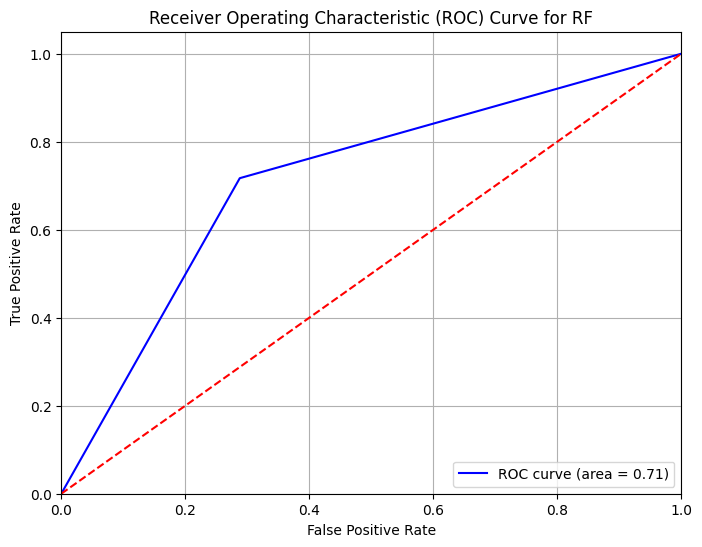

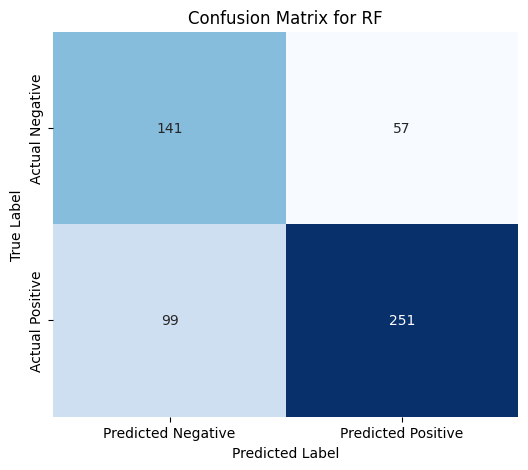

In [ ]:

# Train the best Random Forest model
best_rf.fit(X_reduced, y_dmem_train)

# Predict on the test set
y_pred = best_rf.predict(X_dmem_test[selected_features])

accuracy_rf = accuracy_score(y_dmem_test, y_pred)
roc_auc_rf = roc_auc_score(y_dmem_test, y_pred)
conf_matrix_rf = confusion_matrix(y_dmem_test, y_pred)

print(f'Accuracy on Test Set for RF: {accuracy_rf:.2f}')
print(f'AUC-ROC on Test Set for RF: {roc_auc_rf:.2f}')
print(f'Confusion Matrix for RF:\n{conf_matrix_rf}')

# Classification Report for RF
print("\nClassification Report for RF:")
print(classification_report(y_dmem_test, y_pred))

fpr, tpr, thresholds = roc_curve(y_dmem_test, y_pred)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_rf:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for RF')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Confusion Matrix Heatmap for RF
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title("Confusion Matrix for RF")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


# PBS

## Here I am doing basic models with no feature selection or hyperparameter tuning for PBS

In [ ]:
lr_model = LogisticRegression(max_iter = 10000)
evaluate_model(lr_model, X_pbs_train, y_pbs_train, "Logistic Regression", n_splits=10)

In [ ]:
lr_model.fit(X_pbs_train, y_pbs_train)
y_pred = lr_model.predict(X_pbs_test)

test_balanced_accuracy = balanced_accuracy_score(y_pbs_test, y_pred)
test_f1 = f1_score(y_pbs_test, y_pred, average='weighted')
test_precision = precision_score(y_pbs_test, y_pred, average='weighted')
test_recall = recall_score(y_pbs_test, y_pred, average='weighted')

print(f" Logistic Regression- Test Set Results:")
print(f"Test Balanced Accuracy: {test_balanced_accuracy:.3f}")
print(f"Test F1 Score: {test_f1:.3f}")
print(f"Test Precision: {test_precision:.3f}")
print(f"Test Recall: {test_recall:.3f}")

In [ ]:
svc_model = SVC(probability=True, max_iter=10000)
evaluate_model(svc_model, X_pbs_train, y_pbs_train, "SVC", n_splits=10)

In [ ]:
svc_model.fit(X_pbs_train, y_pbs_train)
y_pred = svc_model.predict(X_pbs_test)

test_balanced_accuracy = balanced_accuracy_score(y_pbs_test, y_pred)
test_f1 = f1_score(y_pbs_test, y_pred, average='weighted')
test_precision = precision_score(y_pbs_test, y_pred, average='weighted')
test_recall = recall_score(y_pbs_test, y_pred, average='weighted')

print(f"SVC- Test Set Results:")
print(f"Test Balanced Accuracy: {test_balanced_accuracy:.3f}")
print(f"Test F1 Score: {test_f1:.3f}")
print(f"Test Precision: {test_precision:.3f}")
print(f"Test Recall: {test_recall:.3f}")

In [ ]:
unique, counts = np.unique(y_pbs_train, return_counts=True)
print("Training data:",dict(zip(unique, counts)))

unique, counts = np.unique(y_pbs_test, return_counts=True)
print("Test data:",dict(zip(unique, counts)))

## Feature engineering



In [ ]:
pca = PCA(n_components=5)
X_pbs_train_pca = pca.fit_transform(X_pbs_train)

pca_df = pd.DataFrame(data=X_pbs_train_pca, columns=['PC1', 'PC2','PC3', 'PC4','PC5'])
pca_df['Type'] = y_pbs_train

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Type', style='Type', palette='viridis', alpha=0.7)

plt.title('PCA of Training Data Colored by Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.tight_layout()
plt.legend(title='Type')
plt.show()
explained_variance = pca.explained_variance_ratio_
print(f'Explained variance by each principal component: {explained_variance}')
print(f'Total explained variance: {sum(explained_variance)}')


In [ ]:
X_pbs_test_pca = pca.transform(X_pbs_test)

In [ ]:
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_pbs_train_pca, y_pbs_train)
y_pred = clf.predict(X_pbs_test_pca)
score = accuracy_score(y_pbs_test, y_pred)
f1 = f1_score(y_pbs_test, y_pred, average='weighted')
print('Logistic Regression - Accuracy:', score)
print('Logistic Regression - F1 score:', f1)

clf_svc = LinearSVC(class_weight='balanced')
clf_svc.fit(X_pbs_train_pca, y_pbs_train)
y_pred = clf_svc.predict(X_pbs_test_pca)
score = accuracy_score(y_pbs_test, y_pred)
f1 = f1_score(y_pbs_test, y_pred, average='weighted')
print('Linear SVC - Accuracy:', score)
print('Linear SVC - F1 score:', f1)

clf_dt = DecisionTreeClassifier(random_state=0, class_weight='balanced')
clf_dt.fit(X_pbs_train_pca, y_pbs_train)
y_pred = clf_dt.predict(X_pbs_test_pca)
score = accuracy_score(y_pbs_test, y_pred)
f1 = f1_score(y_pbs_test, y_pred, average='weighted')
print('Decision Tree - Accuracy:', score)
print('Decision Tree - F1 score:', f1)

clf_sgd = SGDClassifier(random_state=42, max_iter=1000, tol=1e-3, class_weight='balanced')
clf_sgd.fit(X_pbs_train_pca, y_pbs_train)
y_pred = clf_sgd.predict(X_pbs_test_pca)
score = accuracy_score(y_pbs_test, y_pred)
f1 = f1_score(y_pbs_test, y_pred, average='weighted')
print('SGD Classifier - Accuracy:', score)
print('SGD Classifier - F1 score:', f1)


## PLS

In [ ]:
pls_binary =PLSRegression(n_components=10)
X_pls = pls_binary.fit_transform(X_pbs_train, y_pbs_train)[0]

In [ ]:
X_pbs_test.shape

In [ ]:
pls_binary = PLSRegression(n_components=10)
pls_binary.fit(X_pbs_train, y_pbs_train)
y_pred = pls_binary.predict(X_pbs_test)
binary_prediction = (y_pred > 0.5).astype('uint8')
print(binary_prediction)
print(y_dmem_test)

Basic PLSDA

In [ ]:
plsr = PLSRegression(n_components=4, scale=False)
plsr.fit(X_pbs_train, y_pbs_train)
X_scores = plsr.x_scores_
plt.figure(figsize=(10, 6))
unique_classes = np.unique(y_pbs_train)

colors = plt.cm.jet(np.linspace(0, 1, len(unique_classes)))

for idx, class_label in enumerate(unique_classes):
    plt.scatter(X_scores[y_pbs_train == class_label, 0],
                X_scores[y_pbs_train == class_label, 1],
                color=colors[idx],
                label=str(class_label),
                edgecolors='k',
                s=100)

plt.title('PLS-DA: Scores Plot')
plt.xlabel('Latent Variable 1')
plt.ylabel('Latent Variable 2')
plt.legend(title='Class Labels')
plt.grid(True)
plt.show()


In [ ]:
accuracy = []
fpr_list = []
tpr_list = []
roc_auc_list = []

cval = StratifiedKFold(n_splits=10, shuffle=True, random_state=19)

X_train_np = X_pbs_train.to_numpy()
y_train_np = y_pbs_train.to_numpy()

for train_idx, test_idx in cval.split(X_train_np, y_train_np):
    X_train_fold, X_test_fold = X_train_np[train_idx, :], X_train_np[test_idx, :]
    y_train_fold, y_test_fold = y_train_np[train_idx], y_train_np[test_idx]

    y_pred_proba = pls_da(X_train_fold, y_train_fold, X_test_fold)
    accuracy.append(accuracy_score(y_test_fold, y_pred_proba))
    fpr, tpr, _ = roc_curve(y_test_fold, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    fpr_list.append(fpr)
    tpr_list.append(tpr)
    roc_auc_list.append(roc_auc)

print("Average accuracy on 10 splits: ", np.array(accuracy).mean())

plt.figure(figsize=(10, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], label=f'Fold {i + 1} (AUC = {roc_auc_list[i]:.2f})')

mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)

for i in range(len(fpr_list)):
    mean_tpr += np.interp(mean_fpr, fpr_list[i], tpr_list[i])

mean_tpr /= len(fpr_list)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', linestyle='--',
         label=f'Mean ROC (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()




## Logistic with L1

In [ ]:
C_values = [0.1, 0.5, 1, 10]
cv_accuracies = []
cv_aucs = []
cv_f1_scores = []

for C in C_values:
    log_reg = LogisticRegression(C=C, penalty='l1', solver='saga', max_iter=1000, random_state=42)
    cv_accuracy = cross_val_score(log_reg, X_pbs_train, y_pbs_train, cv=StratifiedKFold(n_splits=10), scoring='accuracy')
    cv_accuracies.append(cv_accuracy)

    cv_auc = cross_val_score(log_reg, X_pbs_train, y_pbs_train, cv=StratifiedKFold(n_splits=10), scoring='roc_auc')
    cv_aucs.append(cv_auc)
    cv_f1 = cross_val_score(log_reg, X_pbs_train, y_pbs_train, cv=StratifiedKFold(n_splits=10), scoring='f1')
    cv_f1_scores.append(cv_f1)


mean_accuracy = [np.mean(cv_acc) for cv_acc in cv_accuracies]
mean_auc = [np.mean(cv_auc) for cv_auc in cv_aucs]
mean_f1 = [np.mean(cv_f1) for cv_f1 in cv_f1_scores]

for idx, C in enumerate(C_values):
    print(f'C = {C}')
    print(f'  Mean Accuracy (CV): {mean_accuracy[idx]:.4f}')
    print(f'  Mean AUC (CV): {mean_auc[idx]:.4f}')
    print(f'  Mean F1 Score (CV): {mean_f1[idx]:.4f}')
    print()

best_C = C_values[np.argmax(mean_f1)]
print(f'Best C based on F1 score: {best_C}')

final_log_reg = LogisticRegression(C=best_C, penalty='l1', solver='saga', max_iter=5000, random_state=42)
final_log_reg.fit(X_pbs_train, y_pbs_train)
train_accuracy = final_log_reg.score(X_pbs_train, y_pbs_train)
train_auc = roc_auc_score(y_pbs_train, final_log_reg.predict_proba(X_dmem_train)[:, 1])
train_f1 = f1_score(y_pbs_train, final_log_reg.predict(X_dmem_train))

print(f'Final Model Training Accuracy: {train_accuracy:.4f}')
print(f'Final Model Training AUC: {train_auc:.4f}')
print(f'Final Model Training F1 Score: {train_f1:.4f}')

test_accuracy = final_log_reg.score(X_pbs_test, y_pbs_test)
test_auc = roc_auc_score(y_pbs_test, final_log_reg.predict_proba(X_pbs_test)[:, 1])
test_f1 = f1_score(y_pbs_test, final_log_reg.predict(X_pbs_test))

print(f'Final Model Test Accuracy: {test_accuracy:.4f}')
print(f'Final Model Test AUC: {test_auc:.4f}')
print(f'Final Model Test F1 Score: {test_f1:.4f}')



In [ ]:
y_pred_prob = final_log_reg.predict_proba(X_pbs_test)[:, 1]
y_pred = final_log_reg.predict(X_pbs_test)
accuracy = accuracy_score(y_pbs_test, y_pred)
roc_auc = roc_auc_score(y_pbs_test, y_pred_prob)
conf_matrix = confusion_matrix(y_pbs_test, y_pred)

print(f'Accuracy on Test Set: {accuracy:.2f}')
print(f'AUC-ROC on Test Set: {roc_auc:.2f}')
print(f'Confusion Matrix:\n{conf_matrix}')


In [ ]:
y_pred_prob = final_log_reg.predict_proba(X_pbs_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_pbs_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


## Introduce Non Linear Kernal

In [ ]:
mean_auc_svm = []
C_values = [0.01, 0.01, 0.001, 0.1]

for C in C_values:
    svm_classifier = SVC(C=C, kernel='poly', probability=True, random_state=42)
    scores = cross_val_score(svm_classifier, X_pbs_train, y_pbs_train, cv=StratifiedKFold(n_splits=10), scoring='roc_auc')
    mean_auc_svm.append(scores.mean())

best_C_svm = C_values[np.argmax(mean_auc_svm)]
print(f'Best C based on AUC for SVM: {best_C_svm}')

final_svm_classifier = SVC(C=best_C_svm, kernel='poly', probability=True, random_state=42)
final_svm_classifier.fit(X_pbs_train, y_pbs_train)

support_vectors = final_svm_classifier.support_vectors_
print(f'Support Vectors: {support_vectors}')


In [ ]:
y_pred_prob_svm = final_svm_classifier.predict_proba(X_pbs_test)[:, 1]
y_pred_svm = final_svm_classifier.predict(X_pbs_test)

accuracy_svm = accuracy_score(y_pbs_test, y_pred_svm)
roc_auc_svm = roc_auc_score(y_pbs_test, y_pred_prob_svm)
conf_matrix_svm = confusion_matrix(y_pbs_test, y_pred_svm)

print(f'Accuracy on Test Set for SVM: {accuracy_svm:.2f}')
print(f'AUC-ROC on Test Set for SVM: {roc_auc_svm:.2f}')
print(f'Confusion Matrix for SVM:\n{conf_matrix_svm}')

fpr, tpr, thresholds = roc_curve(y_pbs_test, y_pred_prob_svm)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_svm:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM')
plt.legend(loc='lower right')
plt.grid()
plt.show()



## Decision Tree with RFE

In [ ]:
def get_models():
    models = {}
    for i in range(5, 10):
        rfe = RFE(estimator=DecisionTreeClassifier(random_state=42), n_features_to_select=i)
        model = DecisionTreeClassifier(random_state=42)
        models[f'{i} features'] = Pipeline(steps=[('feature_selection', rfe), ('classification', model)])
    return models

def evaluate_model_with_stratified_kfold(model, X, y, n_splits=10):
    skf = StratifiedKFold(n_splits=n_splits)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=skf, n_jobs=-1, error_score='raise')
    return scores

models = get_models()
results, names = [], []

for name, model in models.items():
    scores = evaluate_model_with_stratified_kfold(model, X_pbs_train, y_pbs_train)
    results.append(scores)
    names.append(name)
    print(f'>{name}: Mean Accuracy = {mean(scores):.3f} (Std = {std(scores):.3f})')

plt.figure(figsize=(12, 6))
plt.boxplot(results, labels=names, showmeans=True)
plt.xticks(rotation=45)
plt.xlabel('Number of Features Selected')
plt.ylabel('Cross-Validated Accuracy')
plt.title('Decision Tree Performance with Different Numbers of Features Selected via RFE')
plt.grid()
plt.show()


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline

param_grid = {
    'rfe__n_features_to_select': [12]
}

dt_classifier = RandomForestClassifier(
    criterion='gini',
    max_depth=None,
    max_features=None,
    min_samples_leaf=2,
    min_samples_split=10,
    random_state=42
)

final_dt_classifier = dt_classifier
final_rfe = RFE(estimator=final_dt_classifier, n_features_to_select=8, step=1)
final_rfe.fit(X_pbs_train, y_pbs_train)

selected_features = X_pbs_train.columns[final_rfe.support_]
feature_importances = final_rfe.estimator_.feature_importances_

print(f'Selected Features: {selected_features}')
print(f'Feature Importances of Selected Features: {feature_importances}')



In [ ]:
final_dt_classifier.fit(X_pbs_train, y_pbs_train)
y_pred_prob_dt = final_dt_classifier.predict_proba(X_pbs_test)[:, 1]
y_pred_dt = final_dt_classifier.predict(X_pbs_test)

accuracy_dt = accuracy_score(y_pbs_test, y_pred_dt)
roc_auc_dt = roc_auc_score(y_pbs_test, y_pred_prob_dt)
conf_matrix_dt = confusion_matrix(y_pbs_test, y_pred_dt)

print(f'Accuracy on Test Set for Decision Tree: {accuracy_dt:.2f}')
print(f'AUC-ROC on Test Set for Decision Tree: {roc_auc_dt:.2f}')
print(f'Confusion Matrix for Decision Tree:\n{conf_matrix_dt}')

fpr, tpr, thresholds = roc_curve(y_pbs_test, y_pred_prob_dt)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_dt:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


## Logistic Using PCA

In [ ]:
X_train = X_pbs_train.to_numpy()
y_train = y_pbs_train.to_numpy()

k_values = range(1, 10)
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
}

stratified_kfold = StratifiedKFold(n_splits=10)
mean_fpr = np.linspace(0, 1, 100)
results = {}

for model_name, model in models.items():
    best_k = None
    best_score = 0
    mean_tpr_list = []
    for k in k_values:
        fold_scores = []
        mean_tpr = np.zeros_like(mean_fpr)

        for train_idx, test_idx in stratified_kfold.split(X_train, y_train):

            pipeline = Pipeline([
                ('pca', PCA(n_components=k)),
                ('classifier', model)
            ])

            pipeline.fit(X_train[train_idx], y_train[train_idx])
            y_pred_proba = pipeline.predict_proba(X_train[test_idx])[:, 1]
            fpr, tpr, _ = roc_curve(y_train[test_idx], y_pred_proba)
            roc_auc = auc(fpr, tpr)
            fold_scores.append(roc_auc)
            mean_tpr += np.interp(mean_fpr, fpr, tpr)

        mean_tpr /= stratified_kfold.get_n_splits()
        mean_tpr[-1] = 1.0  #

        avg_score = np.mean(fold_scores)
        print(f'Average AUC for {model_name} with k={k}: {avg_score:.4f}')

        if avg_score > best_score:
            best_score = avg_score
            best_k = k
            best_mean_tpr = mean_tpr

    results[model_name] = (best_k, best_score, best_mean_tpr)

plt.figure(figsize=(8, 6))
for model_name, (best_k, best_score, mean_tpr) in results.items():
    plt.plot(mean_fpr, mean_tpr, label=f'{model_name} (Best k={best_k}, AUC={best_score:.2f})')

plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Display the best scores for each model
for model_name, (best_k, best_score, _) in results.items():
    print(f'Best k for {model_name}: {best_k} with average AUC: {best_score:.4f}')


In [ ]:

def plot_roc_curve(X_train, y_train, X_test, y_test, k, model):

    pca = PCA(n_components=k)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    model.fit(X_train_pca, y_train)
    y_pred_proba = model.predict_proba(X_test_pca)[:, 1]

    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

plot_roc_curve(X_pbs_train, y_pbs_train, X_pbs_test, y_pbs_test, k=10, model=LogisticRegression())
plot_roc_curve(X_pbs_train, y_pbs_train, X_pbs_test, y_pbs_test, k=3, model=model)



## KNN

In [ ]:
knn_cv = KNeighborsClassifier(n_neighbors=5)
cv_scores = cross_val_score(knn_cv, X_pbs_train, y_pbs_train, cv=StratifiedKFold(n_splits=10),scoring='f1')
print(cv_scores)
print('cv_scores mean:{}'.format(np.mean(cv_scores)))

In [ ]:
knn2 = KNeighborsClassifier()
param_grid = {'n_neighbors': np.arange(1, 25)}
knn_gscv = GridSearchCV(knn2, param_grid, cv=StratifiedKFold(n_splits=10),scoring="f1")
knn_gscv.fit(X_pbs_train, y_pbs_train)

In [ ]:
print(knn_gscv.best_params_)
print(knn_gscv.best_score_)

In [ ]:
knn_gscv.fit(X_pbs_train, y_pbs_train)
y_pred = knn_gscv.predict(X_pbs_test)


In [ ]:
accuracy_knn= accuracy_score(y_pbs_test, y_pred)
roc_auc_knn= roc_auc_score(y_pbs_test, y_pred)
conf_matrix_knn = confusion_matrix(y_pbs_test, y_pred)

print(f'Accuracy on Test Set for SVM: {accuracy_knn:.2f}')
print(f'AUC-ROC on Test Set for SVM: {roc_auc_knn:.2f}')
print(f'Confusion Matrix for SVM:\n{conf_matrix_knn}')

fpr, tpr, thresholds = roc_curve(y_pbs_test, y_pred)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc_knn:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM')
plt.legend(loc='lower right')
plt.grid()
plt.show()


## Using Varianace Thresholding

In [ ]:
variance_threshold = 0.06

selector = VarianceThreshold(threshold=variance_threshold)
X_reduced = selector.fit_transform(X_pbs_train)
selected_features = X_pbs_train.columns[selector.get_support()]

print("Original", X_pbs_train.shape)
print("Reduced feature matrix shape:", X_reduced.shape)
print("Selected features:", selected_features)



In [ ]:
pca = PCA(n_components=5)
X_pbs_train_pca = pca.fit_transform(X_reduced)
X_pbs_test_pca = pca.fit_transform(X_pbs_test)
pca_df = pd.DataFrame(data=X_pbs_train_pca, columns=['PC1', 'PC2','PC3', 'PC4','PC5'])

pca_df['Type'] = y_pbs_train

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Type', style='Type', palette='viridis', alpha=0.7)

plt.title('PCA of Training Data Colored by Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.tight_layout()
plt.legend(title='Type')
plt.show()

explained_variance = pca.explained_variance_ratio_
print(f'Explained variance by each principal component: {explained_variance}')
print(f'Total explained variance: {sum(explained_variance)}')


In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]  }

rf = RandomForestClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)

scorers = {
    'f1_score': make_scorer(f1_score, average='weighted'),
    'accuracy': make_scorer(accuracy_score)
}

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring=scorers,
    refit='f1_score',
    cv=cv,
    return_train_score=True,
    n_jobs=-1
)

grid_search.fit(X_reduced, y_pbs_train)

best_rf = grid_search.best_estimator_
cv_results = grid_search.cv_results_

train_f1 = cv_results['mean_train_f1_score'][grid_search.best_index_]
train_acc = cv_results['mean_train_accuracy'][grid_search.best_index_]
val_f1 = cv_results['mean_test_f1_score'][grid_search.best_index_]
val_acc = cv_results['mean_test_accuracy'][grid_search.best_index_]

print(f"Best Parameters: {grid_search.best_params_}")
print(f"Training F1 Score: {train_f1:.4f}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation F1 Score: {val_f1:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")


# Regression

#Data Loading and imports

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
file_path = '/content/drive/MyDrive/Queens/Module2/2022QUB.xlsx'
df = pd.read_excel(file_path, sheet_name='Data')

In [ ]:
pip install pygam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 55.5 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1


In [ ]:
from scipy import stats
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA, KernelPCA
from sklearn.model_selection import cross_val_predict,KFold, cross_validate, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression, LassoCV ,Lasso
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import PolynomialFeatures
from pygam import GAM, s, LinearGAM
import sys
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline


In [ ]:
df

,SID,Type,Matrix,Load,I001,I002,I003,I004,I005,I006,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,S1,X,dmem,1,97.78,97.73,97.68,97.70,97.73,97.73,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,S1,X,dmem,1,97.75,97.70,97.70,97.71,97.71,97.72,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,S1,X,dmem,1,97.76,97.72,97.70,97.74,97.71,97.71,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,S1,X,dmem,1,97.72,97.71,97.71,97.73,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,S1,X,dmem,1,97.74,97.66,97.65,97.68,97.67,97.65,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,S4,Y,pbs,8,93.44,93.46,93.47,93.40,93.37,93.39,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3797,S4,Y,pbs,8,93.68,93.58,93.55,93.47,93.40,93.41,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3798,S4,Y,pbs,8,93.66,93.65,93.64,93.57,93.51,93.48,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3799,S4,Y,pbs,8,93.20,93.19,93.27,93.25,93.23,93.20,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


In [ ]:
df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
print("\nCleaned DataFrame:")


Cleaned DataFrame:


<ipython-input-82-3c178e28f222>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


# Exploration

In [ ]:
df.describe()

,Load,I001,I002,I003,I004,I005,I006,I007,I008,I009,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
count,3801.000000,3801.00000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,...,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000,3801.000000
mean,4.015259,94.65562,94.645662,94.640797,94.629976,94.617727,94.609816,94.577929,94.550316,94.531181,...,85.624488,86.004936,86.365491,86.747143,87.125264,87.331589,87.534875,87.741886,87.914770,88.071718
std,2.067487,2.57733,2.584697,2.584932,2.591785,2.593300,2.588944,2.585280,2.575187,2.572254,...,2.130029,2.181635,2.215189,2.232610,2.246044,2.286217,2.299715,2.304504,2.331248,2.379595
min,1.000000,80.95000,80.890000,80.830000,80.800000,80.760000,80.840000,80.910000,80.890000,80.830000,...,71.640000,71.950000,72.190000,72.550000,73.030000,73.210000,73.290000,73.240000,73.110000,72.940000
25%,2.000000,92.87000,92.870000,92.860000,92.820000,92.800000,92.760000,92.740000,92.750000,92.740000,...,84.500000,84.830000,85.180000,85.590000,85.940000,86.120000,86.290000,86.450000,86.570000,86.700000
50%,4.000000,94.53000,94.510000,94.520000,94.510000,94.480000,94.490000,94.440000,94.430000,94.410000,...,86.000000,86.430000,86.760000,87.110000,87.490000,87.670000,87.840000,88.020000,88.180000,88.300000
75%,6.000000,96.07000,96.040000,96.030000,96.030000,96.020000,96.030000,96.010000,95.970000,95.940000,...,87.070000,87.530000,87.900000,88.260000,88.640000,88.900000,89.170000,89.380000,89.570000,89.730000
max,8.000000,100.71000,100.620000,100.550000,100.540000,100.540000,100.440000,100.310000,100.230000,100.220000,...,90.100000,90.810000,91.300000,91.650000,91.900000,92.090000,92.410000,92.600000,92.960000,93.580000


In [ ]:
df.count().sort_values()

,0
I501,3801
I502,3801
I503,3801
I504,3801
I505,3801
...,...
I036,3801
I510,3801
I511,3801
I512,3801


In [ ]:
z = np.abs(stats.zscore(df._get_numeric_data()))
print(z)

          Load      I001      I002      I003      I004      I005      I006  \
0     1.458609  1.212414  1.193464  1.175893  1.184677  1.200278  1.205354   
1     1.458609  1.200773  1.181856  1.183631  1.188536  1.192565  1.201491   
2     1.458609  1.204653  1.189595  1.183631  1.200112  1.192565  1.197628   
3     1.458609  1.189131  1.185726  1.187500  1.196253  1.188709  1.197628   
4     1.458609  1.196892  1.166378  1.164285  1.176959  1.177139  1.174450   
...        ...       ...       ...       ...       ...       ...       ...   
3796  1.927589  0.471721  0.458784  0.452991  0.474630  0.481198  0.471225   
3797  1.927589  0.378589  0.412351  0.422038  0.447618  0.469628  0.463499   
3798  1.927589  0.386350  0.385265  0.387217  0.409029  0.427206  0.436458   
3799  1.927589  0.564852  0.563259  0.530373  0.532512  0.535190  0.544624   
3800  1.927589  0.471721  0.505217  0.518765  0.520936  0.523621  0.521446   

          I007      I008      I009  ...      I503      I504    

In [ ]:
df= df[(z < 3).all(axis=1)]
print(df.shape)
df.reset_index(drop=True, inplace=True)

(3735, 516)


In [ ]:
df

,SID,Type,Matrix,Load,I001,I002,I003,I004,I005,I006,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,S1,X,dmem,1,97.78,97.73,97.68,97.70,97.73,97.73,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,S1,X,dmem,1,97.75,97.70,97.70,97.71,97.71,97.72,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,S1,X,dmem,1,97.76,97.72,97.70,97.74,97.71,97.71,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,S1,X,dmem,1,97.72,97.71,97.71,97.73,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,S1,X,dmem,1,97.74,97.66,97.65,97.68,97.67,97.65,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3730,S4,Y,pbs,8,93.44,93.46,93.47,93.40,93.37,93.39,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3731,S4,Y,pbs,8,93.68,93.58,93.55,93.47,93.40,93.41,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3732,S4,Y,pbs,8,93.66,93.65,93.64,93.57,93.51,93.48,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3733,S4,Y,pbs,8,93.20,93.19,93.27,93.25,93.23,93.20,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


#EDA against Load


In [ ]:
df


,SID,Type,Matrix,Load,I001,I002,I003,I004,I005,I006,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,S1,X,dmem,1,97.78,97.73,97.68,97.70,97.73,97.73,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,S1,X,dmem,1,97.75,97.70,97.70,97.71,97.71,97.72,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,S1,X,dmem,1,97.76,97.72,97.70,97.74,97.71,97.71,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,S1,X,dmem,1,97.72,97.71,97.71,97.73,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,S1,X,dmem,1,97.74,97.66,97.65,97.68,97.67,97.65,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3730,S4,Y,pbs,8,93.44,93.46,93.47,93.40,93.37,93.39,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3731,S4,Y,pbs,8,93.68,93.58,93.55,93.47,93.40,93.41,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3732,S4,Y,pbs,8,93.66,93.65,93.64,93.57,93.51,93.48,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3733,S4,Y,pbs,8,93.20,93.19,93.27,93.25,93.23,93.20,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


Count of Load values by SID:
Load    1    2    3    4    5    6    7    8
SID                                         
S1     60   71  120  120   10   20   20   20
S2     52  200  200  200  100  100   99  100
S3    100  200  200  200  100   93  100  100
S4    100  200  200  250  100  100  100  100


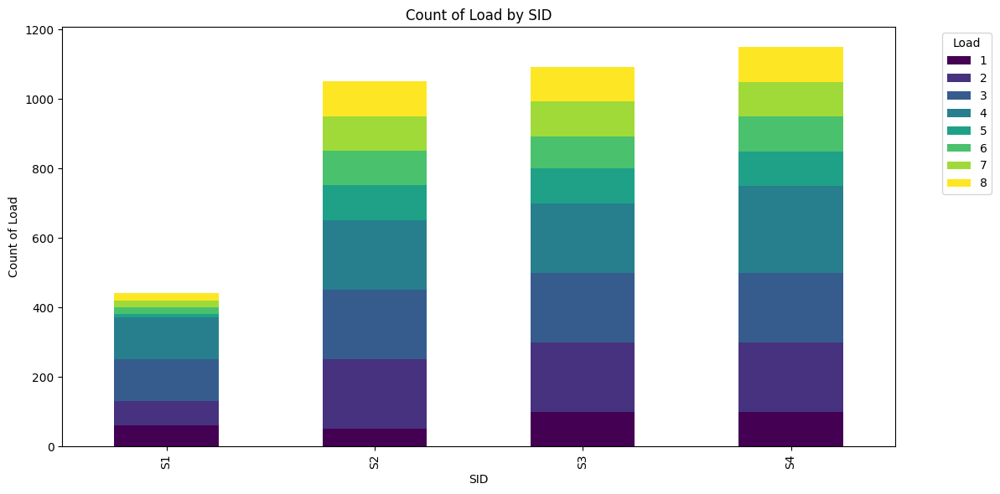

In [ ]:
sid_load_counts = df.groupby(['SID', 'Load']).size().unstack(fill_value=0) # Group by SID so that I can visulsie Load counts

print("Count of Load values by SID:")
print(sid_load_counts)

sid_load_counts.plot(kind='bar', stacked=True, figsize=(12, 6), colormap="viridis")
plt.title('Count of Load by SID')
plt.xlabel('SID')
plt.ylabel('Count of Load')
plt.legend(title='Load', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



<Figure size 1200x600 with 0 Axes>

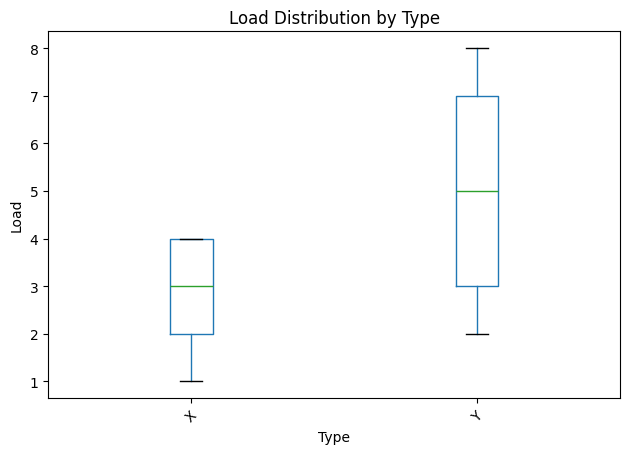

In [ ]:
#Boxplot to examine Type distribution by load
plt.figure(figsize=(12, 6))
df.boxplot(column='Load', by='Type', grid=False)
plt.title('Load Distribution by Type')
plt.suptitle('')
plt.xlabel('Type')
plt.ylabel('Load')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

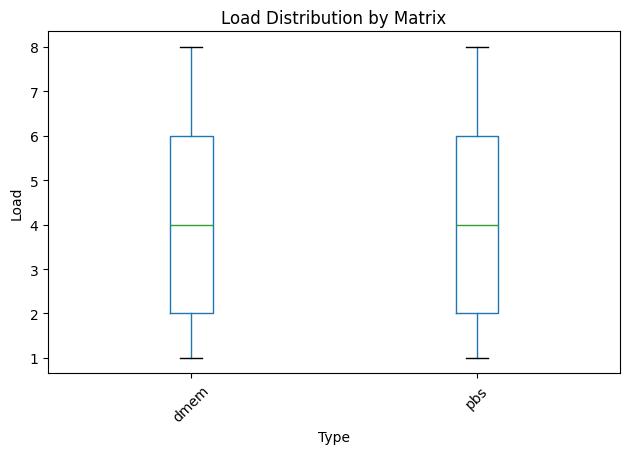

In [ ]:
# Boxplot of load by Matrix
plt.figure(figsize=(12, 6))
df.boxplot(column='Load', by='Matrix', grid=False)
plt.title('Load Distribution by Matrix')
plt.suptitle('')
plt.xlabel('Type')
plt.ylabel('Load')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


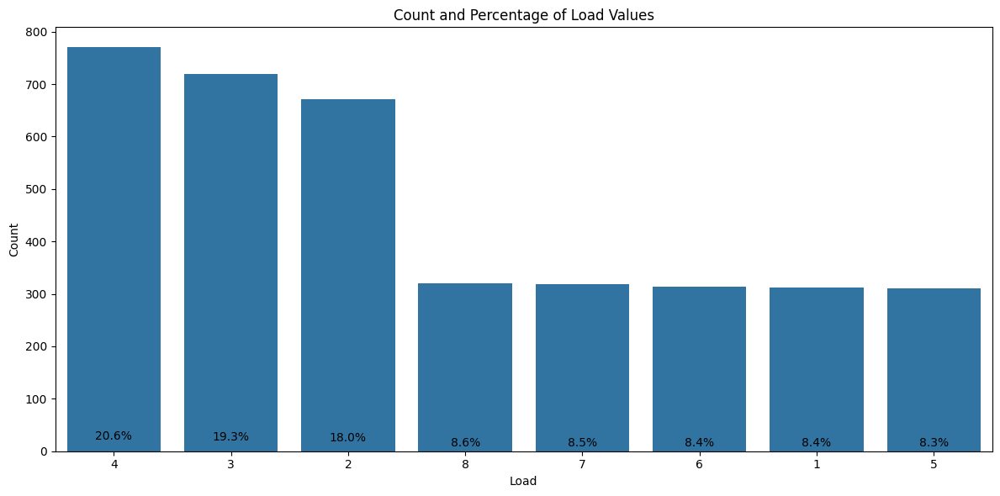

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Load', order=df['Load'].value_counts().index)
load_counts = df['Load'].value_counts(normalize=True) * 100

for i, count in enumerate(load_counts):
    plt.text(i, count + 1, f'{count:.1f}%', ha='center') #Adding the text elemnt to make my graoh clearer

plt.title('Count and Percentage of Load Values')
plt.xlabel('Load')
plt.ylabel('Count')

plt.tight_layout()
plt.show()



<ipython-input-93-e6caf05e1483>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='SID', y='Load', palette='Set2')


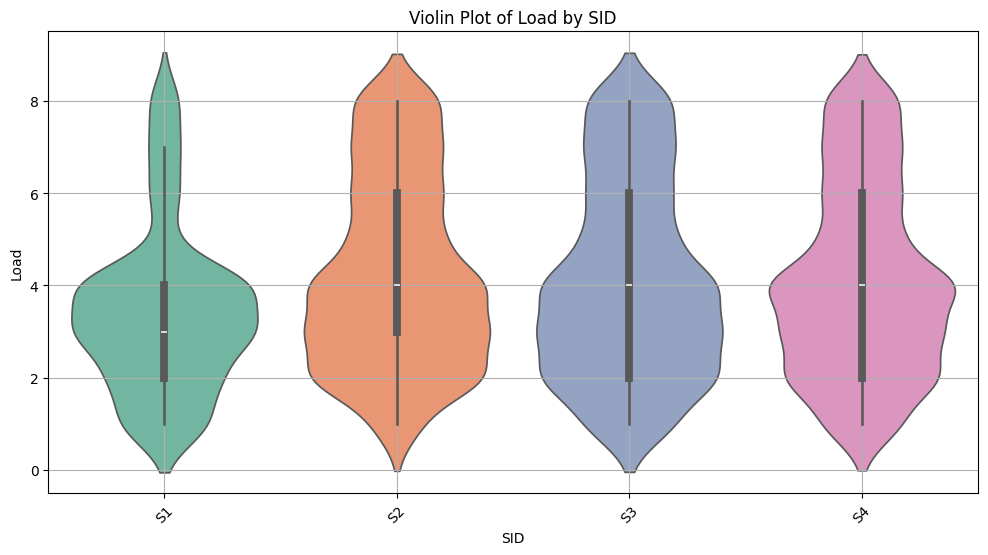

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='SID', y='Load', palette='Set2')
plt.title('Violin Plot of Load by SID')
plt.xlabel('SID')
plt.ylabel('Load')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


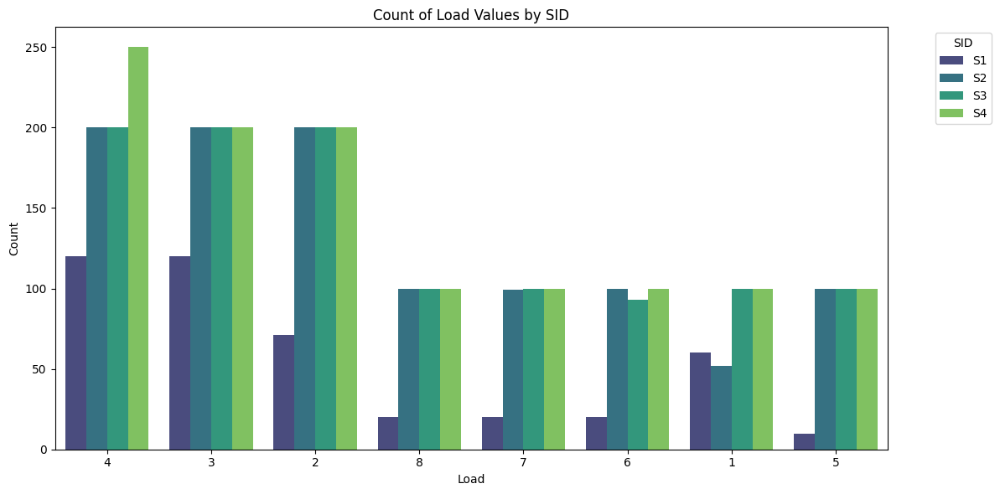

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Load', hue='SID', order=df['Load'].value_counts().index, palette='viridis')
plt.title('Count of Load Values by SID')
plt.xlabel('Load')
plt.ylabel('Count')
plt.legend(title='SID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


<ipython-input-95-f47c8a841cfe>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Type', y='Load', palette='Set2')


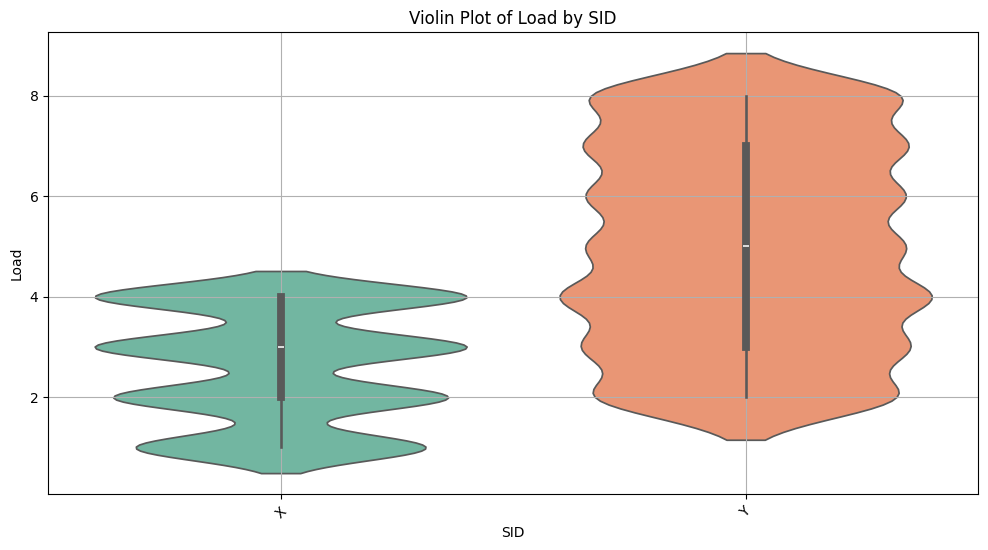

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='Type', y='Load', palette='Set2')
plt.title('Violin Plot of Load by SID')
plt.xlabel('SID')
plt.ylabel('Load')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


# Preprocessing

## Exploring shape

In [ ]:
df = df.drop(['SID',"Type"], axis=1)
print("\nDataFrame after dropping 'SID':")
print(df)


DataFrame after dropping 'SID':
     Matrix  Load   I001   I002   I003   I004   I005   I006   I007   I008  \
0      dmem     1  97.78  97.73  97.68  97.70  97.73  97.73  97.72  97.71   
1      dmem     1  97.75  97.70  97.70  97.71  97.71  97.72  97.74  97.77   
2      dmem     1  97.76  97.72  97.70  97.74  97.71  97.71  97.74  97.72   
3      dmem     1  97.72  97.71  97.71  97.73  97.70  97.71  97.70  97.71   
4      dmem     1  97.74  97.66  97.65  97.68  97.67  97.65  97.69  97.72   
...     ...   ...    ...    ...    ...    ...    ...    ...    ...    ...   
3730    pbs     8  93.44  93.46  93.47  93.40  93.37  93.39  93.41  93.47   
3731    pbs     8  93.68  93.58  93.55  93.47  93.40  93.41  93.37  93.29   
3732    pbs     8  93.66  93.65  93.64  93.57  93.51  93.48  93.45  93.43   
3733    pbs     8  93.20  93.19  93.27  93.25  93.23  93.20  93.20  93.23   
3734    pbs     8  93.44  93.34  93.30  93.28  93.26  93.26  93.22  93.21   

      ...   I503   I504   I505   I506   I5

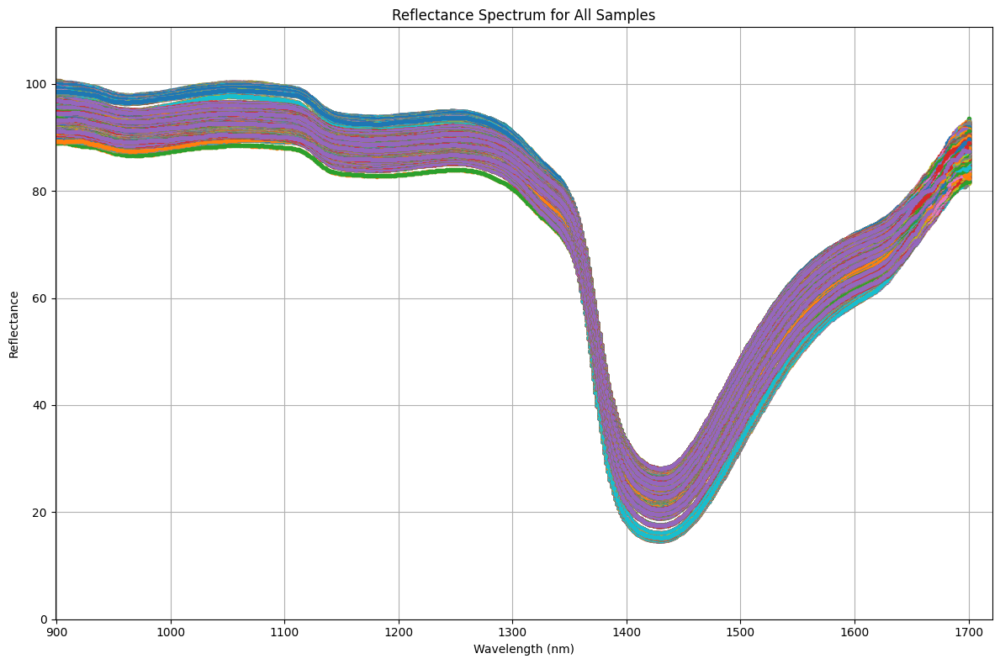

In [ ]:
sample_indices = range(len(df))  # Use indexes for x axis values
num_I_columns = df.shape[1] - 4
wavelengths = np.linspace(900, 1700, num=num_I_columns) # I found out these numbers from the original paper which allowed me to plot the shape of the data

plt.figure(figsize=(12, 8))
for sample_index in sample_indices:
    reflectance_values = df.iloc[sample_index, 4:].values  # All intensity columns
    plt.plot(wavelengths, reflectance_values, marker='o', linestyle='-', markersize=3, label=f'Sample {sample_index}')

plt.title('Reflectance Spectrum for All Samples')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.grid()
plt.xlim([899, 1721])  # Limit my x-axis to the wavelength range
plt.ylim([0, np.max(df.iloc[:, 4:].values) * 1.1])
plt.tight_layout()
plt.show()

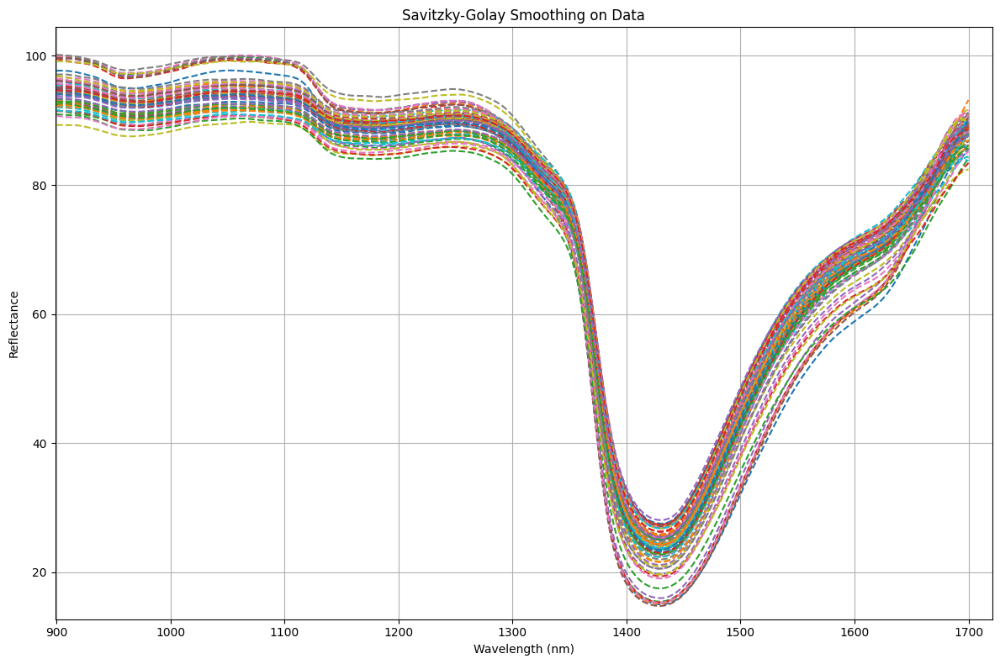

In [ ]:
#Here I am doing the same but visualusing the data after smoothong
num_I_columns = df.shape[1] - 4
wavelengths = np.linspace(900, 1700, num=num_I_columns)

sample_indices = range(0, len(df), 50)

plt.figure(figsize=(12, 8))

for sample_index in sample_indices:
    reflectance_values = df.iloc[sample_index, 4:].values
    sg = savgol_filter(reflectance_values, window_length=13, polyorder=2) #Applying my smmothing
    plt.plot(wavelengths, sg, linestyle='--', label=f'Derivative Sample {sample_index}')

plt.title('Savitzky-Golay Smoothing on Data')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.grid()
plt.xlim([899, 1721])
plt.ylim(np.min(sg) * 0.5)
plt.tight_layout()
plt.show()


       I001      I002      I003      I004      I005      I006      I007  \
0  0.776890  0.778472  0.780153  0.782643  0.783682  0.791132  0.798997   
1  0.750863  0.752308  0.754210  0.756859  0.756386  0.763167  0.772617   
2  0.733249  0.734549  0.736642  0.739342  0.737585  0.743781  0.754340   
3  0.724049  0.725196  0.727447  0.730094  0.727279  0.732974  0.744164   
4  0.723262  0.724247  0.726626  0.729113  0.725467  0.730747  0.742091   

       I008      I009      I010  ...      I503      I504      I505      I506  \
0  0.804266  0.804020  0.800389  ...  0.453611  0.505623  0.515211  0.503860   
1  0.778975  0.779275  0.776022  ...  0.412047  0.460688  0.473013  0.456202   
2  0.761453  0.762180  0.759201  ...  0.382929  0.427568  0.442086  0.421572   
3  0.751700  0.752736  0.749928  ...  0.366259  0.406263  0.422428  0.399972   
4  0.749716  0.750941  0.748202  ...  0.362037  0.396774  0.414040  0.391401   

       I507      I508      I509      I510      I511      I512  
0  0

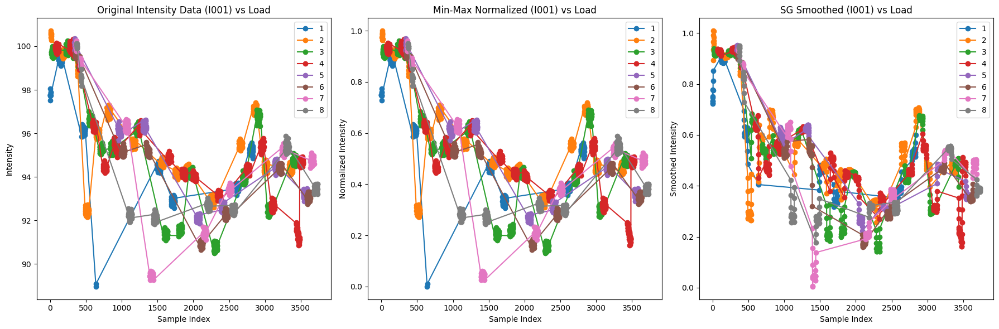

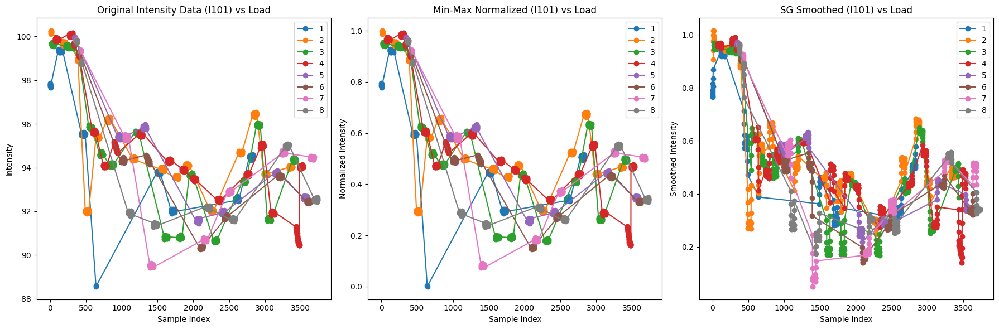

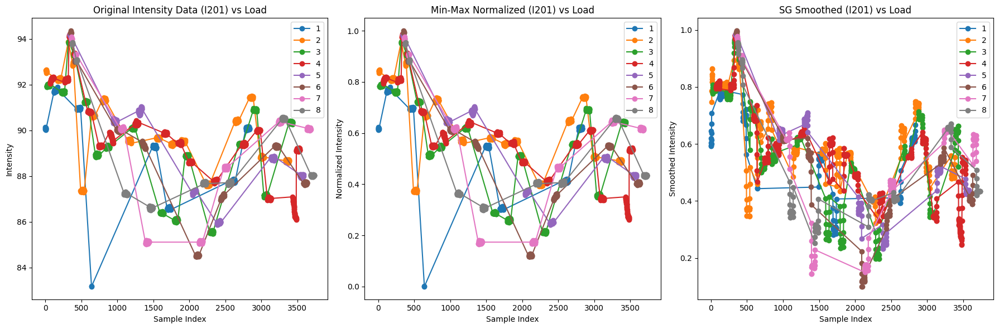

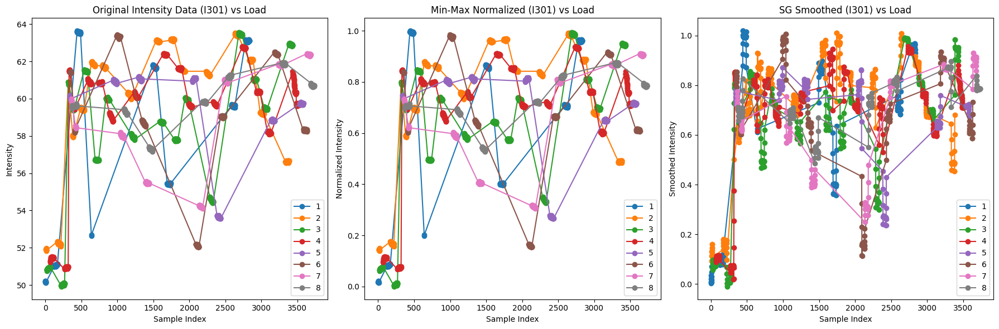

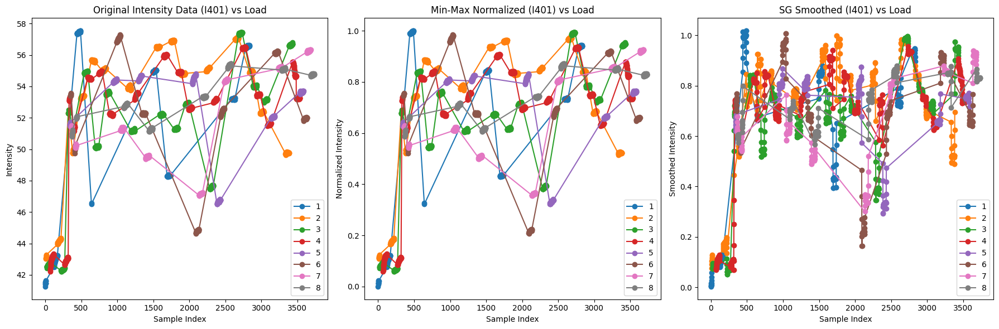

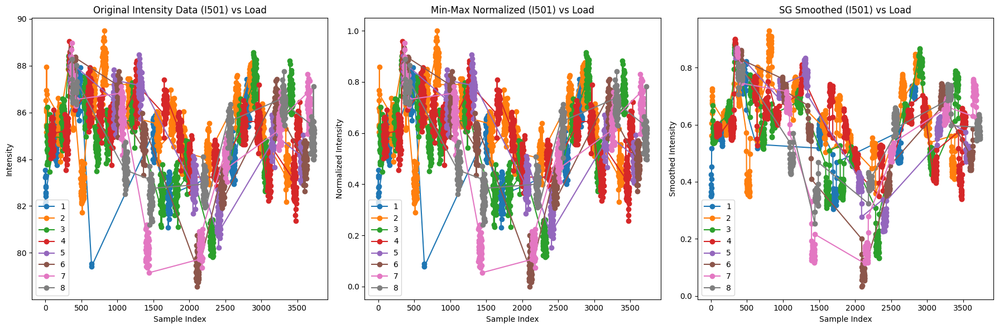

In [ ]:

intensity_columns = df.columns[2:]

scaler = MinMaxScaler() #Use min max sclaer instead
normalised_data = scaler.fit_transform(df[intensity_columns])
normalised_df = pd.DataFrame(normalised_data, columns=intensity_columns)

window_length = 13
poly_order = 2

# Apply Savitzky-Golay filter tmy columns
smoothed_data = {
    col: savgol_filter(normalised_df[col], window_length, poly_order)
    for col in normalised_df.columns
}

smoothed_df = pd.DataFrame(smoothed_data, columns=intensity_columns)
print(smoothed_df.head())

def plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_column):
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title(f'Original Intensity Data ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(df[df['Load'] == sample_type].index, df[df['Load'] == sample_type][intensity_column],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Intensity')

    plt.subplot(1, 3, 2)
    plt.title(f'Min-Max Normalised ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(normalised_df.index[df['Load'] == sample_type],
                 normalised_df[intensity_column][df['Load'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Normalised Intensity')

    plt.subplot(1, 3, 3)
    plt.title(f'SG Smoothed ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(smoothed_df.index[df['Load'] == sample_type],
                 smoothed_df[intensity_column][df['Load'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Smoothed Intensity')

    plt.tight_layout()
    plt.show()

for intensity_col in ['I001', 'I101', 'I201', 'I301', 'I401', 'I501']:
    plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_col)


## With Split

In [ ]:
other_columns = df.drop(df.columns[df.columns.str.startswith('I')], axis=1)
other_columns

,Matrix,Load
0,dmem,1
1,dmem,1
2,dmem,1
3,dmem,1
4,dmem,1
...,...,...
3730,pbs,8
3731,pbs,8
3732,pbs,8
3733,pbs,8


In [ ]:
final_df = pd.concat([other_columns,smoothed_df], axis=1)
print(final_df.head())

  Matrix  Load      I001      I002      I003      I004      I005      I006  \
0   dmem     1  0.776890  0.778472  0.780153  0.782643  0.783682  0.791132   
1   dmem     1  0.750863  0.752308  0.754210  0.756859  0.756386  0.763167   
2   dmem     1  0.733249  0.734549  0.736642  0.739342  0.737585  0.743781   
3   dmem     1  0.724049  0.725196  0.727447  0.730094  0.727279  0.732974   
4   dmem     1  0.723262  0.724247  0.726626  0.729113  0.725467  0.730747   

       I007      I008  ...      I503      I504      I505      I506      I507  \
0  0.798997  0.804266  ...  0.453611  0.505623  0.515211  0.503860  0.532883   
1  0.772617  0.778975  ...  0.412047  0.460688  0.473013  0.456202  0.481598   
2  0.754340  0.761453  ...  0.382929  0.427568  0.442086  0.421572  0.444513   
3  0.744164  0.751700  ...  0.366259  0.406263  0.422428  0.399972  0.421627   
4  0.742091  0.749716  ...  0.362037  0.396774  0.414040  0.391401  0.412941   

       I508      I509      I510      I511      I51

In [ ]:
print(final_df)

     Matrix  Load      I001      I002      I003      I004      I005      I006  \
0      dmem     1  0.776890  0.778472  0.780153  0.782643  0.783682  0.791132   
1      dmem     1  0.750863  0.752308  0.754210  0.756859  0.756386  0.763167   
2      dmem     1  0.733249  0.734549  0.736642  0.739342  0.737585  0.743781   
3      dmem     1  0.724049  0.725196  0.727447  0.730094  0.727279  0.732974   
4      dmem     1  0.723262  0.724247  0.726626  0.729113  0.725467  0.730747   
...     ...   ...       ...       ...       ...       ...       ...       ...   
3730    pbs     8  0.391639  0.388127  0.386800  0.382564  0.378099  0.379708   
3731    pbs     8  0.389525  0.386012  0.385255  0.381210  0.376676  0.378396   
3732    pbs     8  0.386215  0.382832  0.382922  0.379169  0.374528  0.376365   
3733    pbs     8  0.381707  0.378587  0.379802  0.376440  0.371656  0.373617   
3734    pbs     8  0.376002  0.373277  0.375895  0.373025  0.368060  0.370150   

          I007      I008  .

## Test/Train Split

In [ ]:
dmem_train = final_df[final_df['Matrix'] == 'dmem'].reset_index(drop=True)  # DataFrame for 'dmem'
pbs_train= final_df[final_df['Matrix'] == 'pbs'].reset_index(drop=True)    # DataFrame for 'pbs'

print("DataFrame for dmem:")
print(dmem_train)

print("\nDataFrame for pbs:")
print(pbs_train)

DataFrame for dmem:
     Matrix  Load      I001      I002      I003      I004      I005      I006  \
0      dmem     1  0.776890  0.778472  0.780153  0.782643  0.783682  0.791132   
1      dmem     1  0.750863  0.752308  0.754210  0.756859  0.756386  0.763167   
2      dmem     1  0.733249  0.734549  0.736642  0.739342  0.737585  0.743781   
3      dmem     1  0.724049  0.725196  0.727447  0.730094  0.727279  0.732974   
4      dmem     1  0.723262  0.724247  0.726626  0.729113  0.725467  0.730747   
...     ...   ...       ...       ...       ...       ...       ...       ...   
1819   dmem     8  0.548186  0.553368  0.561139  0.564206  0.565131  0.568935   
1820   dmem     8  0.542021  0.546675  0.554291  0.557753  0.558564  0.563121   
1821   dmem     8  0.534171  0.538925  0.545897  0.548769  0.548449  0.553713   
1822   dmem     8  0.521137  0.526075  0.532403  0.535256  0.534359  0.540201   
1823   dmem     8  0.505371  0.511085  0.517258  0.520026  0.518566  0.524666   

       

In [ ]:
# Same split as the rest of my analysis just using Load as target
X_dmem = dmem_train.drop(['Load', 'Matrix'], axis=1)
y_dmem = dmem_train['Load']

split_index_dmem = int(0.70 * len(X_dmem))

X_dmem_train, X_dmem_test = X_dmem[:split_index_dmem], X_dmem[split_index_dmem:]
y_dmem_train, y_dmem_test = y_dmem[:split_index_dmem], y_dmem[split_index_dmem:]

X_pbs = pbs_train.drop(['Load', 'Matrix'], axis=1)
y_pbs = pbs_train['Load']
split_index_pbs = int(0.70 * len(X_pbs))
X_pbs_train, X_pbs_test = X_pbs[:split_index_pbs], X_pbs[split_index_pbs:]
y_pbs_train, y_pbs_test = y_pbs[:split_index_pbs], y_pbs[split_index_pbs:]



In [ ]:
X_dmem_train

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,0.776890,0.778472,0.780153,0.782643,0.783682,0.791132,0.798997,0.804266,0.804020,0.800389,...,0.453611,0.505623,0.515211,0.503860,0.532883,0.548725,0.546357,0.539588,0.546775,0.546753
1,0.750863,0.752308,0.754210,0.756859,0.756386,0.763167,0.772617,0.778975,0.779275,0.776022,...,0.412047,0.460688,0.473013,0.456202,0.481598,0.494839,0.491829,0.482428,0.485235,0.484757
2,0.733249,0.734549,0.736642,0.739342,0.737585,0.743781,0.754340,0.761453,0.762180,0.759201,...,0.382929,0.427568,0.442086,0.421572,0.444513,0.455728,0.451911,0.440418,0.439424,0.438543
3,0.724049,0.725196,0.727447,0.730094,0.727279,0.732974,0.744164,0.751700,0.752736,0.749928,...,0.366259,0.406263,0.422428,0.399972,0.421627,0.431393,0.426601,0.413557,0.409341,0.408111
4,0.723262,0.724247,0.726626,0.729113,0.725467,0.730747,0.742091,0.749716,0.750941,0.748202,...,0.362037,0.396774,0.414040,0.391401,0.412941,0.421833,0.415900,0.401847,0.394988,0.393462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,0.314304,0.316008,0.315729,0.310691,0.308526,0.311822,0.316002,0.320699,0.326334,0.329589,...,0.392232,0.369194,0.373362,0.383406,0.390563,0.378134,0.390992,0.415615,0.410625,0.389229
1272,0.319173,0.319640,0.318688,0.313556,0.310760,0.312590,0.315760,0.320237,0.325069,0.327446,...,0.400917,0.370642,0.373195,0.383325,0.396786,0.389388,0.404906,0.427248,0.423127,0.403838
1273,0.323190,0.323374,0.322006,0.316919,0.313425,0.313333,0.315431,0.318715,0.324009,0.325581,...,0.420492,0.390935,0.398645,0.406848,0.427225,0.426274,0.441483,0.454014,0.447150,0.432967
1274,0.352007,0.352921,0.353550,0.349298,0.344386,0.349613,0.357302,0.358902,0.360909,0.360257,...,0.572941,0.575283,0.585440,0.584361,0.573834,0.583102,0.593663,0.587359,0.582985,0.546497


# Dmem

## Partial Least Squares

In [ ]:
X_dmem_train.shape

(1276, 512)

In [ ]:

def pls_mse_analysis(X, y, max_components=10, plot_components=True):
    mse_values = []
    components = np.arange(2, max_components + 1) #I dont want to start at 1

    for comp in components:
      #using CV
        pls = PLSRegression(n_components=comp)
        y_cv = cross_val_predict(pls, X, y, cv=10)
        mse_values.append(mean_squared_error(y, y_cv))

        # Print my progress
        percent_complete = 100 * (comp) / max_components
        sys.stdout.write("\r%d%% completed" % percent_complete)
        sys.stdout.flush()
    sys.stdout.write("\n")

    # Find the location of smallest MSE so I can print
    optimal_index = np.argmin(mse_values)
    print("Optimal number of PLS components:", optimal_index + 1)

    # Plot MSE vs number of components
    if plot_components:
        plt.figure(figsize=(10, 6))
        with plt.style.context('ggplot'):
            plt.plot(components, mse_values, '-v', color='blue', mfc='blue', label="MSE")
            plt.plot(components[optimal_index], mse_values[optimal_index], 'P', ms=10, mfc='red')
            plt.xlabel('Number of PLS components')
            plt.ylabel('Mean Squared Error (MSE)')
            plt.title('PLS Components Selection')
            plt.legend()
            plt.xlim(left=1)
            plt.show()

    # Now I fit PLS model with optimal number of components and calcualte trainingand validtion scores
    optimal_pls = PLSRegression(n_components=optimal_index + 1)
    optimal_pls.fit(X, y)
    y_trained= optimal_pls.predict(X)
    y_cross_validated = cross_val_predict(optimal_pls, X, y, cv=10)
    calibration_score = r2_score(y, y_trained)
    cross_validation_score = r2_score(y, y_cross_validated)

    mse_calibration = mean_squared_error(y, y_trained)
    mse_cross_validation = mean_squared_error(y, y_cross_validated)

    print('R^2 Training: %5.3f' % calibration_score)
    print('R^2 Cross-Validation: %5.3f' % cross_validation_score)
    print('MSE Training: %5.3f' % mse_calibration)
    print('MSE Cross-Validation: %5.3f' % mse_cross_validation)

   #Plot my cross validated bets model load values vs predictions
    y_range = max(y) - min(y)
    y_cal_range = max(y_trained) - min(y_trained)

    fit_line = np.polyfit(y, y_cross_validated.ravel(), 1)

    with plt.style.context('ggplot'):
        fig, ax = plt.subplots(figsize=(9, 5))
        ax.scatter(y_cross_validated, y, c='red', edgecolors='k', label="Cross-Validated")
        ax.plot(np.polyval(fit_line, y), y, c='blue', linewidth=1, label="Best Fit")
        # Plot my ideal 1:1 line
        ax.plot(y, y, color='green', linewidth=1, label="Ideal 1:1")

        plt.title(f'$R^{2}$ (CV): {cross_validation_score:.3f}')
        plt.xlabel('Predicted Values')
        plt.ylabel('Actual Values')
        plt.legend()
        plt.show()


100% completed
Optimal number of PLS components: 19


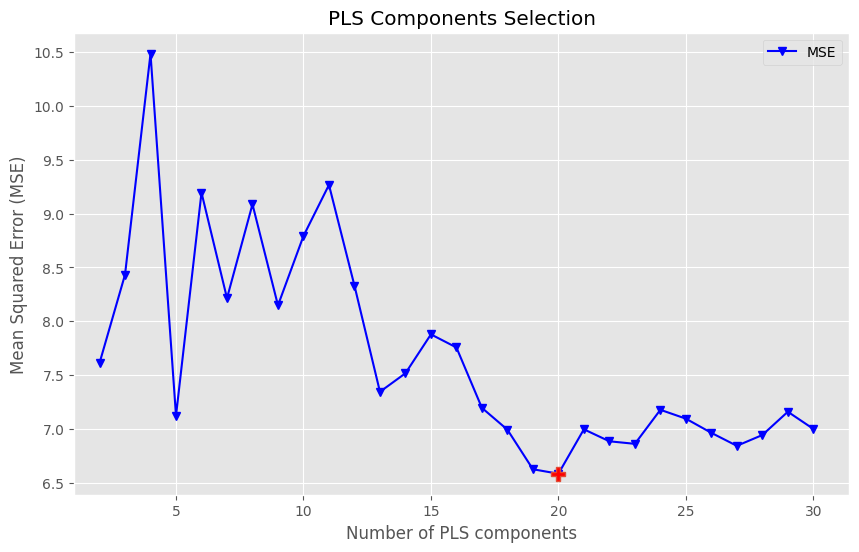

R^2 Training: 0.957
R^2 Cross-Validation: -0.571
MSE Training: 0.181
MSE Cross-Validation: 6.624


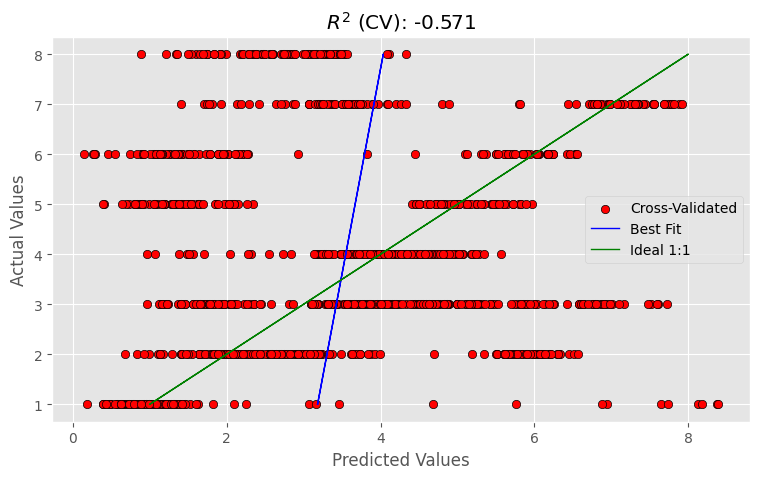

In [ ]:
#Call my function
pls_mse_analysis(X_dmem_train,y_dmem_train, 30, plot_components=True)

R² on Test Set: -0.181
MSE on Test Set: 5.231


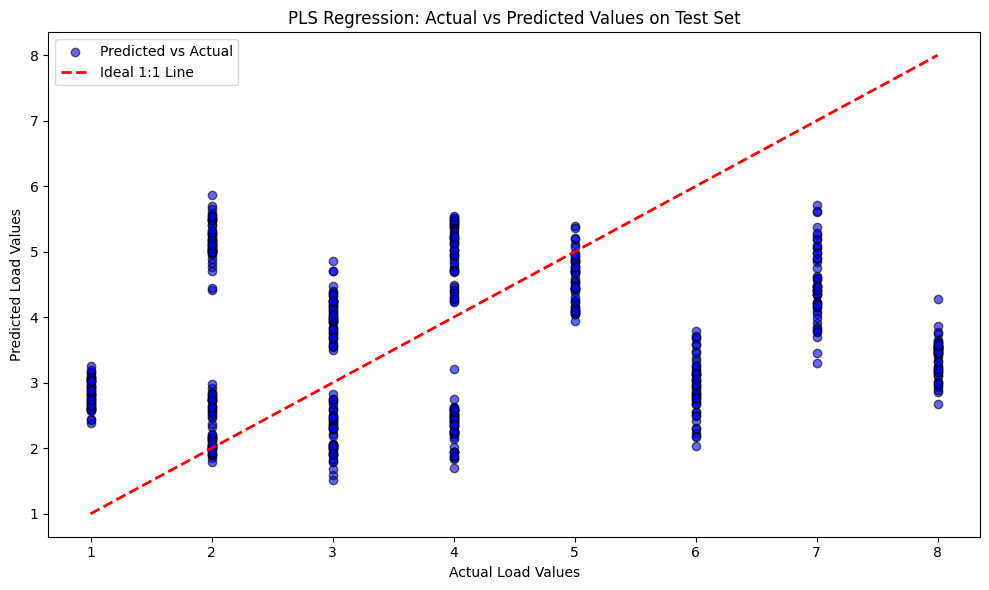

In [ ]:
#fit on training and preduct on test
pls = PLSRegression(n_components=4)
pls.fit(X_dmem_train, y_dmem_train)
y_test_pred = pls.predict(X_dmem_test)

r2_test = r2_score(y_dmem_test, y_test_pred)
mse_test = mean_squared_error(y_dmem_test, y_test_pred)

print(f"R² on Test Set: {r2_test:.3f}")
print(f"MSE on Test Set: {mse_test:.3f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_dmem_test, y_test_pred, color='blue', edgecolor='k', alpha=0.6, label="Predicted vs Actual")
plt.plot([y_dmem_test.min(), y_dmem_test.max()], [y_dmem_test.min(), y_dmem_test.max()], 'r--', lw=2, label="Ideal 1:1 Line")
plt.xlabel("Actual Load Values")
plt.ylabel("Predicted Load Values")
plt.title("PLS Regression: Actual vs Predicted Values on Test Set")
plt.legend()
plt.tight_layout()
plt.show()


## Polynomial Features using variance thresholding

Here I wanted to examine the effcets of tranforming the features to polynomial

In [ ]:
X_train_pls = pls.transform(X_dmem_train) #use my PLS for diumension reduction to use later
X_test_pls = pls.transform(X_dmem_test)

In [ ]:
variance_threshold = 0.065 #use variancve thresholding for reduction
selector = VarianceThreshold(threshold=variance_threshold)
X_reduced = selector.fit_transform(X_dmem_train)
selected_features = X_dmem_train.columns[selector.get_support()]

print("Original", X_dmem_train.shape)
print("Reduced feature matrix shape:", X_reduced.shape)
print("Selected features:", selected_features)


Original (1276, 512)
Reduced feature matrix shape: (1276, 12)
Selected features: Index(['I292', 'I293', 'I294', 'I295', 'I296', 'I297', 'I298', 'I299', 'I300',
       'I301', 'I302', 'I303'],
      dtype='object')


In [ ]:
X_reduced_test = selector.transform(X_dmem_test)
X_reduced_test.shape

(548, 12)

In [ ]:
#Here I do a cubic tranformation of the reduced feature set
poly = PolynomialFeatures(degree=3, include_bias=False)

X_poly = poly.fit_transform(X_reduced)
X_poly_test = poly.transform(X_reduced_test)

In [ ]:
X_poly.shape

(1276, 454)

In [ ]:
X_poly_df = pd.DataFrame(X_poly)
X_poly_df

,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
0,0.105895,0.072286,0.044459,0.029667,0.025373,0.024003,0.027337,0.029474,0.032884,0.035242,...,4.376949e-05,4.701659e-05,4.933681e-05,5.050458e-05,5.299693e-05,5.561227e-05,5.425132e-05,5.692857e-05,0.000060,0.000063
1,0.084048,0.050439,0.022770,0.008706,0.006135,0.005666,0.009957,0.013182,0.017611,0.020705,...,8.875547e-06,1.039668e-05,1.148781e-05,1.217850e-05,1.345663e-05,1.486891e-05,1.426570e-05,1.576289e-05,0.000017,0.000019
2,0.069027,0.035392,0.007804,-0.005737,-0.007007,-0.006889,-0.001984,0.001986,0.007112,0.010691,...,1.222024e-06,1.696788e-06,2.035792e-06,2.356002e-06,2.826710e-06,3.391461e-06,3.271323e-06,3.924904e-06,0.000005,0.000006
3,0.060830,0.027148,-0.000438,-0.013663,-0.014054,-0.013662,-0.008487,-0.004112,0.001389,0.005202,...,1.407537e-07,2.606230e-07,3.453086e-07,4.825759e-07,6.393819e-07,8.471397e-07,8.935494e-07,1.183895e-06,0.000002,0.000002
4,0.059457,0.025705,-0.001956,-0.015072,-0.015004,-0.014652,-0.009551,-0.005112,0.000441,0.004236,...,7.602503e-08,1.545852e-07,2.090855e-07,3.143253e-07,4.251433e-07,5.750309e-07,6.391323e-07,8.644635e-07,0.000001,0.000002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,0.646386,0.647441,0.653169,0.662923,0.674247,0.685811,0.696277,0.709173,0.721646,0.732222,...,3.925799e-01,3.958595e-01,3.978063e-01,3.991665e-01,4.011296e-01,4.031023e-01,4.025012e-01,4.044806e-01,0.406470,0.408469
1272,0.659244,0.661150,0.667727,0.677668,0.689433,0.701206,0.712008,0.725138,0.738003,0.749220,...,4.205604e-01,4.243141e-01,4.264065e-01,4.281012e-01,4.302124e-01,4.323339e-01,4.319222e-01,4.340522e-01,0.436193,0.438344
1273,0.674839,0.677161,0.684402,0.694573,0.706679,0.719155,0.730308,0.743752,0.757108,0.768843,...,4.544788e-01,4.587632e-01,4.611004e-01,4.630880e-01,4.654471e-01,4.678183e-01,4.674535e-01,4.698349e-01,0.472228,0.474634
1274,0.655504,0.657156,0.662572,0.671421,0.685378,0.700728,0.714289,0.728944,0.744308,0.756769,...,4.334006e-01,4.382527e-01,4.408553e-01,4.431592e-01,4.457909e-01,4.484382e-01,4.481205e-01,4.507817e-01,0.453459,0.456152


In [ ]:
#Using Lasso to extract best features as my GAM model can only take so many
c\v_strategy = KFold(n_splits=10)
lasso_cv = LassoCV(alphas=([0.001]), cv=cv_strategy, random_state=42)
lasso_cv.fit(X_poly, y_dmem_train)
lasso_selected_features = X_poly_df.columns[lasso_cv.coef_ != 0]

print("Best Alpha from LassoCV:", lasso_cv.alpha_)
print("Lasso Selected Features for GAM:\n", lasso_selected_features)

coef_df = pd.DataFrame(lasso_cv.coef_, index=X_poly_df.columns, columns=['Coefficient'])
print("Lasso Coefficients:\n", coef_df[coef_df['Coefficient'] != 0])


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 666.1273662597473, tolerance: 0.5165709930313593
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 517.0981865913632, tolerance: 0.4505528745644595
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 479.29511186026934, tolerance: 0.5195627177700352
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: Convergenc

Best Alpha from LassoCV: 0.001
Lasso Selected Features for GAM:
 Index([  1,   2,   3,   7,   8,   9,  10,  11,  13,  16,  17,  18,  20,  21,
        24,  32,  39,  41,  42,  51,  56,  58,  59,  63,  65,  66,  69,  71,
        72,  80,  81,  84,  90,  91, 102, 141, 147, 168, 213, 268, 349, 371,
       377, 398, 433, 443, 449, 452, 453],
      dtype='int64')
Lasso Coefficients:
      Coefficient
1       0.014443
2       0.232333
3       0.886159
7       0.249668
8       1.068714
9       2.366796
10      6.953283
11      8.228026
13      0.005178
16     -2.413842
17     -7.562948
18     -5.901460
20     -2.301121
21     -1.530600
24      1.898317
32     -1.174526
39     -0.085203
41     -1.726279
42     -1.360070
51     -0.134396
56     -1.672459
58     -1.086759
59     -0.997471
63     -4.948146
65     -1.085543
66     -0.887920
69     -3.236323
71     -0.826532
72     -0.749352
80     -0.048669
81     -0.263729
84     -0.313468
90     19.926153
91      1.156058
102     0.994962
141    

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.541e+02, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


GAM model

In [ ]:
pip install pygam


In [ ]:
#As GAM is addidative need to define indices
selected_features_indices = [  1,   2,   3,   7,   8,   9,  10,  11,  13,  16,  17,  18,  20,  21,
        24,  32,  39,  41,  42,  51,  56,  58,  59,  63,  65,  66,  69,  71,
        72,  80,  81,  84,  90,  91, 102, 141, 147, 168, 213, 268, 349, 371,
       377, 398, 433, 443, 449, 452, 453]


X_selected = X_poly_df.iloc[:, selected_features_indices]
print(X_selected.head())
#Define my addiditve GAM
gam = GAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) +
          s(8) + s(9) + s(10) + s(12) + s(13) + s(14) + s(15) +
          s(16) + s(16) + s(18) +s(19) + s(20) + s(21) + s(22)+
          s(23) + s(24) + s(25) + s(26) + s(27) + s(28) + s(29) + s(30) + s(31) + s(32) + s(33),
          link='identity')
gam.fit(X_dmem_train, y_dmem_train)

y_pred = gam.predict(X_dmem_test)
#EEvaluate on test set
mse = mean_squared_error(y_dmem_test, y_pred)
print(f'Mean Squared Error: {mse}')

        1         2         3         7         8         9         10   \
0  0.072286  0.044459  0.029667  0.029474  0.032884  0.035242  0.037856   
1  0.050439  0.022770  0.008706  0.013182  0.017611  0.020705  0.024253   
2  0.035392  0.007804 -0.005737  0.001986  0.007112  0.010691  0.014845   
3  0.027148 -0.000438 -0.013663 -0.004112  0.001389  0.005202  0.009632   
4  0.025705 -0.001956 -0.015072 -0.005112  0.000441  0.004236  0.008614   

        11        13        16   ...           268           349  \
0  0.039724  0.007655  0.002687  ...  3.322408e-05  1.896119e-05   
1  0.026798  0.004239  0.000516  ...  2.257486e-06  6.082256e-07   
2  0.017811  0.002443 -0.000484  ...  3.072000e-08 -2.758345e-08   
3  0.012761  0.001651 -0.000855  ... -3.152626e-08 -1.012174e-06   
4  0.011651  0.001528 -0.000892  ... -1.784297e-07 -1.368566e-06   

            371           377           398           433           443  \
0  1.574966e-05  1.793725e-05  2.042869e-05  4.651140e-05  5.1891

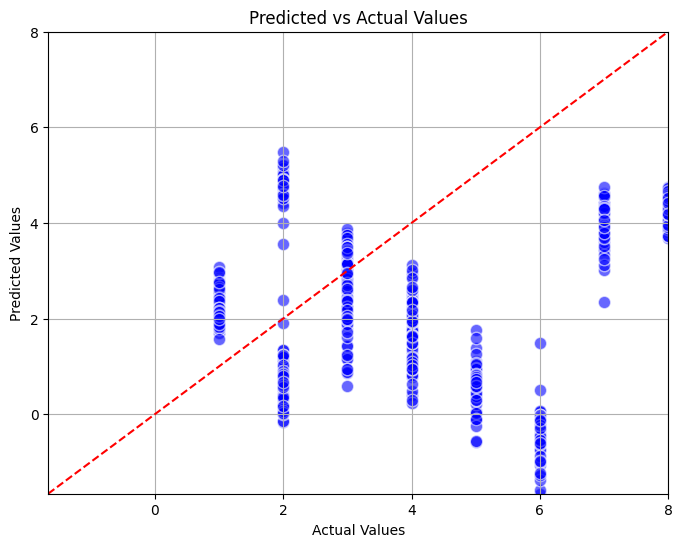

In [ ]:

plt.figure(figsize=(8, 6))
plt.scatter(y_dmem_test, y_pred, alpha=0.6, color='blue', edgecolors='w', s=80)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Predicted vs Actual Values')

max_value = max(max(y_dmem_test), max(y_pred))
min_value = min(min(y_dmem_test), min(y_pred))
plt.plot([min_value, max_value], [min_value, max_value], 'r--')

plt.grid()

plt.xlim([min_value, max_value])
plt.ylim([min_value, max_value])
plt.show()


## Lasso

In [ ]:
# same as above
alphas = np.logspace(-2, 0, 50)
lasso_cv = LassoCV(alphas=alphas, cv=10, random_state=42)
lasso_cv.fit(X_dmem_train, y_dmem_train)

best_alpha = lasso_cv.alpha_
print(f'Best Alpha: {best_alpha}')
lasso_coefficients = lasso_cv.coef_
print(f'Lasso Coefficients: {lasso_coefficients}')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.519826019777156, tolerance: 0.5106850174216024
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.5187427408877738, tolerance: 0.5106850174216024
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.7885352518887885, tolerance: 0.5042650696864108
  model = cd_fast.enet_coordinate_descent_gram(


Best Alpha: 1.0
Lasso Coefficients: [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0

In [ ]:
#here I am using cross-validation  on my lasso model
lasso_model = Lasso(alpha=.01, random_state=42)
cv_results = cross_validate(lasso_model, X_dmem_train, y_dmem_train, cv=10, scoring='neg_mean_squared_error', return_train_score=True)

train_mse_scores = -cv_results['train_score']
val_mse_scores = -cv_results['test_score'] #converting the negagtive mse to positive

print("Training MSE scores for each fold:")
print(train_mse_scores)
print("\nValidation MSE scores for each fold:")
print(val_mse_scores)

mean_train_mse = np.mean(train_mse_scores)
std_train_mse = np.std(train_mse_scores)
mean_val_mse = np.mean(val_mse_scores)
std_val_mse = np.std(val_mse_scores)

print(f"\nMean Training MSE: {mean_train_mse:.4f}")
print(f"Standard Deviation of Training MSE: {std_train_mse:.4f}")
print(f"\nMean Validation MSE: {mean_val_mse:.4f}")
print(f"Standard Deviation of Validation MSE: {std_val_mse:.4f}")

lasso_model.fit(X_dmem_train, y_dmem_train)
feature_importances = lasso_model.coef_

# Print only non-zero features
non_zero_features = np.where(feature_importances != 0)[0]  # Get indices of non-zero features

print("\nNon-Zero Feature Indices and Coefficients:")
for idx in non_zero_features:
    print(f"Feature index: {idx}, Coefficient: {feature_importances[idx]:.4f}")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.137e+00, tolerance: 4.506e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.796e-01, tolerance: 5.196e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.854e-01, tolerance: 4.960e

Training MSE scores for each fold:
[2.78915128 2.43670995 3.12868756 2.77013719 3.07281826 2.73876928
 3.04589076 3.05189695 3.2394722  2.32496284]

Validation MSE scores for each fold:
[28.90917277 10.77053195  1.94741605  5.1884396   4.04400827 10.21451523
  3.72597651  2.03275379  0.48693334 12.88033353]

Mean Training MSE: 2.8598
Standard Deviation of Training MSE: 0.2874

Mean Validation MSE: 8.0200
Standard Deviation of Validation MSE: 8.0256

Non-Zero Feature Indices and Coefficients:
Feature index: 69, Coefficient: -1.1898
Feature index: 71, Coefficient: -0.0645
Feature index: 72, Coefficient: -1.8867
Feature index: 73, Coefficient: -3.0418
Feature index: 349, Coefficient: -1.1698
Feature index: 492, Coefficient: -6.2231
Feature index: 503, Coefficient: 8.2358
Feature index: 511, Coefficient: 1.2636


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


Test Set Evaluation:
Mean Squared Error (MSE): 5.5126
Mean Absolute Error (MAE): 1.9393
R^2 Score: -0.2451


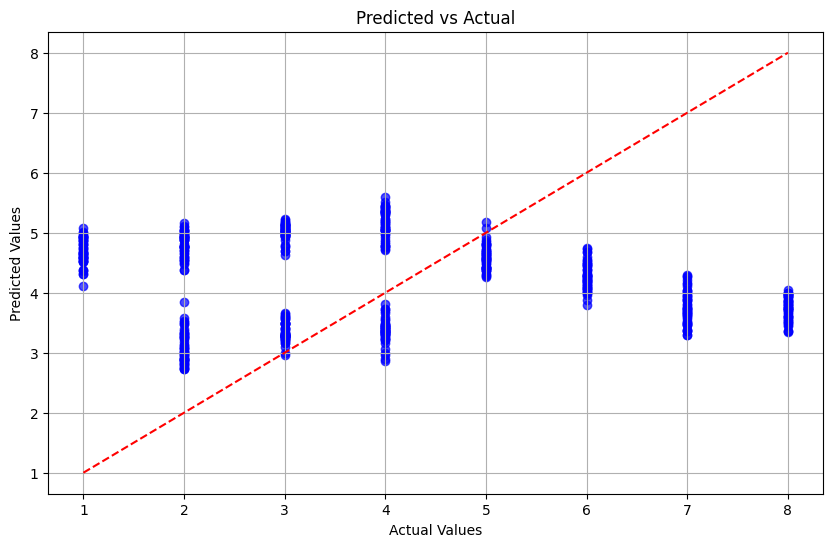

In [ ]:
y_test_pred = lasso_model.predict(X_dmem_test)

mse_test = mean_squared_error(y_dmem_test, y_test_pred)
mae_test = mean_absolute_error(y_dmem_test, y_test_pred)
r2_test = r2_score(y_dmem_test, y_test_pred)

print(f"Test Set Evaluation:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R^2 Score: {r2_test:.4f}")

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_dmem_test, y_test_pred, alpha=0.7, color='blue')
plt.plot([y_dmem_test.min(), y_dmem_test.max()], [y_dmem_test.min(), y_dmem_test.max()], 'r--')
plt.title('Predicted vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid()
plt.show()


## With Hyperparameters

In [ ]:
#Here I tune my lasso Alpha to regulate the amount of regulatsation

pipeline = make_pipeline(Lasso(random_state=42))


param_grid = {
    'lasso__alpha': [.001,.01]
}

#Using nested CV to avoid data leakage when tuning
inner_cv = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

outer_cv_results = cross_validate(
    inner_cv,
    X_dmem_train,
    y_dmem_train,
    cv=10,
    scoring='r2',
    return_train_score=True
)

outer_train_mse_scores = -outer_cv_results['train_score']
outer_val_mse_scores = -outer_cv_results['test_score']

print("Training MSE scores for each outer fold:")
print(outer_train_mse_scores)
print("\nValidation MSE scores for each outer fold:")
print(outer_val_mse_scores)

mean_outer_train_mse = np.mean(outer_train_mse_scores)
std_outer_train_mse = np.std(outer_train_mse_scores)
mean_outer_val_mse = np.mean(outer_val_mse_scores)
std_outer_val_mse = np.std(outer_val_mse_scores)

print(f"\nMean Outer Training MSE: {mean_outer_train_mse:.4f}")
print(f"Standard Deviation of Outer Training MSE: {std_outer_train_mse:.4f}")
print(f"\nMean Outer Validation MSE: {mean_outer_val_mse:.4f}")
print(f"Standard Deviation of Outer Validation MSE: {std_outer_val_mse:.4f}")

# I fit the final model on the entire training data with the best alpha found in the inner CV
inner_cv.fit(X_dmem_train, y_dmem_train)
best_alpha = inner_cv.best_params_['lasso__alpha']
print(f"\nBest alpha found: {best_alpha:.4f}")

# I get the coefficients from the best estimator in the inner CV
final_model = inner_cv.best_estimator_
feature_importances = final_model.named_steps['lasso'].coef_

non_zero_features = np.where(feature_importances != 0)[0]  # Get indices of non-zero features
print("\nNon-Zero Feature Indices and Coefficients:")
for idx in non_zero_features:
    print(f"Feature index: {idx}, Coefficient: {feature_importances[idx]:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.137e+00, tolerance: 4.506e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.796e-01, tolerance: 5.196e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.854e-01, tolerance: 4.960e

Training MSE scores for each outer fold:
[-0.3801538  -0.37913102 -0.30870072 -0.37728397 -0.3004482  -0.18629447
 -0.29434074 -0.31309678 -0.29141376 -0.82626564]

Validation MSE scores for each outer fold:
[36.68981353  0.79015364  2.35857521  7.7384246   5.00208637  0.13605557
  4.51949625  2.05671134 -0.26655325 12.05082953]

Mean Outer Training MSE: -0.3657
Standard Deviation of Outer Training MSE: 0.1630

Mean Outer Validation MSE: 7.1076
Standard Deviation of Outer Validation MSE: 10.4978

Best alpha found: 0.0100

Non-Zero Feature Indices and Coefficients:
Feature index: 69, Coefficient: -1.1898
Feature index: 71, Coefficient: -0.0645
Feature index: 72, Coefficient: -1.8867
Feature index: 73, Coefficient: -3.0418
Feature index: 349, Coefficient: -1.1698
Feature index: 492, Coefficient: -6.2231
Feature index: 503, Coefficient: 8.2358
Feature index: 511, Coefficient: 1.2636


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


Test Set Evaluation:
Mean Squared Error (MSE): 5.5126
Mean Absolute Error (MAE): 1.9393
R^2 Score: -0.2451


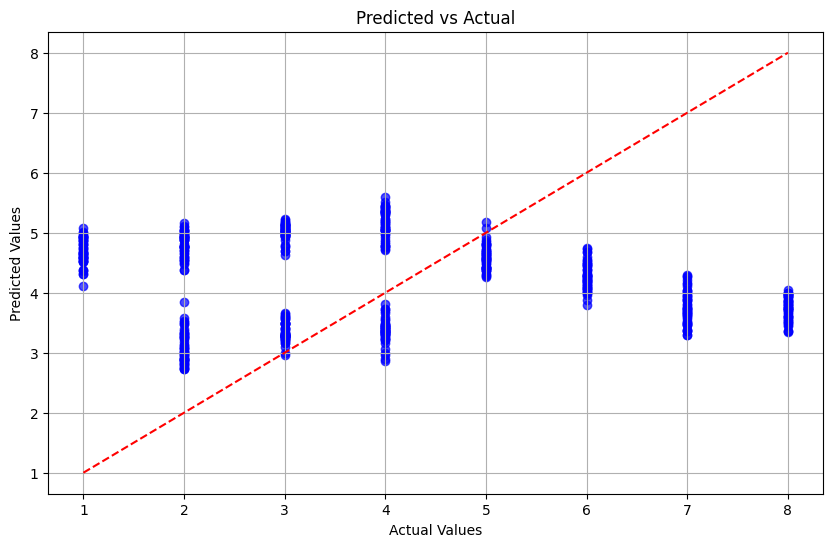

In [ ]:
lasso_model = Lasso(alpha=best_alpha, random_state=42)
lasso_model.fit(X_dmem_train, y_dmem_train)
y_test_pred = lasso_model.predict(X_dmem_test)


mse_test = mean_squared_error(y_dmem_test, y_test_pred)
mae_test = mean_absolute_error(y_dmem_test, y_test_pred)
r2_test = r2_score(y_dmem_test, y_test_pred)


print(f"Test Set Evaluation:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R^2 Score: {r2_test:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_dmem_test, y_test_pred, alpha=0.7, color='blue')
plt.plot([y_dmem_test.min(), y_dmem_test.max()], [y_dmem_test.min(), y_dmem_test.max()], 'r--')
plt.title('Predicted vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid()
plt.show()


## GAM with best predictors

In [ ]:
#Taken from above
non_zero_features = np.array([69, 71, 72, 73, 349,492,503,511])

print(non_zero_features)


[ 69  71  72  73 349 492 503 511]


In [ ]:
non_zero_features

array([ 69,  71,  72,  73, 349, 492, 503, 511])

In [ ]:
X_train_gam = X_dmem_train.iloc[:, non_zero_features]
X_test_gam = X_dmem_test.iloc[:, non_zero_features]
# I f a GAM model; using s() for each selected feature
gam = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4)+s(5)+s(6)+s(7))
gam.fit(X_train_gam, y_dmem_train)

y_pred_gam = gam.predict(X_test_gam)

mse_gam = mean_squared_error(y_dmem_test, y_pred_gam)
mae_gam = mean_absolute_error(y_dmem_test, y_pred_gam)
r2_gam = r2_score(y_dmem_test, y_pred_gam)

# Print results
print(f'MSE of GAM model: {mse_gam:.4f}')
print(f'MAE of GAM model: {mae_gam:.4f}')
print(f'R² of GAM model: {r2_gam:.4f}')



MSE of GAM model: 7.2304
MAE of GAM model: 2.4941
R² of GAM model: -0.6331


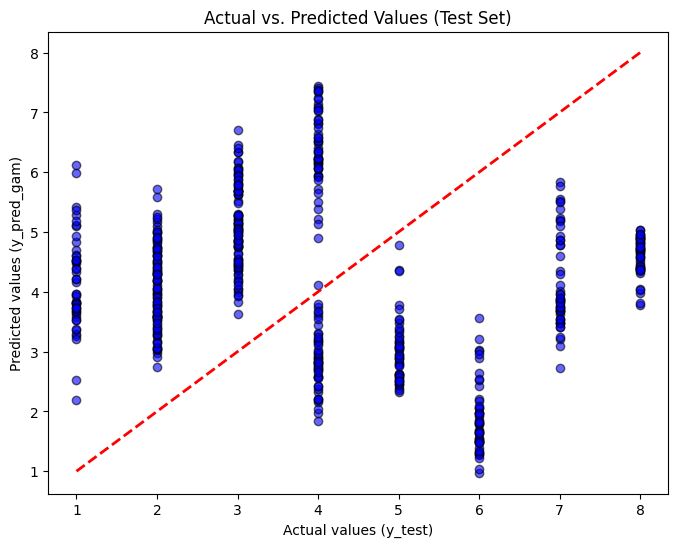

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_dmem_test, y_pred_gam, alpha=0.6, color="b", edgecolor='k')
plt.plot([y_dmem_test.min(), y_dmem_test.max()], [y_dmem_test.min(), y_dmem_test.max()], 'r--', lw=2)
plt.xlabel("Actual values (y_test)")
plt.ylabel("Predicted values (y_pred_gam)")
plt.title("Actual vs. Predicted Values (Test Set)")
plt.show()
#Made more daring predictions than Lasso

## RFE Random Forest

In [ ]:
df_train = pd.DataFrame(X_dmem_train)
df_train

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,0.776890,0.778472,0.780153,0.782643,0.783682,0.791132,0.798997,0.804266,0.804020,0.800389,...,0.453611,0.505623,0.515211,0.503860,0.532883,0.548725,0.546357,0.539588,0.546775,0.546753
1,0.750863,0.752308,0.754210,0.756859,0.756386,0.763167,0.772617,0.778975,0.779275,0.776022,...,0.412047,0.460688,0.473013,0.456202,0.481598,0.494839,0.491829,0.482428,0.485235,0.484757
2,0.733249,0.734549,0.736642,0.739342,0.737585,0.743781,0.754340,0.761453,0.762180,0.759201,...,0.382929,0.427568,0.442086,0.421572,0.444513,0.455728,0.451911,0.440418,0.439424,0.438543
3,0.724049,0.725196,0.727447,0.730094,0.727279,0.732974,0.744164,0.751700,0.752736,0.749928,...,0.366259,0.406263,0.422428,0.399972,0.421627,0.431393,0.426601,0.413557,0.409341,0.408111
4,0.723262,0.724247,0.726626,0.729113,0.725467,0.730747,0.742091,0.749716,0.750941,0.748202,...,0.362037,0.396774,0.414040,0.391401,0.412941,0.421833,0.415900,0.401847,0.394988,0.393462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,0.314304,0.316008,0.315729,0.310691,0.308526,0.311822,0.316002,0.320699,0.326334,0.329589,...,0.392232,0.369194,0.373362,0.383406,0.390563,0.378134,0.390992,0.415615,0.410625,0.389229
1272,0.319173,0.319640,0.318688,0.313556,0.310760,0.312590,0.315760,0.320237,0.325069,0.327446,...,0.400917,0.370642,0.373195,0.383325,0.396786,0.389388,0.404906,0.427248,0.423127,0.403838
1273,0.323190,0.323374,0.322006,0.316919,0.313425,0.313333,0.315431,0.318715,0.324009,0.325581,...,0.420492,0.390935,0.398645,0.406848,0.427225,0.426274,0.441483,0.454014,0.447150,0.432967
1274,0.352007,0.352921,0.353550,0.349298,0.344386,0.349613,0.357302,0.358902,0.360909,0.360257,...,0.572941,0.575283,0.585440,0.584361,0.573834,0.583102,0.593663,0.587359,0.582985,0.546497


In [ ]:
X_train_pls.shape

(1276, 4)

In [ ]:
y_dmem_train

,Load
0,1
1,1
2,1
3,1
4,1
...,...
1271,8
1272,8
1273,8
1274,1


## RFE Random Forest

Number of components needed to explain 99% of the variance: 2


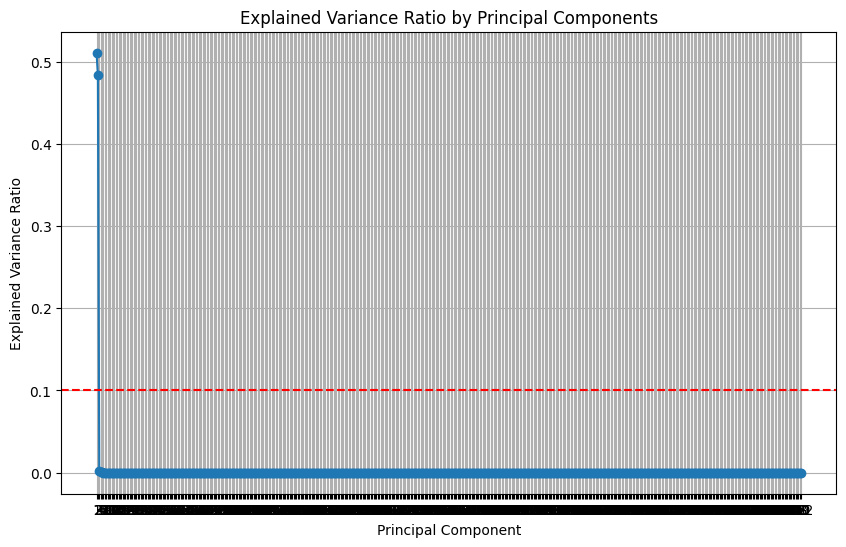

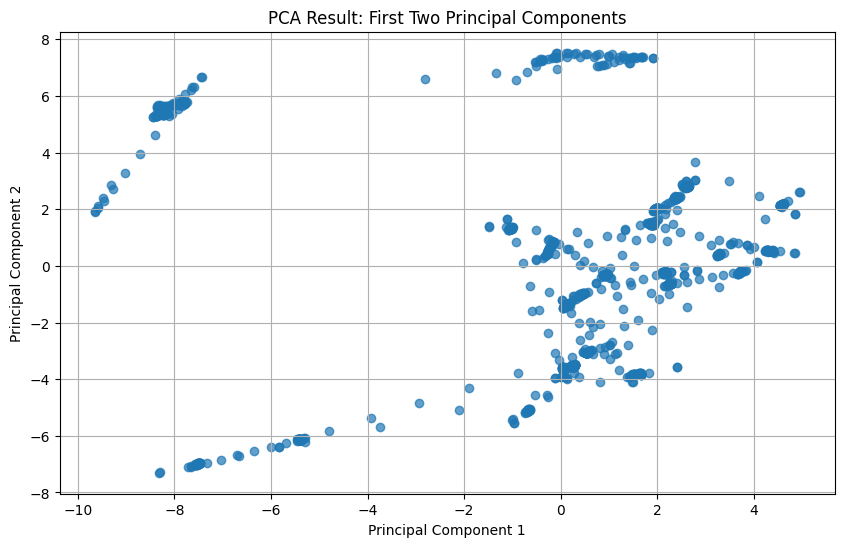

In [ ]:

pca = PCA()
X_pca = pca.fit_transform(X_dmem_train)

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# I determine the number of components to reach 99% variance
n_components_99 = np.argmax(cumulative_explained_variance >= 0.99) + 1
print(f"Number of components needed to explain 99% of the variance: {n_components_99}")
# Plotting the explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio by Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.grid()
plt.axhline(y=0.1, color='r', linestyle='--')
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)
plt.title('PCA Result: First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

In [ ]:
n_components = 2
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_dmem_train)
X_test_pca = pca.fit_transform(X_dmem_test)

In [ ]:
df_train_pca = pd.DataFrame(X_pca)
df_train_pca
df_test_pca = pd.DataFrame(X_test_pca)
df_test_pca

,0,1
0,-1.852398,0.673709
1,-1.985740,0.493857
2,-2.072129,0.400309
3,-2.060840,0.398439
4,-1.976398,0.521880
...,...,...
543,2.335552,-1.210212
544,1.999628,-1.304084
545,1.394804,-1.465878
546,0.612340,-1.675918


In [ ]:
model = RandomForestRegressor()
rfecv = RFECV(estimator=model, step=1, cv=5, scoring='r2') #I use RFE cross valdiation focuing on best fit to avoid overfitting
rfecv.fit(X_pca, y_dmem_train)




RFECV(cv=5, estimator=RandomForestRegressor(), scoring='r2')

In [ ]:
selected_features = df_train_pca.columns[rfecv.support_]
print("Selected features:", selected_features)

print("Cross-validation scores for each step:")
mean_test_scores = -rfecv.cv_results_['mean_test_score']
std_test_scores = rfecv.cv_results_['std_test_score']
print(mean_test_scores)
print(std_test_scores)

mean_mse = np.mean(mean_test_scores)
avg_std = np.mean(std_test_scores)
print(f"\nMean MSE across folds: {mean_mse:.4f}")
print(f"Average Std Dev of MSE across folds: {avg_std:.4f}")

Selected features: Index([0, 1], dtype='int64')
Cross-validation scores for each step:
[2.59372718 1.90555246]
[1.40886551 1.48436285]

Mean MSE across folds: 2.2496
Average Std Dev of MSE across folds: 1.4466


# PBS

## Partial Least Squares

In [ ]:
X_pbs_train.shape

(1276, 512)

100% completed
Optimal number of PLS components: 19


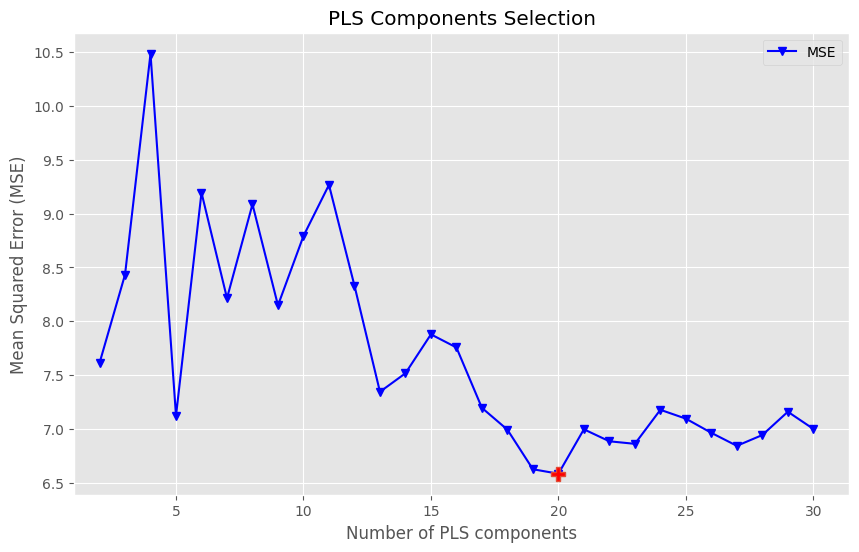

R^2 Training: 0.957
R^2 Cross-Validation: -0.571
MSE Training: 0.181
MSE Cross-Validation: 6.624


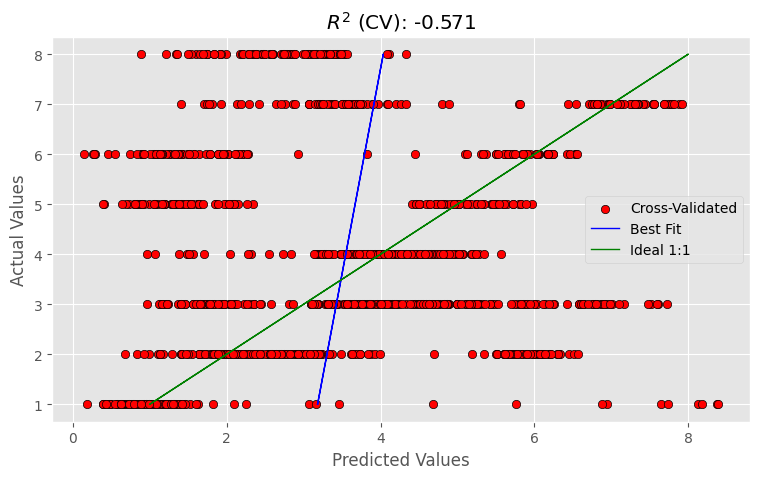

In [ ]:
pls_mse_analysis(X_pbs_train,y_pbs_train, 30, plot_components=True)

R² on Test Set: -0.181
MSE on Test Set: 5.231


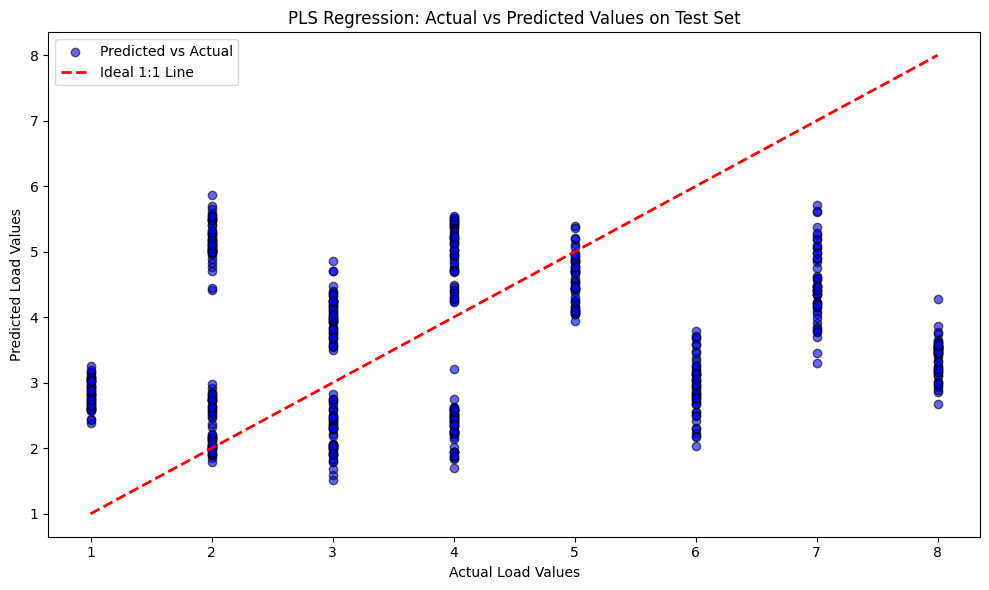

In [ ]:
pls = PLSRegression(n_components=4)
pls.fit(X_pbs_train, y_pbs_train)
y_test_pred = pls.predict(X_pbs_test)

r2_test = r2_score(y_pbs_test, y_test_pred)
mse_test = mean_squared_error(y_pbs_test, y_test_pred)

print(f"R² on Test Set: {r2_test:.3f}")
print(f"MSE on Test Set: {mse_test:.3f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_pbs_test, y_test_pred, color='blue', edgecolor='k', alpha=0.6, label="Predicted vs Actual")
plt.plot([y_pbs_test.min(), y_pbs_test.max()], [y_pbs_test.min(), y_pbs_test.max()], 'r--', lw=2, label="Ideal 1:1 Line")
plt.xlabel("Actual Load Values")
plt.ylabel("Predicted Load Values")
plt.title("PLS Regression: Actual vs Predicted Values on Test Set")
plt.legend()
plt.tight_layout()
plt.show()



## Polynomial Features using variance thresholding

Here I wanted to examine the effcets of tranforming the features to polynomial

In [ ]:
X_train_pls = pls.transform(X_pbs_train) #use my PLS for diumension reduction to use later
X_test_pls = pls.transform(X_pbs_test)

In [ ]:
variance_threshold = 0.065 #use variancve thresholding for reduction
selector = VarianceThreshold(threshold=variance_threshold)
X_reduced = selector.fit_transform(X_pbs_train)
selected_features = X_pbs_train.columns[selector.get_support()]

print("Original", X_pbs_train.shape)
print("Reduced feature matrix shape:", X_reduced.shape)
print("Selected features:", selected_features)


Original (1276, 512)
Reduced feature matrix shape: (1276, 12)
Selected features: Index(['I292', 'I293', 'I294', 'I295', 'I296', 'I297', 'I298', 'I299', 'I300',
       'I301', 'I302', 'I303'],
      dtype='object')


In [ ]:
X_reduced_test = selector.transform(X_pbs_test)
X_reduced_test.shape

(548, 12)

In [ ]:
#Here I do a cubic tranformation of the reduced feature set
poly = PolynomialFeatures(degree=3, include_bias=False)

X_poly = poly.fit_transform(X_reduced)
X_poly_test = poly.transform(X_reduced_test)

In [ ]:
X_poly.shape

(1276, 454)

In [ ]:
X_poly_df = pd.DataFrame(X_poly)
X_poly_df

,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
0,0.105895,0.072286,0.044459,0.029667,0.025373,0.024003,0.027337,0.029474,0.032884,0.035242,...,4.376949e-05,4.701659e-05,4.933681e-05,5.050458e-05,5.299693e-05,5.561227e-05,5.425132e-05,5.692857e-05,0.000060,0.000063
1,0.084048,0.050439,0.022770,0.008706,0.006135,0.005666,0.009957,0.013182,0.017611,0.020705,...,8.875547e-06,1.039668e-05,1.148781e-05,1.217850e-05,1.345663e-05,1.486891e-05,1.426570e-05,1.576289e-05,0.000017,0.000019
2,0.069027,0.035392,0.007804,-0.005737,-0.007007,-0.006889,-0.001984,0.001986,0.007112,0.010691,...,1.222024e-06,1.696788e-06,2.035792e-06,2.356002e-06,2.826710e-06,3.391461e-06,3.271323e-06,3.924904e-06,0.000005,0.000006
3,0.060830,0.027148,-0.000438,-0.013663,-0.014054,-0.013662,-0.008487,-0.004112,0.001389,0.005202,...,1.407537e-07,2.606230e-07,3.453086e-07,4.825759e-07,6.393819e-07,8.471397e-07,8.935494e-07,1.183895e-06,0.000002,0.000002
4,0.059457,0.025705,-0.001956,-0.015072,-0.015004,-0.014652,-0.009551,-0.005112,0.000441,0.004236,...,7.602503e-08,1.545852e-07,2.090855e-07,3.143253e-07,4.251433e-07,5.750309e-07,6.391323e-07,8.644635e-07,0.000001,0.000002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,0.646386,0.647441,0.653169,0.662923,0.674247,0.685811,0.696277,0.709173,0.721646,0.732222,...,3.925799e-01,3.958595e-01,3.978063e-01,3.991665e-01,4.011296e-01,4.031023e-01,4.025012e-01,4.044806e-01,0.406470,0.408469
1272,0.659244,0.661150,0.667727,0.677668,0.689433,0.701206,0.712008,0.725138,0.738003,0.749220,...,4.205604e-01,4.243141e-01,4.264065e-01,4.281012e-01,4.302124e-01,4.323339e-01,4.319222e-01,4.340522e-01,0.436193,0.438344
1273,0.674839,0.677161,0.684402,0.694573,0.706679,0.719155,0.730308,0.743752,0.757108,0.768843,...,4.544788e-01,4.587632e-01,4.611004e-01,4.630880e-01,4.654471e-01,4.678183e-01,4.674535e-01,4.698349e-01,0.472228,0.474634
1274,0.655504,0.657156,0.662572,0.671421,0.685378,0.700728,0.714289,0.728944,0.744308,0.756769,...,4.334006e-01,4.382527e-01,4.408553e-01,4.431592e-01,4.457909e-01,4.484382e-01,4.481205e-01,4.507817e-01,0.453459,0.456152


In [ ]:
#Using Lasso to extract best features as my GAM model can only take so many
c\v_strategy = KFold(n_splits=10)
lasso_cv = LassoCV(alphas=([0.001]), cv=cv_strategy, random_state=42)
lasso_cv.fit(X_poly, y_pbs_train)
lasso_selected_features = X_poly_df.columns[lasso_cv.coef_ != 0]

print("Best Alpha from LassoCV:", lasso_cv.alpha_)
print("Lasso Selected Features for GAM:\n", lasso_selected_features)

coef_df = pd.DataFrame(lasso_cv.coef_, index=X_poly_df.columns, columns=['Coefficient'])
print("Lasso Coefficients:\n", coef_df[coef_df['Coefficient'] != 0])


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 666.1273662597473, tolerance: 0.5165709930313593
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 517.0981865913632, tolerance: 0.4505528745644595
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 479.29511186026934, tolerance: 0.5195627177700352
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: Convergenc

Best Alpha from LassoCV: 0.001
Lasso Selected Features for GAM:
 Index([  1,   2,   3,   7,   8,   9,  10,  11,  13,  16,  17,  18,  20,  21,
        24,  32,  39,  41,  42,  51,  56,  58,  59,  63,  65,  66,  69,  71,
        72,  80,  81,  84,  90,  91, 102, 141, 147, 168, 213, 268, 349, 371,
       377, 398, 433, 443, 449, 452, 453],
      dtype='int64')
Lasso Coefficients:
      Coefficient
1       0.014443
2       0.232333
3       0.886159
7       0.249668
8       1.068714
9       2.366796
10      6.953283
11      8.228026
13      0.005178
16     -2.413842
17     -7.562948
18     -5.901460
20     -2.301121
21     -1.530600
24      1.898317
32     -1.174526
39     -0.085203
41     -1.726279
42     -1.360070
51     -0.134396
56     -1.672459
58     -1.086759
59     -0.997471
63     -4.948146
65     -1.085543
66     -0.887920
69     -3.236323
71     -0.826532
72     -0.749352
80     -0.048669
81     -0.263729
84     -0.313468
90     19.926153
91      1.156058
102     0.994962
141    

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.541e+02, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


GAM model

In [ ]:
pip install pygam


In [ ]:
selected_features_indices = [  1,   2,   3,   7,   8,   9,  10,  11,  13,  16,  17,  18,  20,  21,
        24,  32,  39,  41,  42,  51,  56,  58,  59,  63,  65,  66,  69,  71,
        72,  80,  81,  84,  90,  91, 102, 141, 147, 168, 213, 268, 349, 371,
       377, 398, 433, 443, 449, 452, 453]

X_selected = X_poly_df.iloc[:, selected_features_indices]
print(X_selected.head())

gam = GAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) +
          s(8) + s(9) + s(10) + s(12) + s(13) + s(14) + s(15) +
          s(16) + s(16) + s(18) + s(19) + s(20) + s(21) + s(22) +
          s(23) + s(24) + s(25) + s(26) + s(27) + s(28) + s(29) + s(30) + s(31) + s(32) + s(33),
          link='identity')
gam.fit(X_pbs_train, y_pbs_train)

y_pred = gam.predict(X_pbs_test)

mse = mean_squared_error(y_pbs_test, y_pred)
print(f'Mean Squared Error: {mse}')


        1         2         3         7         8         9         10   \
0  0.072286  0.044459  0.029667  0.029474  0.032884  0.035242  0.037856   
1  0.050439  0.022770  0.008706  0.013182  0.017611  0.020705  0.024253   
2  0.035392  0.007804 -0.005737  0.001986  0.007112  0.010691  0.014845   
3  0.027148 -0.000438 -0.013663 -0.004112  0.001389  0.005202  0.009632   
4  0.025705 -0.001956 -0.015072 -0.005112  0.000441  0.004236  0.008614   

        11        13        16   ...           268           349  \
0  0.039724  0.007655  0.002687  ...  3.322408e-05  1.896119e-05   
1  0.026798  0.004239  0.000516  ...  2.257486e-06  6.082256e-07   
2  0.017811  0.002443 -0.000484  ...  3.072000e-08 -2.758345e-08   
3  0.012761  0.001651 -0.000855  ... -3.152626e-08 -1.012174e-06   
4  0.011651  0.001528 -0.000892  ... -1.784297e-07 -1.368566e-06   

            371           377           398           433           443  \
0  1.574966e-05  1.793725e-05  2.042869e-05  4.651140e-05  5.1891

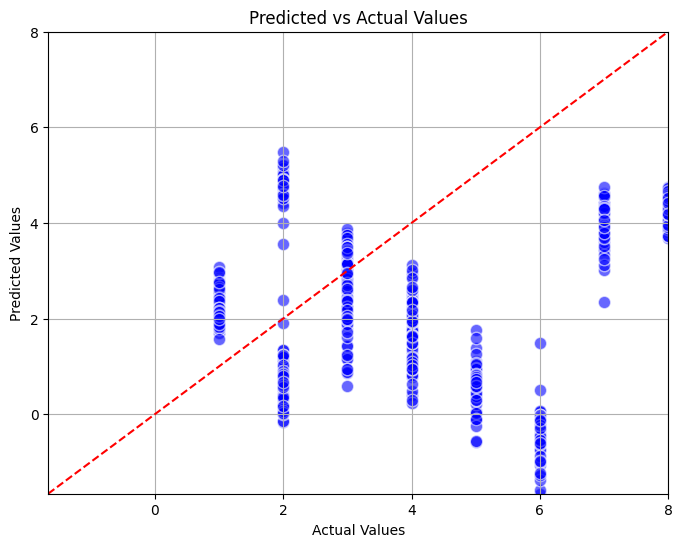

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_pbs_test, y_pred, alpha=0.6, color='blue', edgecolors='w', s=80)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Predicted vs Actual Values')

max_value = max(max(y_pbs_test), max(y_pred))
min_value = min(min(y_pbs_test), min(y_pred))
plt.plot([min_value, max_value], [min_value, max_value], 'r--')

plt.grid()

plt.xlim([min_value, max_value])
plt.ylim([min_value, max_value])
plt.show()


## Lasso

In [ ]:
# same as above
alphas = np.logspace(-2, 0, 50)
lasso_cv = LassoCV(alphas=alphas, cv=10, random_state=42)
lasso_cv.fit(X_pbs_train, y_pbs_train)

best_alpha = lasso_cv.alpha_
print(f'Best Alpha: {best_alpha}')
lasso_coefficients = lasso_cv.coef_
print(f'Lasso Coefficients: {lasso_coefficients}')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.519826019777156, tolerance: 0.5106850174216024
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.5187427408877738, tolerance: 0.5106850174216024
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.7885352518887885, tolerance: 0.5042650696864108
  model = cd_fast.enet_coordinate_descent_gram(


Best Alpha: 1.0
Lasso Coefficients: [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.
 -0. -0. -0. -0

In [ ]:
lasso_model = Lasso(alpha=.01, random_state=42)
cv_results = cross_validate(lasso_model, X_pbs_train, y_pbs_train, cv=10, scoring='neg_mean_squared_error', return_train_score=True)

train_mse_scores = -cv_results['train_score']
val_mse_scores = -cv_results['test_score']  # Converting the negative MSE to positive

print("Training MSE scores for each fold:")
print(train_mse_scores)
print("\nValidation MSE scores for each fold:")
print(val_mse_scores)

mean_train_mse = np.mean(train_mse_scores)
std_train_mse = np.std(train_mse_scores)
mean_val_mse = np.mean(val_mse_scores)
std_val_mse = np.std(val_mse_scores)

print(f"\nMean Training MSE: {mean_train_mse:.4f}")
print(f"Standard Deviation of Training MSE: {std_train_mse:.4f}")
print(f"\nMean Validation MSE: {mean_val_mse:.4f}")
print(f"Standard Deviation of Validation MSE: {std_val_mse:.4f}")

lasso_model.fit(X_pbs_train, y_pbs_train)
feature_importances = lasso_model.coef_

# Print only non-zero features
non_zero_features = np.where(feature_importances != 0)[0]  # Get indices of non-zero features

print("\nNon-Zero Feature Indices and Coefficients:")
for idx in non_zero_features:
    print(f"Feature index: {idx}, Coefficient: {feature_importances[idx]:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.137e+00, tolerance: 4.506e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.796e-01, tolerance: 5.196e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.854e-01, tolerance: 4.960e

Training MSE scores for each fold:
[2.78915128 2.43670995 3.12868756 2.77013719 3.07281826 2.73876928
 3.04589076 3.05189695 3.2394722  2.32496284]

Validation MSE scores for each fold:
[28.90917277 10.77053195  1.94741605  5.1884396   4.04400827 10.21451523
  3.72597651  2.03275379  0.48693334 12.88033353]

Mean Training MSE: 2.8598
Standard Deviation of Training MSE: 0.2874

Mean Validation MSE: 8.0200
Standard Deviation of Validation MSE: 8.0256

Non-Zero Feature Indices and Coefficients:
Feature index: 69, Coefficient: -1.1898
Feature index: 71, Coefficient: -0.0645
Feature index: 72, Coefficient: -1.8867
Feature index: 73, Coefficient: -3.0418
Feature index: 349, Coefficient: -1.1698
Feature index: 492, Coefficient: -6.2231
Feature index: 503, Coefficient: 8.2358
Feature index: 511, Coefficient: 1.2636


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


Test Set Evaluation:
Mean Squared Error (MSE): 5.5126
Mean Absolute Error (MAE): 1.9393
R^2 Score: -0.2451


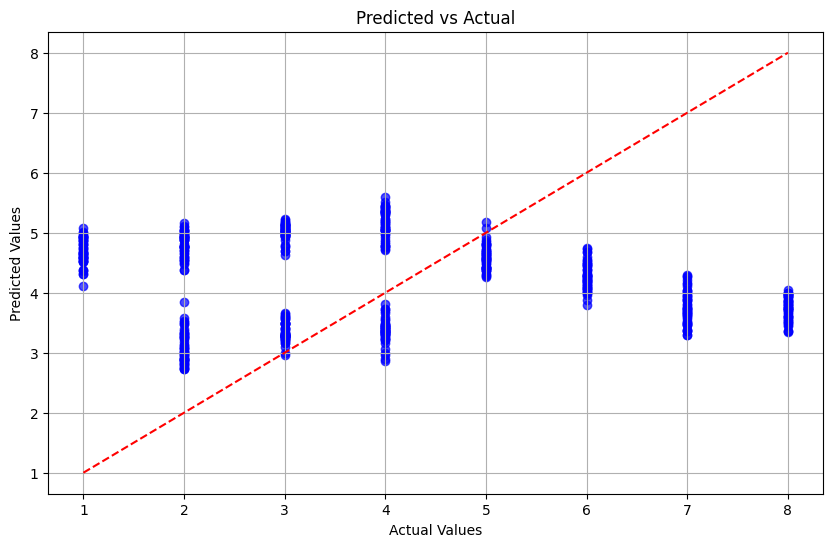

In [ ]:
y_test_pred = lasso_model.predict(X_pbs_test)

mse_test = mean_squared_error(y_pbs_test, y_test_pred)
mae_test = mean_absolute_error(y_pbs_test, y_test_pred)
r2_test = r2_score(y_pbs_test, y_test_pred)

print(f"Test Set Evaluation:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R^2 Score: {r2_test:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_pbs_test, y_test_pred, alpha=0.7, color='blue')
plt.plot([y_pbs_test.min(), y_pbs_test.max()], [y_pbs_test.min(), y_pbs_test.max()], 'r--')
plt.title('Predicted vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid()
plt.show()


## With Hyperparameters

In [ ]:
# Here I tune my lasso Alpha to regulate the amount of regularization

pipeline = make_pipeline(Lasso(random_state=42))

param_grid = {
    'lasso__alpha': [.001, .01]
}

# Using nested CV to avoid data leakage when tuning
inner_cv = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

outer_cv_results = cross_validate(
    inner_cv,
    X_pbs_train,
    y_pbs_train,
    cv=10,
    scoring='r2',
    return_train_score=True
)

outer_train_mse_scores = -outer_cv_results['train_score']
outer_val_mse_scores = -outer_cv_results['test_score']

print("Training MSE scores for each outer fold:")
print(outer_train_mse_scores)
print("\nValidation MSE scores for each outer fold:")
print(outer_val_mse_scores)

mean_outer_train_mse = np.mean(outer_train_mse_scores)
std_outer_train_mse = np.std(outer_train_mse_scores)
mean_outer_val_mse = np.mean(outer_val_mse_scores)
std_outer_val_mse = np.std(outer_val_mse_scores)

print(f"\nMean Outer Training MSE: {mean_outer_train_mse:.4f}")
print(f"Standard Deviation of Outer Training MSE: {std_outer_train_mse:.4f}")
print(f"\nMean Outer Validation MSE: {mean_outer_val_mse:.4f}")
print(f"Standard Deviation of Outer Validation MSE: {std_outer_val_mse:.4f}")

# I fit the final model on the entire training data with the best alpha found in the inner CV
inner_cv.fit(X_pbs_train, y_pbs_train)
best_alpha = inner_cv.best_params_['lasso__alpha']
print(f"\nBest alpha found: {best_alpha:.4f}")

# I get the coefficients from the best estimator in the inner CV
final_model = inner_cv.best_estimator_
feature_importances = final_model.named_steps['lasso'].coef_

non_zero_features = np.where(feature_importances != 0)[0]  # Get indices of non-zero features
print("\nNon-Zero Feature Indices and Coefficients:")
for idx in non_zero_features:
    print(f"Feature index: {idx}, Coefficient: {feature_importances[idx]:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.137e+00, tolerance: 4.506e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.796e-01, tolerance: 5.196e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.854e-01, tolerance: 4.960e

Training MSE scores for each outer fold:
[-0.3801538  -0.37913102 -0.30870072 -0.37728397 -0.3004482  -0.18629447
 -0.29434074 -0.31309678 -0.29141376 -0.82626564]

Validation MSE scores for each outer fold:
[36.68981353  0.79015364  2.35857521  7.7384246   5.00208637  0.13605557
  4.51949625  2.05671134 -0.26655325 12.05082953]

Mean Outer Training MSE: -0.3657
Standard Deviation of Outer Training MSE: 0.1630

Mean Outer Validation MSE: 7.1076
Standard Deviation of Outer Validation MSE: 10.4978

Best alpha found: 0.0100

Non-Zero Feature Indices and Coefficients:
Feature index: 69, Coefficient: -1.1898
Feature index: 71, Coefficient: -0.0645
Feature index: 72, Coefficient: -1.8867
Feature index: 73, Coefficient: -3.0418
Feature index: 349, Coefficient: -1.1698
Feature index: 492, Coefficient: -6.2231
Feature index: 503, Coefficient: 8.2358
Feature index: 511, Coefficient: 1.2636


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.927e-01, tolerance: 5.380e-01
  model = cd_fast.enet_coordinate_descent(


Test Set Evaluation:
Mean Squared Error (MSE): 5.5126
Mean Absolute Error (MAE): 1.9393
R^2 Score: -0.2451


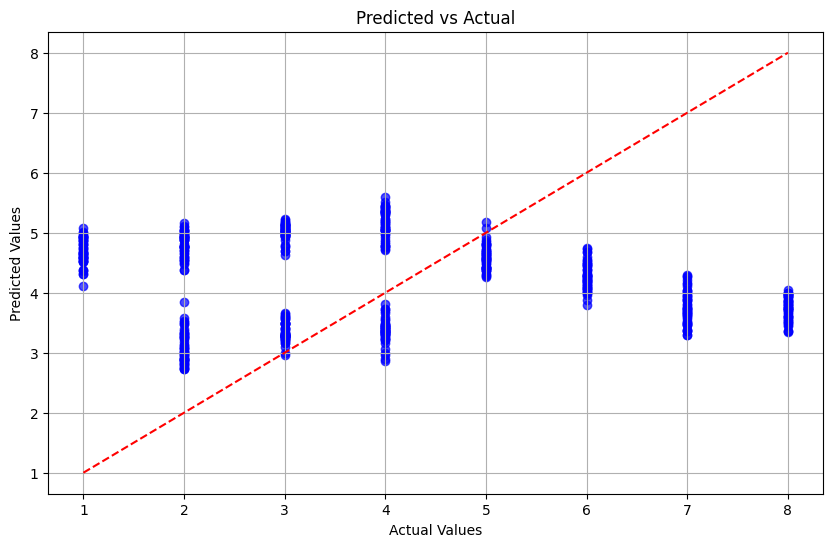

In [ ]:
lasso_model = Lasso(alpha=best_alpha, random_state=42)
lasso_model.fit(X_pbs_train, y_pbs_train)
y_test_pred = lasso_model.predict(X_pbs_test)

mse_test = mean_squared_error(y_pbs_test, y_test_pred)
mae_test = mean_absolute_error(y_pbs_test, y_test_pred)
r2_test = r2_score(y_pbs_test, y_test_pred)

print(f"Test Set Evaluation:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R^2 Score: {r2_test:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_pbs_test, y_test_pred, alpha=0.7, color='blue')
plt.plot([y_pbs_test.min(), y_pbs_test.max()], [y_pbs_test.min(), y_pbs_test.max()], 'r--')
plt.title('Predicted vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid()
plt.show()


## GAM with best predictors

In [ ]:
#Taken from above
non_zero_features = np.array([69, 71, 72, 73, 349,492,503,511])

print(non_zero_features)


[ 69  71  72  73 349 492 503 511]


In [ ]:
non_zero_features

array([ 69,  71,  72,  73, 349, 492, 503, 511])

In [ ]:
X_train_gam = X_pbs_train.iloc[:, non_zero_features]
X_test_gam = X_pbs_test.iloc[:, non_zero_features]

# Fit a GAM model, using s() for each selected feature
gam = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7))
gam.fit(X_train_gam, y_pbs_train)

y_pred_gam = gam.predict(X_test_gam)

mse_gam = mean_squared_error(y_pbs_test, y_pred_gam)
mae_gam = mean_absolute_error(y_pbs_test, y_pred_gam)
r2_gam = r2_score(y_pbs_test, y_pred_gam)

# Print results
print(f'MSE of GAM model: {mse_gam:.4f}')
print(f'MAE of GAM model: {mae_gam:.4f}')
print(f'R² of GAM model: {r2_gam:.4f}')


MSE of GAM model: 7.2304
MAE of GAM model: 2.4941
R² of GAM model: -0.6331


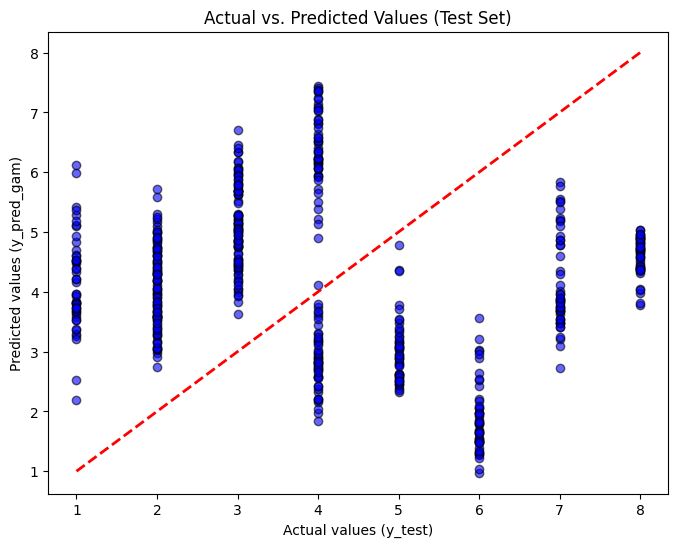

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_pbs_test, y_pred_gam, alpha=0.6, color="b", edgecolor='k')
plt.plot([y_pbs_test.min(), y_pbs_test.max()], [y_pbs_test.min(), y_pbs_test.max()], 'r--', lw=2)
plt.xlabel("Actual values (y_test)")
plt.ylabel("Predicted values (y_pred_gam)")
plt.title("Actual vs. Predicted Values (Test Set)")
plt.show()


## RFE Random Forest

In [ ]:
df_train = pd.DataFrame(X_pbs_train)
df_train

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,0.776890,0.778472,0.780153,0.782643,0.783682,0.791132,0.798997,0.804266,0.804020,0.800389,...,0.453611,0.505623,0.515211,0.503860,0.532883,0.548725,0.546357,0.539588,0.546775,0.546753
1,0.750863,0.752308,0.754210,0.756859,0.756386,0.763167,0.772617,0.778975,0.779275,0.776022,...,0.412047,0.460688,0.473013,0.456202,0.481598,0.494839,0.491829,0.482428,0.485235,0.484757
2,0.733249,0.734549,0.736642,0.739342,0.737585,0.743781,0.754340,0.761453,0.762180,0.759201,...,0.382929,0.427568,0.442086,0.421572,0.444513,0.455728,0.451911,0.440418,0.439424,0.438543
3,0.724049,0.725196,0.727447,0.730094,0.727279,0.732974,0.744164,0.751700,0.752736,0.749928,...,0.366259,0.406263,0.422428,0.399972,0.421627,0.431393,0.426601,0.413557,0.409341,0.408111
4,0.723262,0.724247,0.726626,0.729113,0.725467,0.730747,0.742091,0.749716,0.750941,0.748202,...,0.362037,0.396774,0.414040,0.391401,0.412941,0.421833,0.415900,0.401847,0.394988,0.393462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,0.314304,0.316008,0.315729,0.310691,0.308526,0.311822,0.316002,0.320699,0.326334,0.329589,...,0.392232,0.369194,0.373362,0.383406,0.390563,0.378134,0.390992,0.415615,0.410625,0.389229
1272,0.319173,0.319640,0.318688,0.313556,0.310760,0.312590,0.315760,0.320237,0.325069,0.327446,...,0.400917,0.370642,0.373195,0.383325,0.396786,0.389388,0.404906,0.427248,0.423127,0.403838
1273,0.323190,0.323374,0.322006,0.316919,0.313425,0.313333,0.315431,0.318715,0.324009,0.325581,...,0.420492,0.390935,0.398645,0.406848,0.427225,0.426274,0.441483,0.454014,0.447150,0.432967
1274,0.352007,0.352921,0.353550,0.349298,0.344386,0.349613,0.357302,0.358902,0.360909,0.360257,...,0.572941,0.575283,0.585440,0.584361,0.573834,0.583102,0.593663,0.587359,0.582985,0.546497


In [ ]:
X_train_pls.shape

(1276, 4)

In [ ]:
y_pbs_train

,Load
0,1
1,1
2,1
3,1
4,1
...,...
1271,8
1272,8
1273,8
1274,1


## RFE Random Forest

Number of components needed to explain 99% of the variance: 2


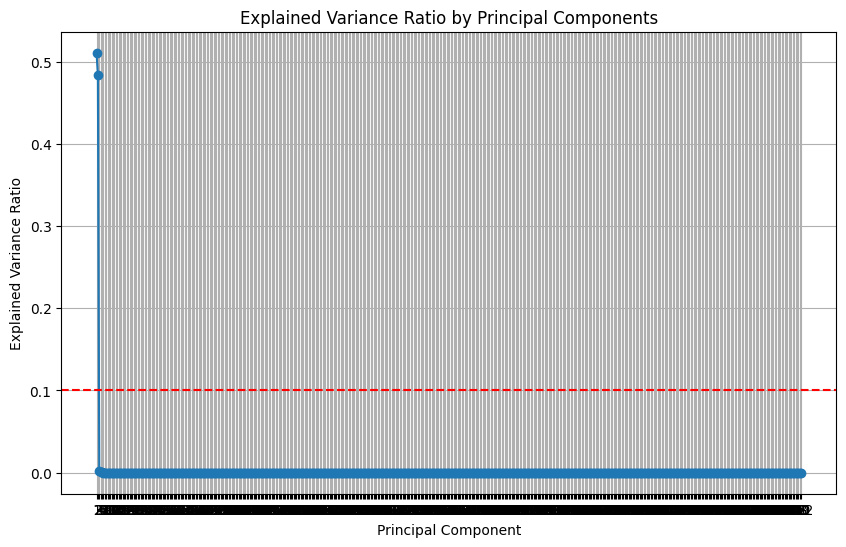

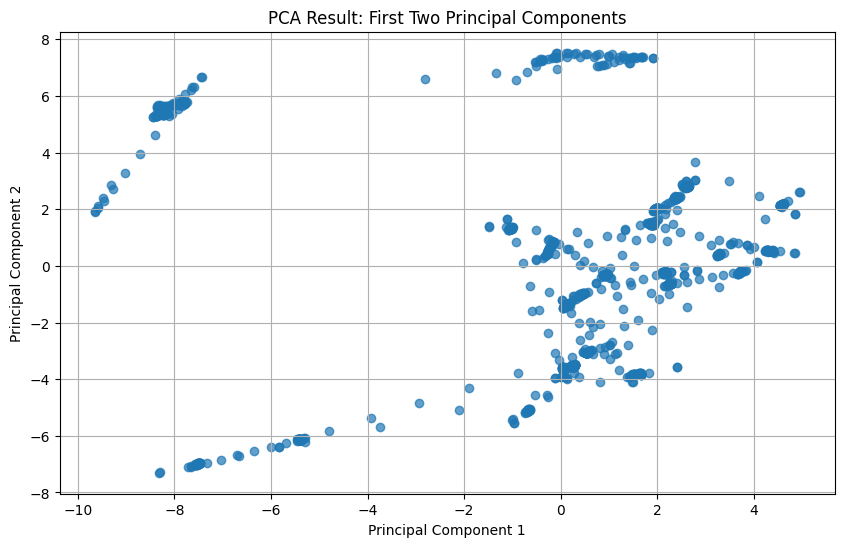

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_pbs_train)

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

n_components_99 = np.argmax(cumulative_explained_variance >= 0.99) + 1
print(f"Number of components needed to explain 99% of the variance: {n_components_99}")

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio by Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.grid()
plt.axhline(y=0.1, color='r', linestyle='--')
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)
plt.title('PCA Result: First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()


In [ ]:
n_components = 2
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_pbs_train)
X_test_pca = pca.fit_transform(X_pbs_test)

In [ ]:
df_train_pca = pd.DataFrame(X_pca)
df_train_pca
df_test_pca = pd.DataFrame(X_test_pca)
df_test_pca

,0,1
0,-1.852398,0.673709
1,-1.985740,0.493857
2,-2.072129,0.400309
3,-2.060840,0.398439
4,-1.976398,0.521880
...,...,...
543,2.335552,-1.210212
544,1.999628,-1.304084
545,1.394804,-1.465878
546,0.612340,-1.675918


In [ ]:
model = RandomForestRegressor()
rfecv = RFECV(estimator=model, step=1, cv=5, scoring='r2') #I use RFE cross valdiation focuing on best fit to avoid overfitting
rfecv.fit(X_pca, y_pbs_train)




RFECV(cv=5, estimator=RandomForestRegressor(), scoring='r2')

In [ ]:
selected_features = df_train_pca.columns[rfecv.support_]
print("Selected features:", selected_features)

print("Cross-validation scores for each step:")
mean_test_scores = -rfecv.cv_results_['mean_test_score']
std_test_scores = rfecv.cv_results_['std_test_score']
print(mean_test_scores)
print(std_test_scores)

mean_mse = np.mean(mean_test_scores)
avg_std = np.mean(std_test_scores)
print(f"\nMean MSE across folds: {mean_mse:.4f}")
print(f"Average Std Dev of MSE across folds: {avg_std:.4f}")

Selected features: Index([0, 1], dtype='int64')
Cross-validation scores for each step:
[2.59372718 1.90555246]
[1.40886551 1.48436285]

Mean MSE across folds: 2.2496
Average Std Dev of MSE across folds: 1.4466


# XGboost

In [ ]:
model = XGBRegressor(random_state=42)

In [ ]:
selected_X_train = df_train_pca.iloc[:, rfecv.support_]

outer_cv_results = cross_validate(
    model,
    selected_X_train,
    y_dmem_train,
    cv=5,
    scoring='neg_mean_squared_error',
    return_train_score=True
)

# O convert scores from negative to positive MSE for readability
outer_train_mse_scores = -outer_cv_results['train_score']
outer_val_mse_scores = -outer_cv_results['test_score']

print("Training MSE scores for each outer fold:")
print(outer_train_mse_scores)
print("\nValidation MSE scores for each outer fold:")
print(outer_val_mse_scores)

mean_outer_train_mse = np.mean(outer_train_mse_scores)
std_outer_train_mse = np.std(outer_train_mse_scores)
mean_outer_val_mse = np.mean(outer_val_mse_scores)
std_outer_val_mse = np.std(outer_val_mse_scores)

print(f"\nMean Outer Training MSE: {mean_outer_train_mse:.4f}")
print(f"Standard Deviation of Outer Training MSE: {std_outer_train_mse:.4f}")
print(f"\nMean Outer Validation MSE: {mean_outer_val_mse:.4f}")
print(f"Standard Deviation of Outer Validation MSE: {std_outer_val_mse:.4f}")

Training MSE scores for each outer fold:
[0.00074968 0.02917299 0.00544803 0.02261559 0.00705724]

Validation MSE scores for each outer fold:
[ 9.42836046  1.58497607 10.44602291  1.60016945 14.6564758 ]

Mean Outer Training MSE: 0.0130
Standard Deviation of Outer Training MSE: 0.0109

Mean Outer Validation MSE: 7.5432
Standard Deviation of Outer Validation MSE: 5.1652


XGBoost with Kernal PCA

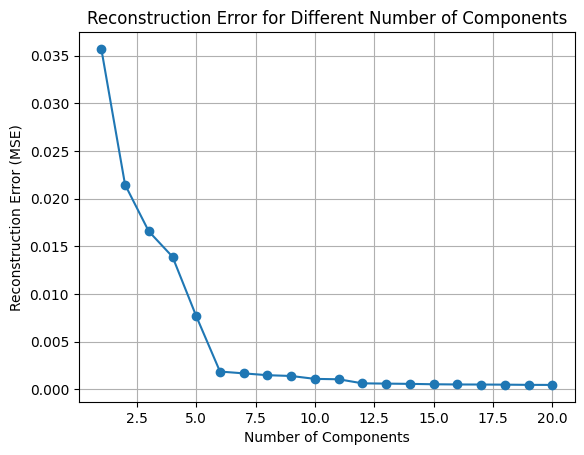

In [ ]:
# Using Kernal PCA - found out that cannot use explained variance so this is the method instead - looks at reconstrcution error
def kernel_pca_reconstruction_error(data, max_components, kernel='rbf', gamma=None):
    errors = []
    for n in range(1, max_components + 1):
        kpca = KernelPCA(n_components=n, kernel=kernel, gamma=gamma, fit_inverse_transform=True)
        transformed_data = kpca.fit_transform(data)
        reconstructed_data = kpca.inverse_transform(transformed_data)

        # Compute the reconstruction error (Mean Squared Error)
        error = mean_squared_error(data, reconstructed_data)
        errors.append(error)

    return errors

errors = kernel_pca_reconstruction_error(X_dmem_train, max_components=20, kernel='rbf', gamma=0.1)

plt.plot(range(1, 21), errors, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error (MSE)')
plt.title('Reconstruction Error for Different Number of Components')
plt.grid(True)
plt.show()


In [ ]:
X_train

In [ ]:
y_train

In [ ]:
def perform_kernel_pca(train_data, test_data, num_components=8, kernel='rbf', gamma=0.1):
    kpca = KernelPCA(n_components=num_components, kernel=kernel, gamma=gamma, fit_inverse_transform=True)
    train_data_kpca = kpca.fit_transform(train_data)
    test_data_kpca = kpca.transform(test_data)
    return train_data_kpca, test_data_kpca

# Kernel PCA to the training and test data with 6 components
kpca_data_8_train, kpca_data_8_test = perform_kernel_pca(X_dmem_train, X_dmem_test, num_components=6, kernel='rbf', gamma=0.1)
xgb_reg = XGBRegressor(objective='reg:squarederror', random_state=0)

xgb_reg.fit(kpca_data_8_train, y_dmem_train)

y_pred = xgb_reg.predict(kpca_data_8_test)

mse = mean_squared_error(y_dmem_test, y_pred)
mae = mean_absolute_error(y_dmem_test, y_pred)
r2 = r2_score(y_dmem_test, y_pred)

print(f"Mean Squared Error: {mse:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")
print(f"R^2 Score: {r2:.4f}")


Mean Squared Error: 9.4562
Mean Absolute Error: 2.5953
R^2 Score: -1.1358


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best Hyperparameters: {'kpca__n_components': 5, 'xgb__learning_rate': 0.1, 'xgb__max_depth': 3}
Mean Squared Error: 8.3097
Mean Absolute Error: 2.5658
R^2 Score: -0.8768


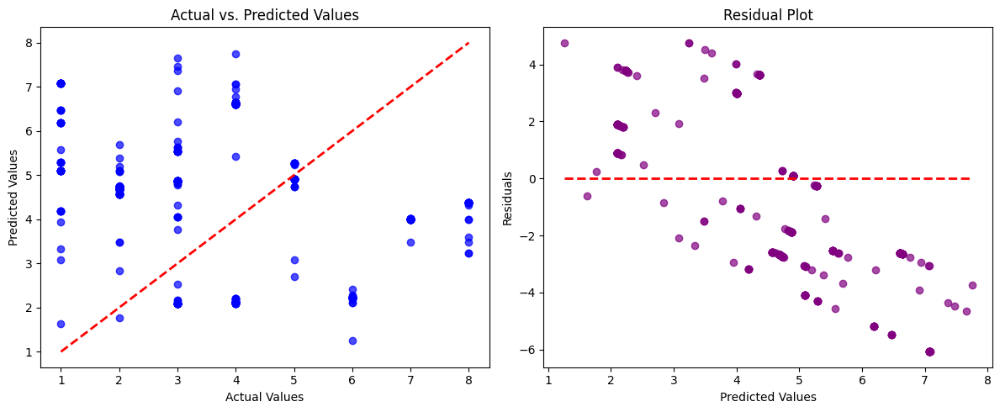

In [ ]:
def create_pipeline(num_components=8, kernel='rbf', gamma=0.1):
    return Pipeline([
        ('kpca', KernelPCA(n_components=num_components, kernel=kernel, gamma=gamma)),
        ('xgb', XGBRegressor(objective='reg:squarederror', random_state=0))
    ])

param_grid = {
    'kpca__n_components': [5, 8, 10],
    'xgb__learning_rate': [0.01, 0.1, 0.2],
    'xgb__max_depth': [3, 5, 7],
}


pipeline = create_pipeline()
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_dmem_train, y_dmem_train)
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_dmem_test)
mse = mean_squared_error(y_dmem_test, y_pred)
mae = mean_absolute_error(y_dmem_test, y_pred)
r2 = r2_score(y_dmem_test, y_pred)

print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Mean Squared Error: {mse:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")
print(f"R^2 Score: {r2:.4f}")

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_dmem_test, y_pred, alpha=0.7, color='blue')
plt.plot([y_dmem_test.min(), y_dmem_test.max()], [y_dmem_test.min(), y_dmem_test.max()], 'r--', lw=2)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")

residuals = y_dmem_test - y_pred

plt.subplot(1, 2, 2)
plt.scatter(y_pred, residuals, alpha=0.7, color='purple')
plt.hlines(y=0, xmin=y_pred.min(), xmax=y_pred.max(), colors='red', linestyles='--', lw=2)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")

plt.tight_layout()
plt.show()


# Clustering

In this notebook I aim to explore if there is a natural seperation within the data and if this reflects the viral load.

## Preprocessing

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
file_path = '/content/drive/MyDrive/Queens/Module2/2022QUB.xlsx' #Load in my data
df = pd.read_excel(file_path, sheet_name='Data')

In [ ]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import mean_squared_error
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score

In [ ]:
df

,SID,Type,Matrix,Load,I001,I002,I003,I004,I005,I006,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,S1,X,dmem,1,97.78,97.73,97.68,97.70,97.73,97.73,...,83.38,84.49,84.94,85.47,86.16,86.79,87.12,87.20,87.58,88.20
1,S1,X,dmem,1,97.75,97.70,97.70,97.71,97.71,97.72,...,83.65,84.77,85.34,85.27,85.69,85.52,85.27,85.28,85.41,85.65
2,S1,X,dmem,1,97.76,97.72,97.70,97.74,97.71,97.71,...,84.46,85.38,86.03,86.38,86.77,87.10,87.14,86.89,87.14,87.79
3,S1,X,dmem,1,97.72,97.71,97.71,97.73,97.70,97.71,...,83.96,84.89,85.43,85.30,85.80,86.18,86.39,86.63,87.21,87.76
4,S1,X,dmem,1,97.74,97.66,97.65,97.68,97.67,97.65,...,83.65,84.02,84.33,84.53,85.14,85.40,85.41,85.42,85.88,85.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,S4,Y,pbs,8,93.44,93.46,93.47,93.40,93.37,93.39,...,85.80,86.40,87.05,87.59,87.83,88.15,88.67,88.93,89.01,89.61
3797,S4,Y,pbs,8,93.68,93.58,93.55,93.47,93.40,93.41,...,85.30,85.65,85.60,85.74,86.54,87.18,87.63,87.65,87.72,88.06
3798,S4,Y,pbs,8,93.66,93.65,93.64,93.57,93.51,93.48,...,86.19,86.55,86.56,86.90,87.32,87.34,87.34,87.63,88.10,88.82
3799,S4,Y,pbs,8,93.20,93.19,93.27,93.25,93.23,93.20,...,85.55,86.02,86.48,86.85,86.90,87.07,87.31,87.51,88.15,89.05


In [ ]:
df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x) #Here I am stripping leading and training whitespaces
print("\nCleaned DataFrame:")

<ipython-input-427-1f67262a0080>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df= df.applymap(lambda x: x.strip() if isinstance(x, str) else x)



Cleaned DataFrame:


In [ ]:
df = df.drop(['SID',"Type"], axis=1) # I am dropping irrelevant columns as they dont contribute to my model

print("\nDataFrame after dropping 'SID' and 'Type':")
print(df)


DataFrame after dropping 'SID':
     Matrix  Load   I001   I002   I003   I004   I005   I006   I007   I008  \
0      dmem     1  97.78  97.73  97.68  97.70  97.73  97.73  97.72  97.71   
1      dmem     1  97.75  97.70  97.70  97.71  97.71  97.72  97.74  97.77   
2      dmem     1  97.76  97.72  97.70  97.74  97.71  97.71  97.74  97.72   
3      dmem     1  97.72  97.71  97.71  97.73  97.70  97.71  97.70  97.71   
4      dmem     1  97.74  97.66  97.65  97.68  97.67  97.65  97.69  97.72   
...     ...   ...    ...    ...    ...    ...    ...    ...    ...    ...   
3796    pbs     8  93.44  93.46  93.47  93.40  93.37  93.39  93.41  93.47   
3797    pbs     8  93.68  93.58  93.55  93.47  93.40  93.41  93.37  93.29   
3798    pbs     8  93.66  93.65  93.64  93.57  93.51  93.48  93.45  93.43   
3799    pbs     8  93.20  93.19  93.27  93.25  93.23  93.20  93.20  93.23   
3800    pbs     8  93.44  93.34  93.30  93.28  93.26  93.26  93.22  93.21   

      ...   I503   I504   I505   I506   I5

## Data Preparation

In this section I am removing outliers and normalising my data and apply the smoothing techniques mentioned in my report.

In [ ]:
z = np.abs(stats.zscore(df._get_numeric_data())) #Converting data to its z-score so that it can be used to detect outliers
print(z)

          Load      I001      I002      I003      I004      I005      I006  \
0     1.458609  1.212414  1.193464  1.175893  1.184677  1.200278  1.205354   
1     1.458609  1.200773  1.181856  1.183631  1.188536  1.192565  1.201491   
2     1.458609  1.204653  1.189595  1.183631  1.200112  1.192565  1.197628   
3     1.458609  1.189131  1.185726  1.187500  1.196253  1.188709  1.197628   
4     1.458609  1.196892  1.166378  1.164285  1.176959  1.177139  1.174450   
...        ...       ...       ...       ...       ...       ...       ...   
3796  1.927589  0.471721  0.458784  0.452991  0.474630  0.481198  0.471225   
3797  1.927589  0.378589  0.412351  0.422038  0.447618  0.469628  0.463499   
3798  1.927589  0.386350  0.385265  0.387217  0.409029  0.427206  0.436458   
3799  1.927589  0.564852  0.563259  0.530373  0.532512  0.535190  0.544624   
3800  1.927589  0.471721  0.505217  0.518765  0.520936  0.523621  0.521446   

          I007      I008      I009  ...      I503      I504    

In [ ]:
  df= df[(z < 3).all(axis=1)] #Here I am removing any rows outside the threshold of 3 std of the mean
  print(df.shape)
  df.reset_index(drop=True, inplace=True)

(3735, 514)


       I001      I002      I003      I004      I005      I006      I007  \
0  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307  1.385305   
1  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885  1.262517   
2  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782  1.177441   
3  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997  1.130078   
4  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531  1.120427   

       I008      I009      I010  ...      I503      I504      I505      I506  \
0  1.398189  1.397284  1.392237  ... -0.778276 -0.419804 -0.341288 -0.382181   
1  1.280494  1.281227  1.277316  ... -1.012109 -0.676742 -0.582163 -0.648616   
2  1.198953  1.201050  1.197989  ... -1.175917 -0.866121 -0.758706 -0.842211   
3  1.153566  1.156754  1.154255  ... -1.269700 -0.987940 -0.870917 -0.962967   
4  1.144335  1.148338  1.146114  ... -1.293456 -1.042199 -0.918796 -1.010885   

       I507      I508      I509      I510      I511      I512  
0 -0

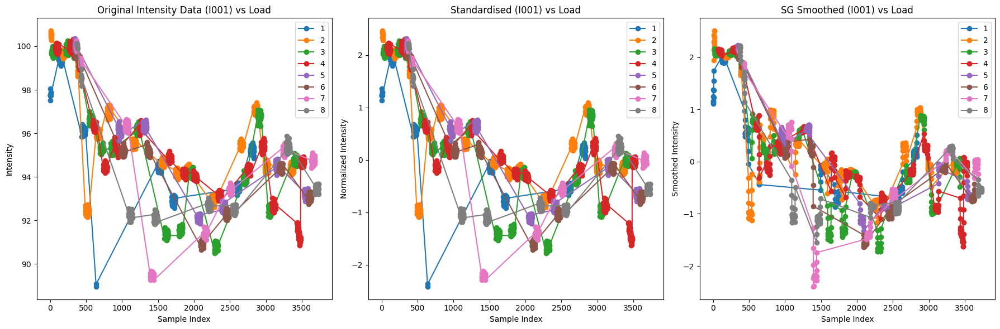

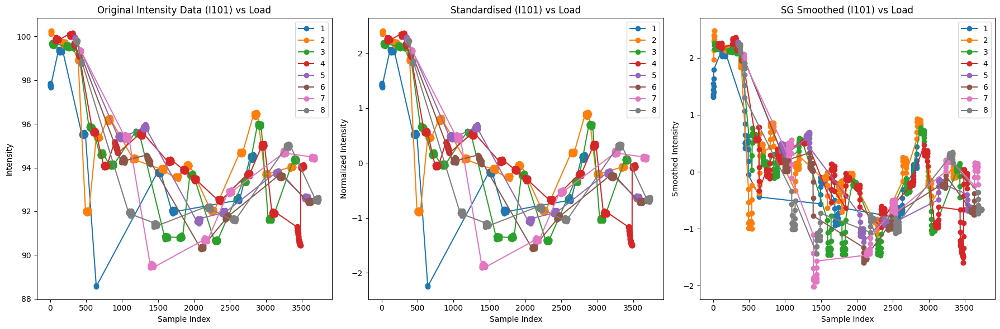

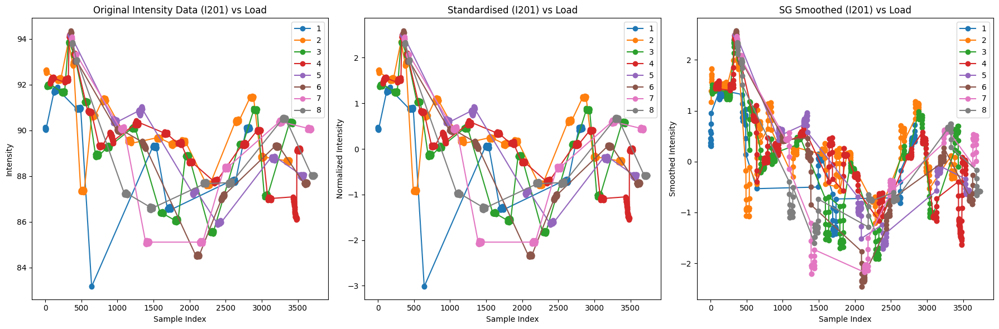

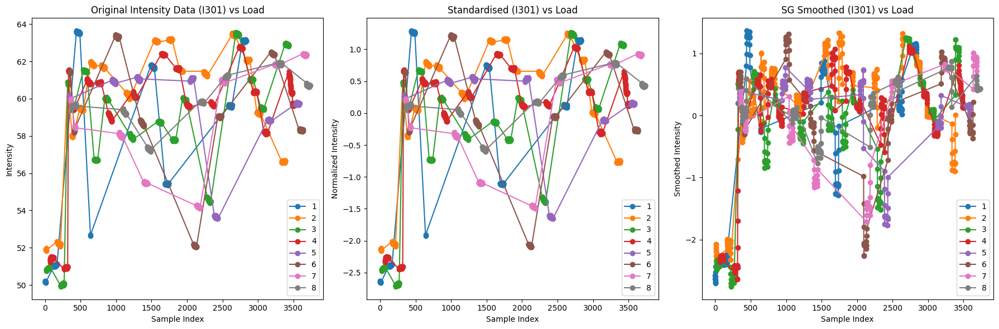

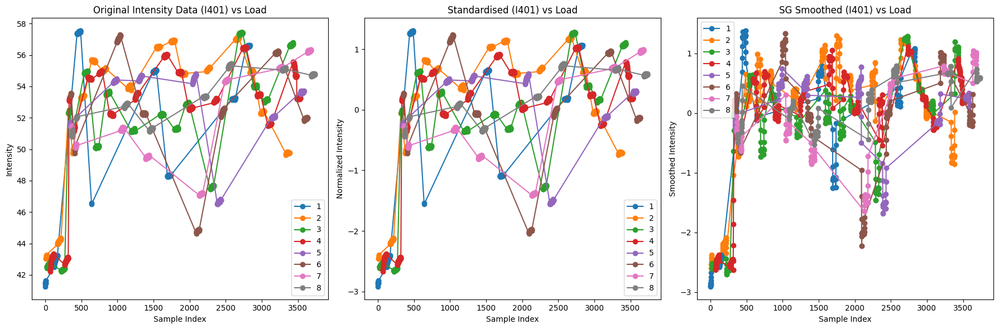

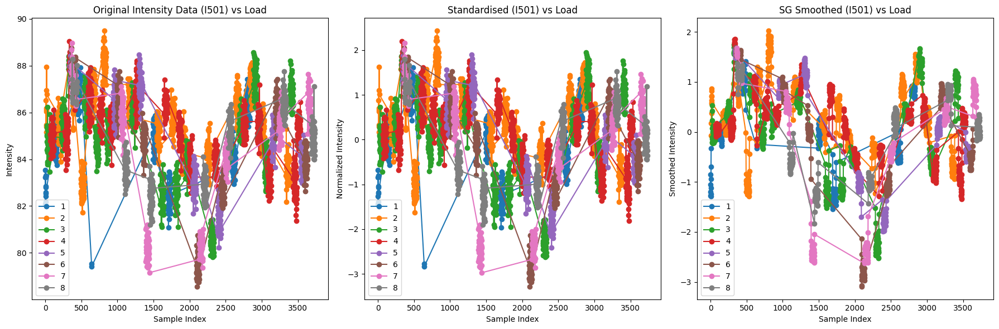

In [ ]:
intensity_columns = df.columns[2:]  # I am removing the wavelength columsn

scaler = StandardScaler() # I am normalising the data
normalised_data = scaler.fit_transform(df[intensity_columns])
normalised_df = pd.DataFrame(normalised_data, columns=intensity_columns)

window_length = 13  # Here I define a window length and polynomial order for Savitzky-Golay smoothing which must be odd and greater than the polynomial order
poly_order = 2

# I apply Savitzky-Golay filter to each column - I chose window length 13 and poly order 2 after a trial and error process
smoothed_data = {
    col: savgol_filter(normalised_df[col], window_length, poly_order)
    for col in normalised_df.columns
}

smoothed_df = pd.DataFrame(smoothed_data, columns=intensity_columns)
print(smoothed_df.head())

# Here I am defining a function to plot original, normalised, and smoothed data and compare their distributions to see the effect of the preprocessing on the data
def plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_column):
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.title(f'Original Intensity Data ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(df[df['Load'] == sample_type].index, df[df['Load'] == sample_type][intensity_column],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Intensity')

    plt.subplot(1, 3, 2)
    plt.title(f'Standardised ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(normalised_df.index[df['Load'] == sample_type],
                 normalised_df[intensity_column][df['Load'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Normalised Intensity')

    plt.subplot(1, 3, 3)
    plt.title(f'SG Smoothed ({intensity_column}) vs Load')
    for sample_type in df['Load'].unique():
        plt.plot(smoothed_df.index[df['Load'] == sample_type],
                 smoothed_df[intensity_column][df['Load'] == sample_type],
                 label=sample_type, marker='o', linestyle='-')
    plt.legend()
    plt.xlabel('Sample Index')
    plt.ylabel('Smoothed Intensity')

    plt.tight_layout()
    plt.show()

for intensity_col in ['I001', 'I101', 'I201', 'I301', 'I401', 'I501']:
    plot_intensity_vs_type(df, normalised_df, smoothed_df, intensity_col)


In [ ]:
other_columns = df.drop(df.columns[df.columns.str.startswith('I')], axis=1) # Get out the other columsn to add back

In [ ]:
final_df = pd.concat([other_columns,smoothed_df], axis=1) #I combine with standarised data
print(final_df.head())

  Matrix  Load      I001      I002      I003      I004      I005      I006  \
0   dmem     1  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1   dmem     1  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2   dmem     1  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3   dmem     1  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4   dmem     1  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   

       I007      I008  ...      I503      I504      I505      I506      I507  \
0  1.385305  1.398189  ... -0.778276 -0.419804 -0.341288 -0.382181 -0.285831   
1  1.262517  1.280494  ... -1.012109 -0.676742 -0.582163 -0.648616 -0.571306   
2  1.177441  1.198953  ... -1.175917 -0.866121 -0.758706 -0.842211 -0.777739   
3  1.130078  1.153566  ... -1.269700 -0.987940 -0.870917 -0.962967 -0.905131   
4  1.120427  1.144335  ... -1.293456 -1.042199 -0.918796 -1.010885 -0.953481   

       I508      I509      I510      I511      I51

In [ ]:
print(final_df)

     Matrix  Load      I001      I002      I003      I004      I005      I006  \
0      dmem     1  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1      dmem     1  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2      dmem     1  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3      dmem     1  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4      dmem     1  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   
...     ...   ...       ...       ...       ...       ...       ...       ...   
3730    pbs     8 -0.503679 -0.521761 -0.529565 -0.545238 -0.553095 -0.556178   
3731    pbs     8 -0.513993 -0.531942 -0.536937 -0.551677 -0.559837 -0.562346   
3732    pbs     8 -0.530150 -0.547252 -0.548068 -0.561382 -0.570010 -0.571888   
3733    pbs     8 -0.552148 -0.567689 -0.562958 -0.574350 -0.583614 -0.584805   
3734    pbs     8 -0.579988 -0.593255 -0.581606 -0.590584 -0.600648 -0.601096   

          I007      I008  .

In [ ]:
dmem_train = final_df[final_df['Matrix'] == 'dmem'].reset_index(drop=True)  # Split my data based on matrix as otherwise the clustering would make no sense
pbs_train= final_df[final_df['Matrix'] == 'pbs'].reset_index(drop=True)

print("DataFrame for dmem:")
print(dmem_train)
print("\nDataFrame for pbs:")
print(pbs_train)

DataFrame for dmem:
     Matrix  Load      I001      I002      I003      I004      I005      I006  \
0      dmem     1  1.376345  1.357506  1.347616  1.356613  1.368133  1.377307   
1      dmem     1  1.249330  1.231543  1.223811  1.234043  1.238835  1.245885   
2      dmem     1  1.163375  1.146046  1.139968  1.150776  1.149775  1.154782   
3      dmem     1  1.118478  1.101015  1.096089  1.106811  1.100954  1.103997   
4      dmem     1  1.114640  1.096449  1.092173  1.102148  1.092371  1.093531   
...     ...   ...       ...       ...       ...       ...       ...       ...   
1819   dmem     8  0.260271  0.273770  0.302425  0.318230  0.332868  0.333092   
1820   dmem     8  0.230182  0.241550  0.269747  0.287555  0.301760  0.305773   
1821   dmem     8  0.191874  0.204236  0.229689  0.244848  0.253845  0.261560   
1822   dmem     8  0.128269  0.142373  0.165289  0.180613  0.187104  0.198056   
1823   dmem     8  0.051334  0.070205  0.093016  0.108212  0.112290  0.125052   

       

In [ ]:
#Even tho this is a supervised task I still want to withold a unseen dataset that I can use to measure the effectiveness of using mean viral loads to predict
X_dmem = dmem_train.drop(['Load', 'Matrix'], axis=1)
y_dmem = dmem_train['Load']
split_index_dmem = int(0.70 * len(X_dmem))
X_dmem_seen, X_dmem_unseen = X_dmem[:split_index_dmem], X_dmem[split_index_dmem:]
y_dmem_seen, y_dmem_unseen= y_dmem[:split_index_dmem], y_dmem[split_index_dmem:]

X_pbs = pbs_train.drop(['Load', 'Matrix'], axis=1)
y_pbs = pbs_train['Load']
split_index_pbs = int(0.70 * len(X_pbs))
X_pbs_seen, X_pbs_unseen = X_pbs[:split_index_pbs], X_pbs[split_index_pbs:]
y_pbs_seen, y_pbs_unseen = y_pbs[:split_index_pbs], y_pbs[split_index_pbs:]


In [ ]:
X_dmem_seen

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
0,1.376345,1.357506,1.347616,1.356613,1.368133,1.377307,1.385305,1.398189,1.397284,1.392237,...,-0.778276,-0.419804,-0.341288,-0.382181,-0.285831,-0.212668,-0.251097,-0.327535,-0.217426,-0.061175
1,1.249330,1.231543,1.223811,1.234043,1.238835,1.245885,1.262517,1.280494,1.281227,1.277316,...,-1.012109,-0.676742,-0.582163,-0.648616,-0.571306,-0.508545,-0.559313,-0.654233,-0.566885,-0.413547
2,1.163375,1.146046,1.139968,1.150776,1.149775,1.154782,1.177441,1.198953,1.201050,1.197989,...,-1.175917,-0.866121,-0.758706,-0.842211,-0.777739,-0.723293,-0.784953,-0.894343,-0.827026,-0.676216
3,1.118478,1.101015,1.096089,1.106811,1.100954,1.103997,1.130078,1.153566,1.156754,1.154255,...,-1.269700,-0.987940,-0.870917,-0.962967,-0.905131,-0.856912,-0.928016,-1.047865,-0.997849,-0.849182
4,1.114640,1.096449,1.092173,1.102148,1.092371,1.093531,1.120427,1.144335,1.148338,1.146114,...,-1.293456,-1.042199,-0.918796,-1.010885,-0.953481,-0.909401,-0.988503,-1.114798,-1.079355,-0.932445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,-0.881071,-0.868968,-0.868734,-0.886903,-0.882658,-0.875210,-0.862883,-0.852132,-0.843143,-0.828130,...,-1.123585,-1.199901,-1.150999,-1.055579,-1.078045,-1.149344,-1.129293,-1.036104,-0.990560,-0.956500
1272,-0.857313,-0.851483,-0.854610,-0.873283,-0.872077,-0.871600,-0.864011,-0.854280,-0.849075,-0.838233,...,-1.074722,-1.191623,-1.151952,-1.056034,-1.043405,-1.087553,-1.050647,-0.969615,-0.919566,-0.873471
1273,-0.837709,-0.833506,-0.838777,-0.857296,-0.859450,-0.868106,-0.865543,-0.861364,-0.854047,-0.847030,...,-0.964596,-1.075588,-1.006680,-0.924529,-0.873971,-0.885018,-0.843894,-0.816634,-0.783149,-0.707904
1274,-0.697082,-0.691253,-0.688240,-0.703376,-0.712792,-0.697608,-0.670646,-0.674353,-0.680983,-0.683494,...,-0.106948,-0.021487,0.059602,0.067860,-0.057886,-0.023913,0.016299,-0.054497,-0.011808,-0.062629


In [ ]:
X_dmem_unseen

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I503,I504,I505,I506,I507,I508,I509,I510,I511,I512
1276,-0.581838,-0.573549,-0.569888,-0.591673,-0.601509,-0.589660,-0.568630,-0.573822,-0.572644,-0.573870,...,-0.353957,-0.288000,-0.223071,-0.195256,-0.316951,-0.283957,-0.263468,-0.390426,-0.415353,-0.426765
1277,-0.526424,-0.519995,-0.521494,-0.546137,-0.551518,-0.543542,-0.527581,-0.535619,-0.534844,-0.535867,...,-0.357426,-0.292751,-0.229742,-0.232074,-0.394942,-0.383255,-0.381881,-0.523507,-0.591480,-0.605624
1278,-0.504060,-0.493623,-0.496544,-0.521898,-0.526003,-0.519226,-0.507172,-0.516024,-0.509722,-0.507648,...,-0.432971,-0.341410,-0.256566,-0.252532,-0.425225,-0.431414,-0.414241,-0.575695,-0.679459,-0.713077
1279,-0.488087,-0.479959,-0.486529,-0.512837,-0.515308,-0.508425,-0.499454,-0.510450,-0.506320,-0.504861,...,-0.430683,-0.331153,-0.252507,-0.199985,-0.376054,-0.410417,-0.400962,-0.560370,-0.676237,-0.692549
1280,-0.523490,-0.512903,-0.521088,-0.546426,-0.549586,-0.545679,-0.540185,-0.550163,-0.546765,-0.542777,...,-0.369826,-0.295594,-0.242130,-0.175744,-0.328660,-0.384659,-0.383281,-0.535897,-0.636594,-0.663836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1819,0.260271,0.273770,0.302425,0.318230,0.332868,0.333092,0.334480,0.355861,0.349288,0.341879,...,0.739777,0.745082,0.702280,0.681111,0.658079,0.572352,0.511661,0.374715,0.176605,0.199914
1820,0.230182,0.241550,0.269747,0.287555,0.301760,0.305773,0.310284,0.330112,0.324253,0.318015,...,0.666519,0.685301,0.659538,0.633749,0.612044,0.521145,0.479848,0.365670,0.219806,0.302423
1821,0.191874,0.204236,0.229689,0.244848,0.253845,0.261560,0.267414,0.284883,0.274183,0.263929,...,0.573591,0.582907,0.567066,0.523191,0.496451,0.422464,0.407790,0.344304,0.209971,0.277148
1822,0.128269,0.142373,0.165289,0.180613,0.187104,0.198056,0.205435,0.219856,0.211349,0.204385,...,0.333447,0.333598,0.334193,0.317420,0.282271,0.212428,0.227593,0.208389,0.148644,0.235273


## PCA Dimensionality Reduction - Dmem

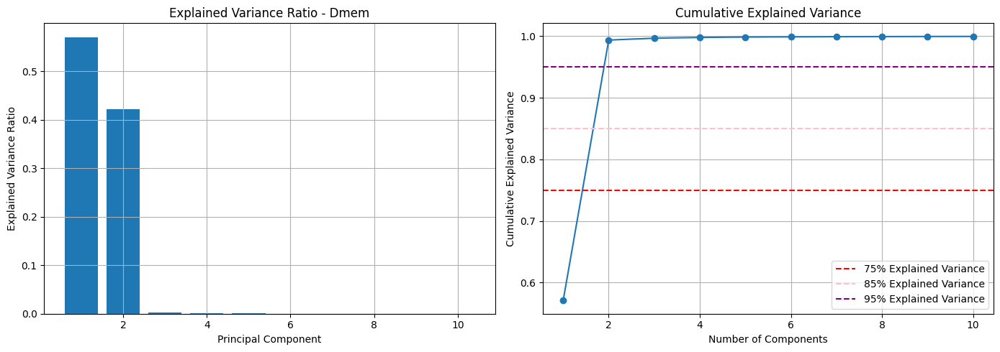

Total Variance Covered by the first 10 components for Matrix:: 0.9995


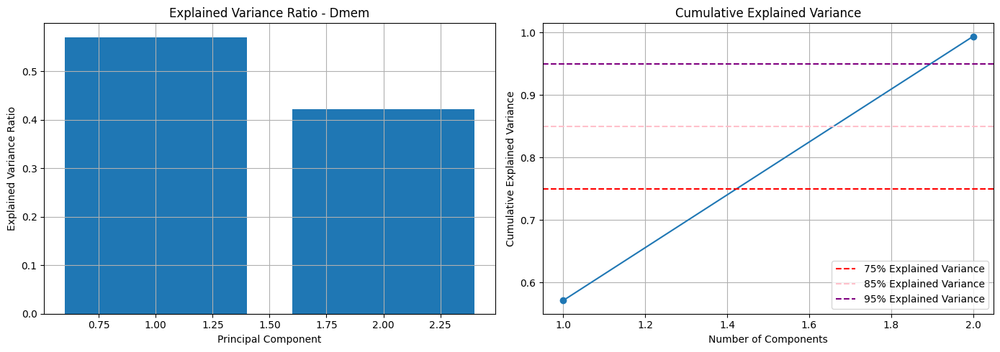

Total Variance Covered by the first 2 components for Matrix:: 0.9936


In [ ]:
# My function to perform PCA
def perform_pca(data, num_components=10):
    pca = PCA(n_components=num_components)
    pca_data = pca.fit_transform(data)
    return pca, pca_data

pca_10, pca_data_10 = perform_pca(X_dmem_seen, num_components=10) #I experiment with 10 componets and then with 2 to examine the total bvaraince covered
pca_2, pca_data_2 = perform_pca(X_dmem_seen, num_components=2)


# Here I am creating a plot for Explained Variance Ratio
def plot_variance_analysis(pca, title):
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Explained Variance Ratio Plot
    axes[0].bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center')
    axes[0].set_xlabel('Principal Component')
    axes[0].set_ylabel('Explained Variance Ratio')
    axes[0].set_title(f'Explained Variance Ratio - Dmem')
    axes[0].grid()

    # Cumulative Explained Variance Plot
    axes[1].plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
    axes[1].axhline(y=0.75, color='red', linestyle='--', label='75% Explained Variance') #Put these lines in as markers to make my graph clearer
    axes[1].axhline(y=0.85, color='pink', linestyle='--', label='85% Explained Variance')
    axes[1].axhline(y=0.95, color='purple', linestyle='--', label='95% Explained Variance')
    axes[1].set_xlabel("Number of Components")
    axes[1].set_ylabel("Cumulative Explained Variance")
    axes[1].set_title("Cumulative Explained Variance")
    axes[1].grid()
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    total_variance_covered = np.sum(explained_variance_ratio) # I calculate total variance covered by the components
    print(f"Total Variance Covered by the first {len(explained_variance_ratio)} components for {title}: {total_variance_covered:.4f}")


plot_variance_analysis(pca_10, 'Matrix:')
plot_variance_analysis(pca_2, 'Matrix:')


Top 10 Features for PC1:
I164    0.060301
I163    0.060271
I165    0.060258
I166    0.060157
I167    0.060136
I168    0.060121
I198    0.060091
I197    0.060080
I192    0.060079
I199    0.060068
Name: 0, dtype: float64

Top 10 Features for PC2:
I413    0.066828
I403    0.066805
I412    0.066800
I414    0.066790
I402    0.066787
I401    0.066782
I411    0.066770
I404    0.066770
I399    0.066764
I400    0.066758
Name: 1, dtype: float64


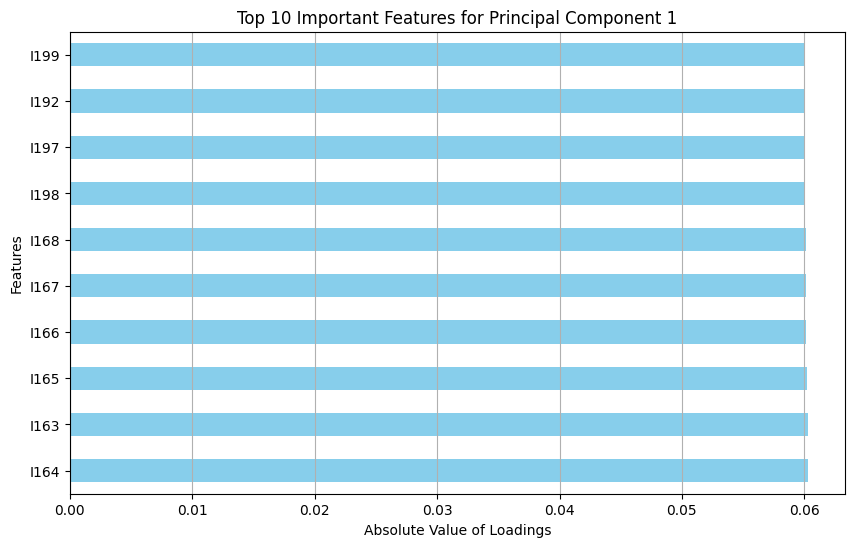

In [ ]:
components = pd.DataFrame(pca_2.components_, columns=X_dmem_seen.columns)
importance = components.abs() # Get the absolute values of the components so that I can extract the laoding values of each components

# Lopp for each principal component so that I can get the top 10 features
top_features = {}
for i in range(2):  # My first 2 components
    top_features[f'PC{i+1}'] = importance.iloc[i].nlargest(10)

# I am putting the top 10 features for each principal component in table format and outpuuting
for pc, features in top_features.items():
    print(f"\nTop 10 Features for {pc}:")
    print(features)

#Plotting the table - am able to see that all fetaures have roughly equal loading - no one feature dominating which may point to noise being captured
plt.figure(figsize=(10, 6))
importance.iloc[0].nlargest(10).plot(kind='barh', color='skyblue')
plt.title('Top 10 Important Features for Principal Component 1')
plt.xlabel('Absolute Value of Loadings')
plt.ylabel('Features')
plt.grid(axis='x')
plt.show()

Parameter: 2, Silhouette Score: 0.5742, Inertia: 442016.5056
Parameter: 3, Silhouette Score: 0.5559, Inertia: 218667.9619
Parameter: 4, Silhouette Score: 0.5296, Inertia: 136634.4306
Parameter: 5, Silhouette Score: 0.5889, Inertia: 76544.0351
Parameter: 6, Silhouette Score: 0.5826, Inertia: 45759.9676
Parameter: 7, Silhouette Score: 0.6126, Inertia: 33267.3398
Parameter: 8, Silhouette Score: 0.6247, Inertia: 26477.8803
Parameter: 9, Silhouette Score: 0.6325, Inertia: 22120.7554
Parameter: 10, Silhouette Score: 0.6482, Inertia: 17743.4913


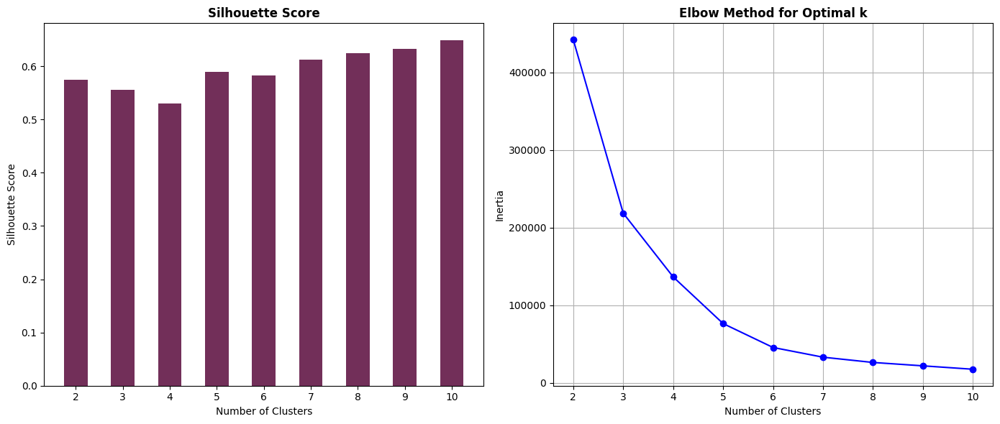

Best Number of Clusters based on Silhouette Score: 10 with a score of 0.6482


In [ ]:
# Possible list for number of clusters to expermient with
parameters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# Instantiate ParameterGrid with the number of clusters as input - found this technique during my research
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1
silhouette_scores = []
inertia_scores = []

# Perform multiple initialisations for stability - this avoids settling at a local minimum which kmeans can be prone to do
for p in parameter_grid:
    # Running KMeans with multiple random (50 runs per configuration). This means that the clusters are starting at random points and avoid it being stuck
    kmeans_model = KMeans(n_clusters=p['n_clusters'], n_init=50, random_state=42)
    kmeans_model.fit(pca_data_2)  # Fit model on my PCA data

    # Calculate silhouette score - which shows how effective clusteres are
    ss = metrics.silhouette_score(pca_data_2, kmeans_model.labels_)
    silhouette_scores.append(ss)  # Store silhouette score

    # Calculate my within sum of squared distances to the closest cluster center aim is to mimise this
    inertia = kmeans_model.inertia_
    inertia_scores.append(inertia)  # Store inertia

    print(f'Parameter: {p["n_clusters"]}, Silhouette Score: {ss:.4f}, Inertia: {inertia:.4f}')

    # Check which parameter has the best silhouette score
    if ss > best_score:
        best_score = ss
        best_grid = p
#My silhouette scores and inertia (Elbow Method)
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.bar(range(len(silhouette_scores)), silhouette_scores, align='center', color='#722f59', width=0.5)
plt.xticks(range(len(silhouette_scores)), parameters)
plt.title('Silhouette Score', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.subplot(1, 2, 2)
plt.plot(parameters, inertia_scores, marker='o', color='b')
plt.title('Elbow Method for Optimal k', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid()

plt.tight_layout()
plt.show()

print(f'Best Number of Clusters based on Silhouette Score: {best_grid["n_clusters"]} with a score of {best_score:.4f}')


In [ ]:
pca_data_2.shape

(1276, 2)

Again I am running a number of models a numeber of times to ensure that the random creation of clusters doesnt result in the model getting stuck at a local minimum

In [ ]:
kmeans1 = KMeans(n_clusters=5,
                random_state=3,
                n_init=1).fit(pca_data_2)
kmeans20 = KMeans(n_clusters=5,
                  random_state=3,
                  n_init=20).fit(pca_data_2);
kmeans50 = KMeans(n_clusters=5,
                  random_state=3,
                  n_init=50).fit(pca_data_2);
kmeans1.inertia_, kmeans20.inertia_, kmeans50.inertia_

(93053.91289607876, 33268.00812236064, 76544.03510177188)

In [ ]:
kmeans20.fit(pca_data_2)

KMeans(n_clusters=7, n_init=20, random_state=3)

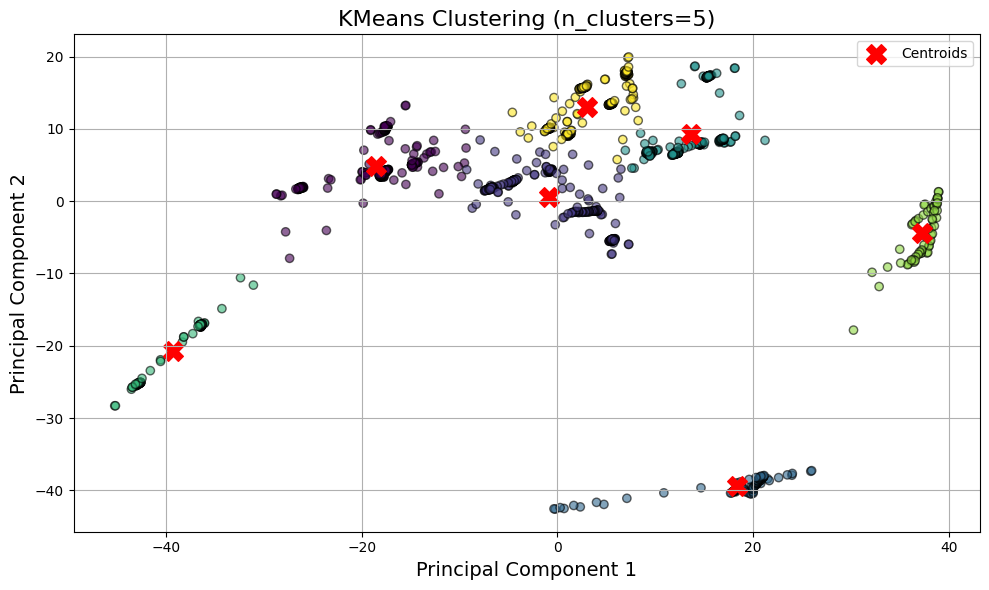

In [ ]:
n_clusters = 5

labels = kmeans20.labels_ #This is just extracting the labels for cluster colouring
centroids = kmeans20.cluster_centers_
plt.figure(figsize=(10, 6))
plt.scatter(pca_data_2[:, 0], pca_data_2[:, 1], c=labels, cmap='viridis', marker='o', alpha=0.6, edgecolor='k')
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')


plt.title(f'KMeans Clustering (n_clusters={n_clusters})', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=14)
plt.ylabel('Principal Component 2', fontsize=14)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
X_dmem_seen = X_dmem_seen.copy()  # Avoids SettingWithCopyWarning by working on a copy - this error kept coming up so I found this solution online
X_dmem_seen['Cluster'] = labels #This is extracting the clusters from the seen data which i will use to predict

# Adding the true viral load data to 'X_dmem_seen'
X_dmem_seen['Load'] = y_dmem_seen.values

# Calculate mean viral load for each cluster
cluster_viral_loads = X_dmem_seen.groupby('Cluster')['Load'].mean() #Here I am calculating the mean of my clsuters to use for prediction
print("Mean viral load for each cluster:\n", cluster_viral_loads)

# I Predict viral load for each data point based on cluster mean
X_dmem_seen['Predicted Viral Load'] = X_dmem_seen['Cluster'].map(cluster_viral_loads)

mse_seen = mean_squared_error(X_dmem_seen['Load'], X_dmem_seen['Predicted Viral Load'])
print(f"Mean Squared Error for the 'seen' dataset: {mse_seen:.4f}")

Mean viral load for each cluster:
 Cluster
0    5.138340
1    4.200000
2    3.166667
3    2.987603
4    6.532609
5    5.442623
6    3.000000
Name: Load, dtype: float64
Mean Squared Error for the 'seen' dataset: 2.9384


In [ ]:
X_dmem_seen

,I001,I002,I003,I004,I005,I006,I007,I008,I009,I010,...,I506,I507,I508,I509,I510,I511,I512,Cluster,Load,Predicted Viral Load
0,1.376345,1.357506,1.347616,1.356613,1.368133,1.377307,1.385305,1.398189,1.397284,1.392237,...,-0.382181,-0.285831,-0.212668,-0.251097,-0.327535,-0.217426,-0.061175,2,1,3.166667
1,1.249330,1.231543,1.223811,1.234043,1.238835,1.245885,1.262517,1.280494,1.281227,1.277316,...,-0.648616,-0.571306,-0.508545,-0.559313,-0.654233,-0.566885,-0.413547,2,1,3.166667
2,1.163375,1.146046,1.139968,1.150776,1.149775,1.154782,1.177441,1.198953,1.201050,1.197989,...,-0.842211,-0.777739,-0.723293,-0.784953,-0.894343,-0.827026,-0.676216,2,1,3.166667
3,1.118478,1.101015,1.096089,1.106811,1.100954,1.103997,1.130078,1.153566,1.156754,1.154255,...,-0.962967,-0.905131,-0.856912,-0.928016,-1.047865,-0.997849,-0.849182,2,1,3.166667
4,1.114640,1.096449,1.092173,1.102148,1.092371,1.093531,1.120427,1.144335,1.148338,1.146114,...,-1.010885,-0.953481,-0.909401,-0.988503,-1.114798,-1.079355,-0.932445,2,1,3.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,-0.881071,-0.868968,-0.868734,-0.886903,-0.882658,-0.875210,-0.862883,-0.852132,-0.843143,-0.828130,...,-1.055579,-1.078045,-1.149344,-1.129293,-1.036104,-0.990560,-0.956500,0,8,5.138340
1272,-0.857313,-0.851483,-0.854610,-0.873283,-0.872077,-0.871600,-0.864011,-0.854280,-0.849075,-0.838233,...,-1.056034,-1.043405,-1.087553,-1.050647,-0.969615,-0.919566,-0.873471,0,8,5.138340
1273,-0.837709,-0.833506,-0.838777,-0.857296,-0.859450,-0.868106,-0.865543,-0.861364,-0.854047,-0.847030,...,-0.924529,-0.873971,-0.885018,-0.843894,-0.816634,-0.783149,-0.707904,0,8,5.138340
1274,-0.697082,-0.691253,-0.688240,-0.703376,-0.712792,-0.697608,-0.670646,-0.674353,-0.680983,-0.683494,...,0.067860,-0.057886,-0.023913,0.016299,-0.054497,-0.011808,-0.062629,0,1,5.138340


## Unseen - Dmem

In [ ]:
pca_data_unseen = pca_2.transform(X_dmem_unseen)
X_dmem_unseen['Cluster'] = kmeans20.predict(pca_data_unseen)

# I am predicting viral load for each data point in unseen data based on cluster mean from seen data
X_dmem_unseen['Predicted Viral Load'] = X_dmem_unseen['Cluster'].map(cluster_viral_loads)
X_dmem_unseen['Load'] = y_dmem_unseen
mse_unseen = mean_squared_error(X_dmem_unseen['Load'], X_dmem_unseen['Predicted Viral Load'])
print("Predicted Viral Loads for the 'unseen' dataset:")
print(X_dmem_unseen[['Cluster', 'Load', 'Predicted Viral Load']])
print(f"Mean Squared Error for the 'unseen' dataset: {mse_unseen:.4f}")


Predicted Viral Loads for the 'unseen' dataset:
      Cluster  Load  Predicted Viral Load
1276        1     1              4.680672
1277        1     1              4.680672
1278        1     1              4.680672
1279        1     1              4.680672
1280        1     1              4.680672
...       ...   ...                   ...
1819        0     8              3.381395
1820        0     8              3.381395
1821        0     8              3.381395
1822        0     8              3.381395
1823        0     8              3.381395

[548 rows x 3 columns]
Mean Squared Error for the 'unseen' dataset: 6.1115


<ipython-input-449-5a303ad691a4>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_unseen['Cluster'] = kmeans20.predict(pca_data_unseen)
<ipython-input-449-5a303ad691a4>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_unseen['Predicted Viral Load'] = X_dmem_unseen['Cluster'].map(cluster_viral_loads)
<ipython-input-449-5a303ad691a4>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

## Spectral Clustering

Results were slighly disappointing so I decided to examien another clustering technique

In [ ]:
#I had to reset this as new columns had been added in the last clustering
X_dmem = dmem_train.drop(['Load', 'Matrix'], axis=1)
y_dmem = dmem_train['Load']

split_index_dmem = int(0.70 * len(X_dmem))
X_dmem_seen, X_dmem_unseen = X_dmem[:split_index_dmem], X_dmem[split_index_dmem:]
y_dmem_seen, y_dmem_unseen= y_dmem[:split_index_dmem], y_dmem[split_index_dmem:]

X_pbs = pbs_train.drop(['Load', 'Matrix'], axis=1)
y_pbs = pbs_train['Load']
split_index_pbs = int(0.70 * len(X_pbs))
X_pbs_seen, X_pbs_unseen = X_pbs[:split_index_pbs], X_pbs[split_index_pbs:]
y_pbs_seen, y_pbs_unseen = y_pbs[:split_index_pbs], y_pbs[split_index_pbs:]


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 2, Silhouette Score: 0.0019


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 3, Silhouette Score: 0.1339


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 4, Silhouette Score: 0.2030


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 5, Silhouette Score: 0.2839


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 6, Silhouette Score: 0.1200


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 7, Silhouette Score: 0.2078


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 8, Silhouette Score: 0.3303


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 9, Silhouette Score: 0.1536


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 10, Silhouette Score: 0.1878


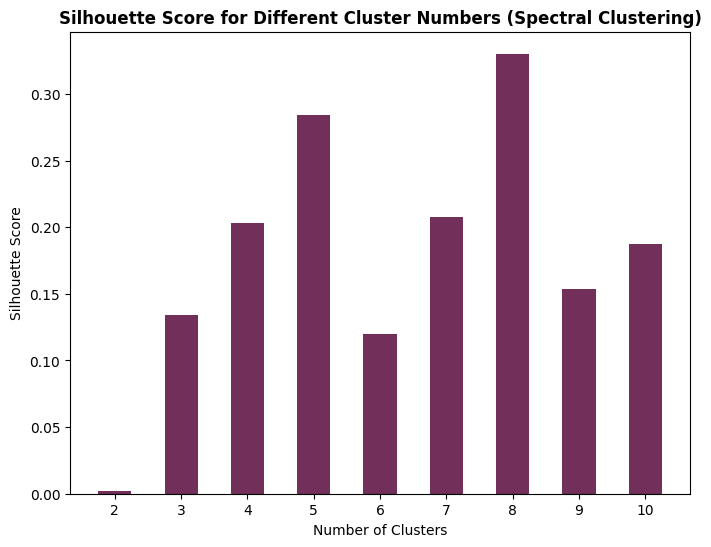

Best Number of Clusters based on Silhouette Score: 8 with a score of 0.3303


In [ ]:
#Same process as above but with the Spectral Model
parameters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1
silhouette_scores = []

for p in parameter_grid:
    spectral_model = SpectralClustering(n_clusters=p['n_clusters'], affinity='nearest_neighbors', n_neighbors=10, random_state=42) #The NN introduces the non-linear aspect which I wanted to examine
    labels = spectral_model.fit_predict(pca_data_2)

    ss = metrics.silhouette_score(pca_data_2, labels)
    silhouette_scores.append(ss)

    print(f'Number of Clusters: {p["n_clusters"]}, Silhouette Score: {ss:.4f}')

    if ss > best_score:
        best_score = ss
        best_grid = p

plt.figure(figsize=(8, 6))

plt.bar(range(len(silhouette_scores)), silhouette_scores, align='center', color='#722f59', width=0.5)
plt.xticks(range(len(silhouette_scores)), parameters)
plt.title('Silhouette Score for Different Cluster Numbers (Spectral Clustering)', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.show()

print(f'Best Number of Clusters based on Silhouette Score: {best_grid["n_clusters"]} with a score of {best_score:.4f}')


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


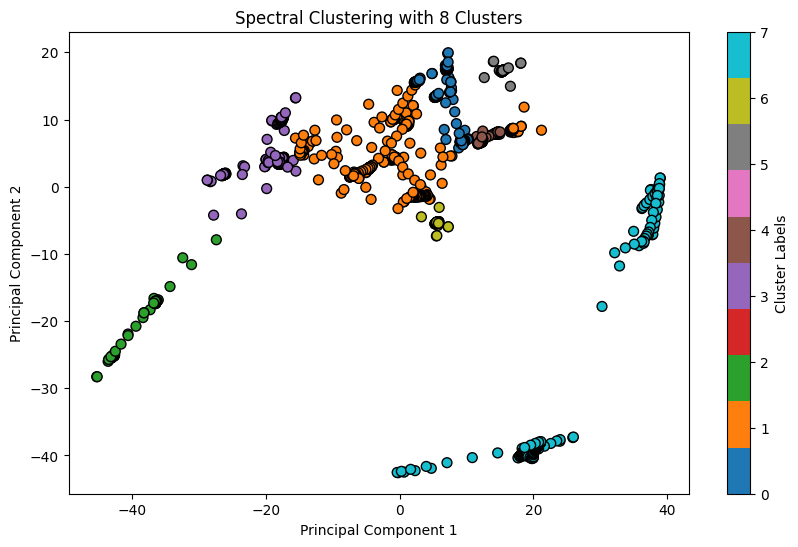

In [ ]:
n_clusters = 8
spectral_model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_neighbors=10, random_state=42)
labels = spectral_model.fit_predict(pca_data_2)

plt.figure(figsize=(10, 6))

scatter = plt.scatter(pca_data_2[:, 0], pca_data_2[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50)
plt.colorbar(scatter, ticks=range(n_clusters), label="Cluster Labels")
plt.title(f"Spectral Clustering with {n_clusters} Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.show()
# Can see that the PCA plotting is the exact same but the clustering is different so interesting to analyse now

In [ ]:
print(f"Shape of pca_data_2: {pca_data_2.shape}")
print(f"Shape of X_dmem_seen: {X_dmem_seen.shape}")

# Ensure they have the same number of rows - I put in some error code here to avoid misanalysis
if pca_data_2.shape[0] != X_dmem_seen.shape[0]:
    print("Warning: Number of rows in pca_data_2 and X_dmem_seen are different.")
else:
    labels = spectral_model.fit_predict(pca_data_2)  # Fit model on my PCA data
    X_dmem_seen['Cluster'] = labels
    X_dmem_seen['Load'] = y_dmem_seen.values
    cluster_viral_loads = X_dmem_seen.groupby('Cluster')['Load'].mean()
    print("Mean viral load for each cluster:\n", cluster_viral_loads)

    X_dmem_seen['Predicted Viral Load'] = X_dmem_seen['Cluster'].map(cluster_viral_loads)
    mse = mean_squared_error(X_dmem_seen['Load'], X_dmem_seen['Predicted Viral Load'])
    print(f"Mean Squared Error of Spectral Clustering-Based Prediction: {mse:.4f}")


Shape of pca_data_2: (1276, 2)
Shape of X_dmem_seen: (1276, 512)


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Mean viral load for each cluster:
 Cluster
0    4.335135
1    3.384615
2    6.537634
3    4.571429
4    3.425532
5    1.000000
6    7.000000
7    3.933702
Name: Load, dtype: float64
Mean Squared Error of Spectral Clustering-Based Prediction: 2.8804


<ipython-input-454-4dbf173e1591>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_seen['Cluster'] = labels
<ipython-input-454-4dbf173e1591>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_seen['Load'] = y_dmem_seen.values
<ipython-input-454-4dbf173e1591>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

In [ ]:
#Predicting the Unseen data using the mean from the seen
pca_data_unseen = pca_2.transform(X_dmem_unseen)
X_dmem_unseen['Cluster'] = spectral_model.fit_predict(pca_data_unseen)
X_dmem_unseen['Predicted Viral Load'] = X_dmem_unseen['Cluster'].map(cluster_viral_loads)

X_dmem_unseen['Load'] = y_dmem_unseen
mse_unseen = mean_squared_error(X_dmem_unseen['Load'], X_dmem_unseen['Predicted Viral Load'])
r2_unseen = metrics.r2_score(X_dmem_unseen['Load'], X_dmem_unseen['Predicted Viral Load'])

print("Predicted Viral Loads for the 'unseen' dataset:")
print(X_dmem_unseen[['Cluster', 'Load', 'Predicted Viral Load']])
print(f"Mean Squared Error for the 'unseen' dataset: {mse_unseen:.4f}")



Predicted Viral Loads for the 'unseen' dataset:
      Cluster  Load  Predicted Viral Load
1276        1     1              3.384615
1277        1     1              3.384615
1278        1     1              3.384615
1279        1     1              3.384615
1280        1     1              3.384615
...       ...   ...                   ...
1819        0     8              4.335135
1820        0     8              4.335135
1821        4     8              3.425532
1822        4     8              3.425532
1823        1     8              3.384615

[548 rows x 3 columns]
Mean Squared Error for the 'unseen' dataset: 6.8538


<ipython-input-455-7c6ea2d15b77>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_unseen['Cluster'] = spectral_model.fit_predict(pca_data_unseen)
<ipython-input-455-7c6ea2d15b77>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_dmem_unseen['Predicted Viral Load'] = X_dmem_unseen['Cluster'].map(cluster_viral_loads)
<ipython-input-455-7c6ea2d15b77>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

## PCA Dimensionality Reduction - pbs

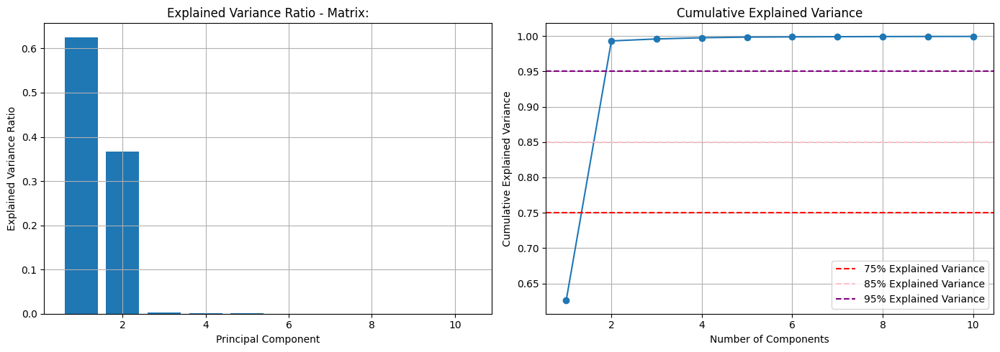

Total Variance Covered by the first 10 components for Matrix:: 0.9996


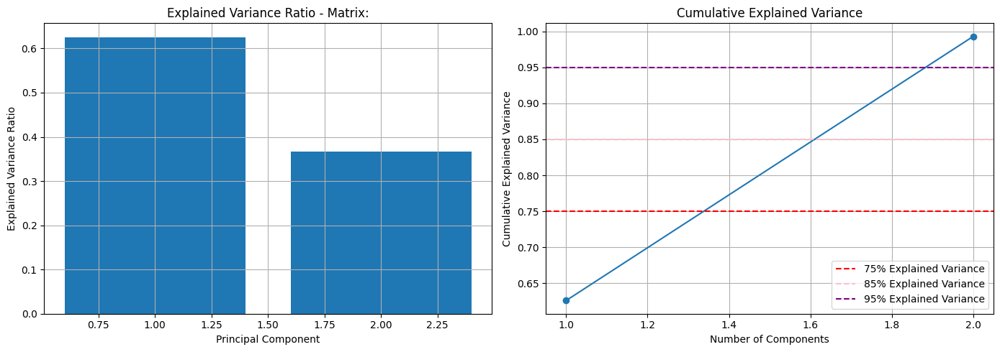

Total Variance Covered by the first 2 components for Matrix:: 0.9932


In [ ]:
def perform_pca(data, num_components=10):

    pca = PCA(n_components=num_components)
    pca_data = pca.fit_transform(data)

    return pca, pca_data

pca_10, pca_data_10 = perform_pca(X_pbs_seen, num_components=10)
pca_2, pca_data_2 = perform_pca(X_pbs_seen, num_components=2)

def plot_variance_analysis(pca, title):
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center')
    axes[0].set_xlabel('Principal Component')
    axes[0].set_ylabel('Explained Variance Ratio')
    axes[0].set_title(f'Explained Variance Ratio - {title}')
    axes[0].grid()

    axes[1].plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
    axes[1].axhline(y=0.75, color='red', linestyle='--', label='75% Explained Variance')
    axes[1].axhline(y=0.85, color='pink', linestyle='--', label='85% Explained Variance')
    axes[1].axhline(y=0.95, color='purple', linestyle='--', label='95% Explained Variance')
    axes[1].set_xlabel("Number of Components")
    axes[1].set_ylabel("Cumulative Explained Variance")
    axes[1].set_title("Cumulative Explained Variance")
    axes[1].grid()
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    total_variance_covered = np.sum(explained_variance_ratio)
    print(f"Total Variance Covered by the first {len(explained_variance_ratio)} components for {title}: {total_variance_covered:.4f}")

plot_variance_analysis(pca_10, 'Matrix:')
plot_variance_analysis(pca_2, 'Matrix:')


Top 10 Features for PC1:
I100    0.060095
I102    0.060091
I101    0.060067
I103    0.060064
I099    0.060062
I098    0.060046
I096    0.060009
I097    0.060007
I095    0.060004
I094    0.059989
Name: 0, dtype: float64

Top 10 Features for PC2:
I291    0.066096
I290    0.066091
I292    0.066027
I289    0.066024
I288    0.065914
I293    0.065852
I287    0.065744
I294    0.065590
I286    0.065589
I285    0.065390
Name: 1, dtype: float64


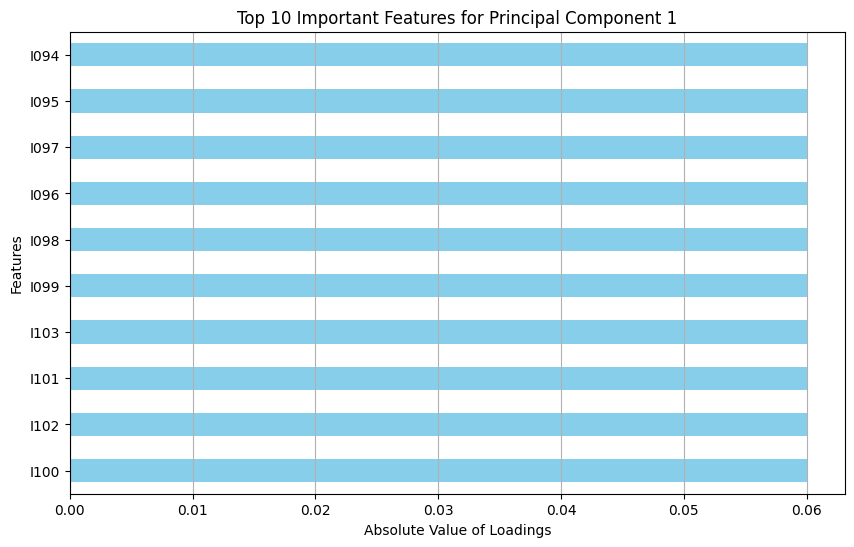

In [ ]:
components = pd.DataFrame(pca_2.components_, columns=X_pbs_seen.columns)
importance = components.abs()

top_features = {}
for i in range(2):
    top_features[f'PC{i+1}'] = importance.iloc[i].nlargest(10)

for pc, features in top_features.items():
    print(f"\nTop 10 Features for {pc}:")
    print(features)

plt.figure(figsize=(10, 6))
importance.iloc[0].nlargest(10).plot(kind='barh', color='skyblue')
plt.title('Top 10 Important Features for Principal Component 1')
plt.xlabel('Absolute Value of Loadings')
plt.ylabel('Features')
plt.grid(axis='x')
plt.show()


PCA Components DataFrame (Absolute Values):
           I001      I002      I003      I004      I005      I006      I007  \
PC_1  0.059109  0.059279  0.059344  0.059324  0.059356  0.059312  0.059377   
PC_2  0.011409  0.011116  0.011087  0.011028  0.011015  0.011346  0.011749   

          I008      I009      I010  ...      I503      I504      I505  \
PC_1  0.059449  0.059427  0.059505  ...  0.032111  0.032718  0.032043   
PC_2  0.011829  0.011580  0.011335  ...  0.046427  0.046258  0.046395   

          I506      I507      I508      I509      I510      I511      I512  
PC_1  0.032401  0.034759  0.035782  0.035806  0.035862  0.035340  0.035114  
PC_2  0.047305  0.046247  0.044957  0.043500  0.041531  0.041338  0.040852  

[2 rows x 512 columns]


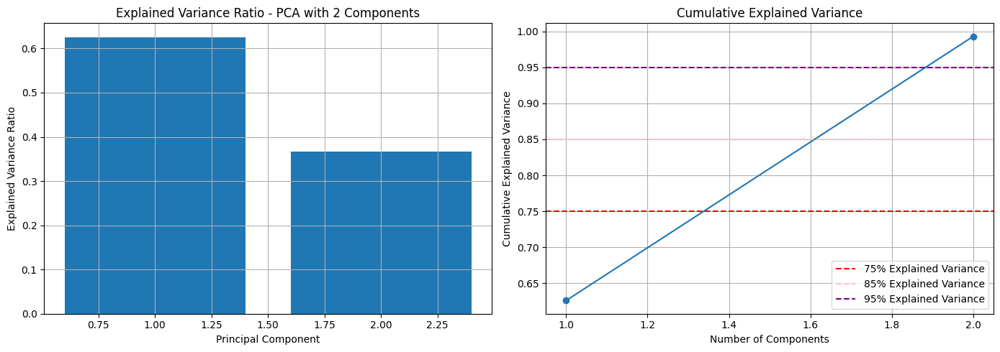

In [ ]:
def perform_pca(data, num_components=10):

    pca = PCA(n_components=num_components)
    pca_data = pca.fit_transform(data)
    return pca, pca_data

pca_2, pca_data_2 = perform_pca(X_pbs_seen, num_components=2)
dataset_pca = pd.DataFrame(abs(pca_2.components_), columns=X_pbs_seen.columns, index=['PC_1', 'PC_2'])
print('\nPCA Components DataFrame (Absolute Values):\n', dataset_pca)

def plot_variance_analysis(pca, title):
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center')
    axes[0].set_xlabel('Principal Component')
    axes[0].set_ylabel('Explained Variance Ratio')
    axes[0].set_title(f'Explained Variance Ratio - {title}')
    axes[0].grid()

    axes[1].plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
    axes[1].axhline(y=0.75, color='red', linestyle='--', label='75% Explained Variance')
    axes[1].axhline(y=0.85, color='pink', linestyle='--', label='85% Explained Variance')
    axes[1].axhline(y=0.95, color='purple', linestyle='--', label='95% Explained Variance')
    axes[1].set_xlabel("Number of Components")
    axes[1].set_ylabel("Cumulative Explained Variance")
    axes[1].set_title("Cumulative Explained Variance")
    axes[1].grid()
    axes[1].legend()

    plt.tight_layout()
    plt.show()

plot_variance_analysis(pca_2, 'PCA with 2 Components')


Parameter: 2, Silhouette Score: 0.5771, Inertia: 401144.4661
Parameter: 3, Silhouette Score: 0.5802, Inertia: 172635.8285
Parameter: 4, Silhouette Score: 0.4885, Inertia: 122506.1220
Parameter: 5, Silhouette Score: 0.5560, Inertia: 79052.3197
Parameter: 6, Silhouette Score: 0.5882, Inertia: 54722.3563
Parameter: 7, Silhouette Score: 0.5800, Inertia: 41731.4359
Parameter: 8, Silhouette Score: 0.5964, Inertia: 32744.5000
Parameter: 9, Silhouette Score: 0.6112, Inertia: 26579.8520
Parameter: 10, Silhouette Score: 0.6268, Inertia: 22560.8471


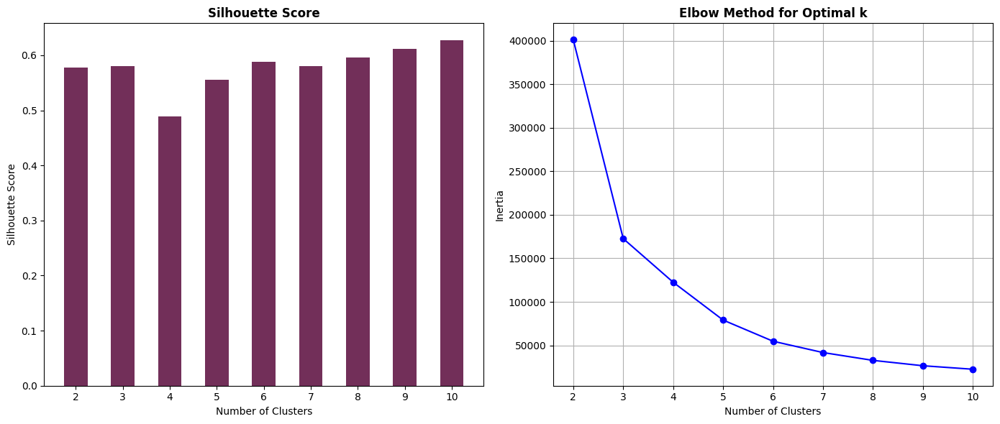

Best Number of Clusters based on Silhouette Score: 10 with a score of 0.6268


In [ ]:
parameters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1
silhouette_scores = []
inertia_scores = []

for p in parameter_grid:
    kmeans_model = KMeans(n_clusters=p['n_clusters'], n_init=50, random_state=42)
    kmeans_model.fit(pca_data_2)

    ss = metrics.silhouette_score(pca_data_2, kmeans_model.labels_)
    silhouette_scores.append(ss)

    inertia = kmeans_model.inertia_
    inertia_scores.append(inertia)

    print(f'Parameter: {p["n_clusters"]}, Silhouette Score: {ss:.4f}, Inertia: {inertia:.4f}')

    if ss > best_score:
        best_score = ss
        best_grid = p

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.bar(range(len(silhouette_scores)), silhouette_scores, align='center', color='#722f59', width=0.5)
plt.xticks(range(len(silhouette_scores)), parameters)
plt.title('Silhouette Score', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.subplot(1, 2, 2)
plt.plot(parameters, inertia_scores, marker='o', color='b')
plt.title('Elbow Method for Optimal k', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid()

plt.tight_layout()
plt.show()

print(f'Best Number of Clusters based on Silhouette Score: {best_grid["n_clusters"]} with a score of {best_score:.4f}')


In [ ]:
pca_data_2.shape

(1337, 2)

In [ ]:
kmeans1 = KMeans(n_clusters=6,
                random_state=3,
                n_init=1).fit(pca_data_2)
kmeans20 = KMeans(n_clusters=6,
                  random_state=3,
                  n_init=20).fit(pca_data_2);
kmeans50 = KMeans(n_clusters=6,
                  random_state=3,
                  n_init=50).fit(pca_data_2);
kmeans1.inertia_, kmeans20.inertia_, kmeans50.inertia_

(79098.38119701094, 54722.35632203304, 54722.35632203304)

In [ ]:
kmeans20.fit(pca_data_2)

KMeans(n_clusters=6, n_init=20, random_state=3)

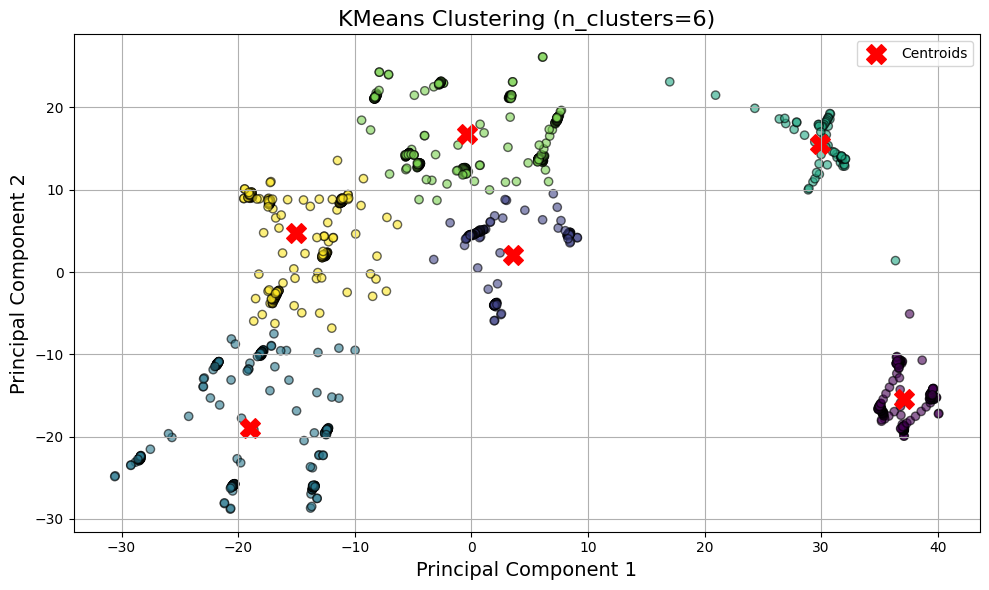

In [ ]:
n_clusters = 6

labels = kmeans20.labels_
centroids = kmeans20.cluster_centers_

plt.figure(figsize=(10, 6))
plt.scatter(pca_data_2[:, 0], pca_data_2[:, 1], c=labels, cmap='viridis', marker='o', alpha=0.6, edgecolor='k')

plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title(f'KMeans Clustering (n_clusters={n_clusters})', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=14)
plt.ylabel('Principal Component 2', fontsize=14)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
X_pbs_seen = X_pbs_seen.copy()
X_pbs_seen['Cluster'] = labels

X_pbs_seen['Load'] = y_pbs_seen.values

cluster_viral_loads = X_pbs_seen.groupby('Cluster')['Load'].mean()
print("Mean viral load for each cluster:\n", cluster_viral_loads)

X_pbs_seen['Predicted Viral Load'] = X_pbs_seen['Cluster'].map(cluster_viral_loads)
print(X_pbs_seen[['Cluster', 'Load', 'Predicted Viral Load']].head())

mse_seen = mean_squared_error(X_pbs_seen['Load'], X_pbs_seen['Predicted Viral Load'])
print(f"Mean Squared Error for the 'seen' dataset: {mse_seen:.4f}")


Mean viral load for each cluster:
 Cluster
0    2.492462
1    3.946667
2    4.518644
3    4.983607
4    3.150685
5    5.228464
Name: Load, dtype: float64
   Cluster  Load  Predicted Viral Load
0        0     1              2.492462
1        0     1              2.492462
2        0     1              2.492462
3        0     1              2.492462
4        0     1              2.492462
Mean Squared Error for the 'seen' dataset: 3.3476


## Unseen - pbs

In [ ]:
pca_pbs_unseen = pca_2.transform(X_pbs_unseen)

X_pbs_unseen['Cluster'] = kmeans20.predict(pca_pbs_unseen)
X_pbs_unseen['Predicted Viral Load'] = X_pbs_unseen['Cluster'].map(cluster_viral_loads)

X_pbs_unseen['Load'] = y_pbs_unseen
mse_unseen = mean_squared_error(X_pbs_unseen['Load'], X_pbs_unseen['Predicted Viral Load'])

print("Predicted Viral Loads for the 'unseen' dataset:")
print(X_pbs_unseen[['Cluster', 'Load', 'Predicted Viral Load']])
print(f"Mean Squared Error for the 'unseen' dataset: {mse_unseen:.4f}")


Predicted Viral Loads for the 'unseen' dataset:
      Cluster  Load  Predicted Viral Load
1337        4     1              3.150685
1338        4     1              3.150685
1339        4     1              3.150685
1340        4     1              3.150685
1341        4     1              3.150685
...       ...   ...                   ...
1906        5     8              5.228464
1907        5     8              5.228464
1908        5     8              5.228464
1909        5     8              5.228464
1910        5     8              5.228464

[574 rows x 3 columns]
Mean Squared Error for the 'unseen' dataset: 2.8930


<ipython-input-465-732125fe8304>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pbs_unseen['Cluster'] = kmeans20.predict(pca_pbs_unseen)
<ipython-input-465-732125fe8304>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pbs_unseen['Predicted Viral Load'] = X_pbs_unseen['Cluster'].map(cluster_viral_loads)
<ipython-input-465-732125fe8304>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

## Spectral Clustering

In [ ]:
X_dmem = dmem_train.drop(['Load', 'Matrix'], axis=1)
y_dmem = dmem_train['Load']

split_index_dmem = int(0.70 * len(X_dmem))

X_dmem_seen, X_dmem_unseen = X_dmem[:split_index_dmem], X_dmem[split_index_dmem:]
y_dmem_seen, y_dmem_unseen= y_dmem[:split_index_dmem], y_dmem[split_index_dmem:]

X_pbs = pbs_train.drop(['Load', 'Matrix'], axis=1)
y_pbs = pbs_train['Load']

split_index_pbs = int(0.70 * len(X_pbs))

X_pbs_seen, X_pbs_unseen = X_pbs[:split_index_pbs], X_pbs[split_index_pbs:]
y_pbs_seen, y_pbs_unseen = y_pbs[:split_index_pbs], y_pbs[split_index_pbs:]


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 2, Silhouette Score: -0.0869


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 3, Silhouette Score: 0.1394


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 4, Silhouette Score: 0.3153


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 5, Silhouette Score: 0.3134


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 6, Silhouette Score: 0.3169


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 7, Silhouette Score: 0.3774


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 8, Silhouette Score: 0.3735


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 9, Silhouette Score: 0.3033


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of Clusters: 10, Silhouette Score: 0.2532


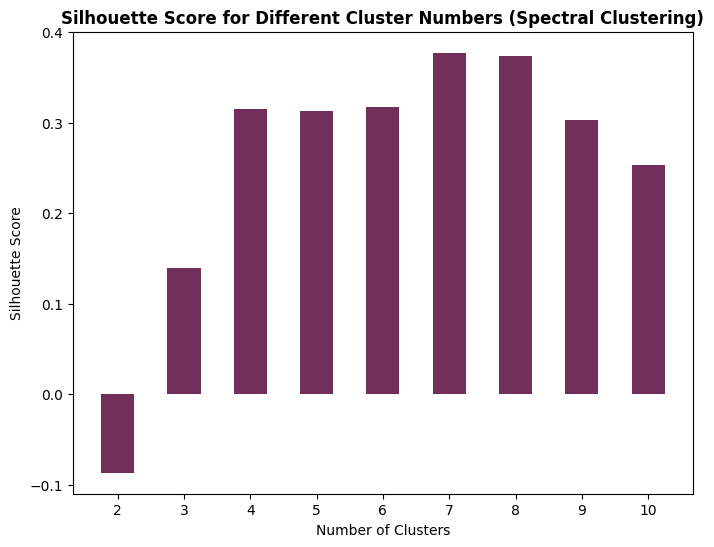

Best Number of Clusters based on Silhouette Score: 7 with a score of 0.3774


In [ ]:
parameters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1
silhouette_scores = []

for p in parameter_grid:
    spectral_model = SpectralClustering(n_clusters=p['n_clusters'], affinity='nearest_neighbors', n_neighbors=10, random_state=42)
    labels = spectral_model.fit_predict(pca_data_2)

    ss = metrics.silhouette_score(pca_data_2, labels)
    silhouette_scores.append(ss)
    print(f'Number of Clusters: {p["n_clusters"]}, Silhouette Score: {ss:.4f}')

    if ss > best_score:
        best_score = ss
        best_grid = p

plt.figure(figsize=(8, 6))

plt.bar(range(len(silhouette_scores)), silhouette_scores, align='center', color='#722f59', width=0.5)
plt.xticks(range(len(silhouette_scores)), parameters)
plt.title('Silhouette Score for Different Cluster Numbers (Spectral Clustering)', fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.show()

print(f'Best Number of Clusters based on Silhouette Score: {best_grid["n_clusters"]} with a score of {best_score:.4f}')


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


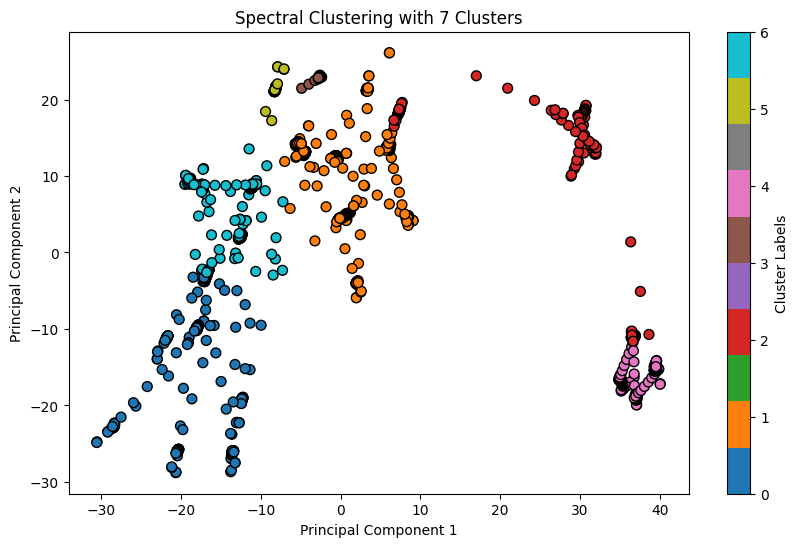

In [ ]:
n_clusters = 7
spectral_model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_neighbors=10, random_state=42)
labels = spectral_model.fit_predict(pca_data_2)

plt.figure(figsize=(10, 6))

scatter = plt.scatter(pca_data_2[:, 0], pca_data_2[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50)
plt.colorbar(scatter, ticks=range(n_clusters), label="Cluster Labels")
plt.title(f"Spectral Clustering with {n_clusters} Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.show()


In [ ]:
print(f"Shape of pca_data_2: {pca_data_2.shape}")
print(f"Shape of X_dmem_seen: {X_pbs_seen.shape}")

if pca_data_2.shape[0] != X_pbs_seen.shape[0]:
    print("Warning: Number of rows in pca_data_2 and X_dmem_seen are different.")
else:
    labels = spectral_model.fit_predict(pca_data_2)
    X_pbs_seen['Cluster'] = labels
    X_pbs_seen['Load'] = y_pbs_seen.values

    cluster_viral_loads = X_pbs_seen.groupby('Cluster')['Load'].mean()
    print("Mean viral load for each cluster:\n", cluster_viral_loads)

    X_pbs_seen['Predicted Viral Load'] = X_pbs_seen['Cluster'].map(cluster_viral_loads)
    mse = mean_squared_error(X_pbs_seen['Load'], X_pbs_seen['Predicted Viral Load'])
    print(f"Mean Squared Error of Spectral Clustering-Based Prediction: {mse:.4f}")


Shape of pca_data_2: (1337, 2)
Shape of X_dmem_seen: (1337, 512)


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Mean viral load for each cluster:
 Cluster
0    4.639394
1    3.500000
2    4.101911
3    1.000000
4    2.622517
5    2.000000
6    5.177489
Name: Load, dtype: float64
Mean Squared Error of Spectral Clustering-Based Prediction: 3.3453


<ipython-input-470-c305cfd98b1f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pbs_seen['Cluster'] = labels
<ipython-input-470-c305cfd98b1f>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pbs_seen['Load'] = y_pbs_seen.values
<ipython-input-470-c305cfd98b1f>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gu